<a href="https://colab.research.google.com/github/Keitokuch/IDL-team-g6/blob/master/experiment/noMusic_dataAug" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0.0 fetch git repo

In [ ]:
!git clone xxx src
import sys
sys.path.append('src')

## 1.1 Check GPU

In [ ]:
!nvidia-smi --query-gpu=gpu_name,driver_version,memory.total --format=csv

name, driver_version, memory.total [MiB]
Tesla P100-PCIE-16GB, 460.32.03, 16280 MiB


## 1.2 Connect to google drive

In [ ]:
# Connect Google drive
from google.colab import drive
drive.mount("/content/gdrive", force_remount=True)

Mounted at /content/gdrive


## 1.3 Import library and define global variable

In [ ]:
import sys
import numpy as np
import pandas as pd
import os
import time
import string
import torch
import torchvision 
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.utils.rnn as rnn_utils
import torch.nn.utils.rnn as rnn
import torch.optim as optim
import seaborn as sns
import matplotlib.pyplot as plt
import time
import random
from tqdm.notebook import tqdm
from torch.utils.data import Dataset, DataLoader
from torch.distributions.gumbel import Gumbel
from termcolor import cprint
from matplotlib.ticker import MaxNLocator
from torch.cuda.amp import autocast

!pip install num2words
from num2words import num2words

!pip install python-levenshtein
import Levenshtein

!pip install torch-summary
import torchsummary

!pip install torchaudio
import torchaudio

cuda = torch.cuda.is_available()
print(cuda, sys.version)
device = torch.device("cuda" if cuda else "cpu")
device

True 3.7.10 (default, May  3 2021, 02:48:31) 
[GCC 7.5.0]


device(type='cuda')

## 1.4 Load Source

In [ ]:
# Execute to pull from github
%cd /content/src
!git pull

# Import code
from constant import LETTER_LIST
from utils import *
from preprocess import preprocess, get_letter_vocab
from datasets import KnnwAudioDataset, collate

from speech_model import *
from training import LASSession
from training import thred_sched, LRSched_0arg

from data_augment import *

/content/src
Already up to date.


## 2.1 Load and Preprocess Data

In [ ]:
PROJ="/content/gdrive/MyDrive/11785/11785Project/data"
%cd $PROJ
# Load data
# sub_data_path = "./knnw_en_sub.csv"
sub_data_path = "knnw_en_sub_labeled.csv"
sub_df = pd.read_table(sub_data_path, sep = ";", header=0)
# audio_path = "./knnw_en.log_spectrogram.npy"
audio_path = "./log_spectrogram.npy"
audio_data = np.load(audio_path).transpose()
print(sub_df.shape)
print(audio_data.shape)

/content/gdrive/.shortcut-targets-by-id/1nFHCtUbxTfWD0vW9CiANn58b6Rg7JhIt/11785Project/data
(1393, 5)
(1370493, 129)


In [ ]:
processed_df = preprocess(sub_df, remove_music=True)

print("Letter vocab:", get_letter_vocab(processed_df["Processed Text"]))
processed_df

Number of lines: 1252 -> 1150
Letter vocab: {'r', 'a', 'n', 's', 'd', 'o', 'u', 'i', 'b', 'w', "'", ' ', '-', 't', 'j', 'k', 'e', 'v', 'p', 'x', 'y', 'z', 'l', 'f', 'm', 'g', 'c', 'h', 'q'}


,Number,Start time in ms,End time in ms,Text,Speaker Label,Processed Text,Transcript Indices
1,2,53940,58090,"Some mornings, I wake up crying without knowin...",Mitsuha,some mornings i wake up crying without knowing...,"[19, 15, 13, 5, 32, 13, 15, 18, 14, 9, 14, 7, ..."
2,3,58700,61440,That's when everything happens now and again.,Mitsuha,that's when everything happens now and again,"[20, 8, 1, 20, 28, 19, 32, 23, 8, 5, 14, 32, 5..."
3,4,62060,66540,"Whatever that dream was I had, I can never rem...",Taki,whatever that dream was i had i can never reme...,"[23, 8, 1, 20, 5, 22, 5, 18, 32, 20, 8, 1, 20,..."
4,5,66540,69550,- But... - But...,Taki+Mitsuha,but but,"[2, 21, 20, 32, 2, 21, 20, 33]"
5,6,69550,72190,the only thing that does last when I wake up,Mitsuha,the only thing that does last when i wake up,"[20, 8, 5, 32, 15, 14, 12, 25, 32, 20, 8, 9, 1..."
...,...,...,...,...,...,...,...
1322,1323,6030350,6031250,Have I...,Taki,have i,"[8, 1, 22, 5, 32, 9, 33]"
1323,1324,6031250,6033970,met you somewhere?,Taki,met you somewhere,"[13, 5, 20, 32, 25, 15, 21, 32, 19, 15, 13, 5,..."
1324,1325,6041560,6043690,"Mitsuha: I thought so, too!",Mitsuha,i thought so too,"[9, 32, 20, 8, 15, 21, 7, 8, 20, 32, 19, 15, 3..."
1325,1326,6047690,6049230,- Can I ask you... - Can I ask you...,Mitsuha+Taki,can i ask you can i ask you,"[3, 1, 14, 32, 9, 32, 1, 19, 11, 32, 25, 15, 2..."


In [ ]:
processed_df[["Number", "Processed Text", "Speaker Label"]].to_csv("processed_sub.csv")

## 2.2 Dataset & Dataloader

In [ ]:
train_df, test_df = random_split(processed_df, 0.15, seed=10010)
print(train_df.shape, test_df.shape)


DATASET = KnnwAudioDataset

train_dataset = DATASET(audio_data, train_df, data_aug=True, total_frames=len(audio_data))
test_dataset = DATASET(audio_data, test_df, total_frames=len(audio_data))

train_loader = DataLoader(train_dataset, 32, shuffle=True, collate_fn=collate,
                                num_workers=4,  pin_memory=True)
test_loader = DataLoader(test_dataset, 32, shuffle=False, collate_fn=collate,
                                num_workers=4, pin_memory=True)

train_df.iloc[:5]

(978, 7) (172, 7)


,Number,Start time in ms,End time in ms,Text,Speaker Label,Processed Text,Transcript Indices
506,507,2352400,2359700,"It was a date I wanted to go on, but if it so ...",Mitsuha,it was a date i wanted to go on but if it so h...,"[9, 20, 32, 23, 1, 19, 32, 1, 32, 4, 1, 20, 5,..."
40,41,224120,226140,Taki...,Mitsuha,taki,"[20, 1, 11, 9, 33]"
110,111,530450,534010,"Two light."" That's the origin of the word twil...",Teacher,two light that's the origin of the word twilight,"[20, 23, 15, 32, 12, 9, 7, 8, 20, 32, 20, 8, 1..."
115,116,546510,550350,Another older term for it is dusk light.,Teacher,another older term for it is dusk light,"[1, 14, 15, 20, 8, 5, 18, 32, 15, 12, 4, 5, 18..."
793,794,3871410,3872660,Totally...,Yotsuha,totally,"[20, 15, 20, 1, 12, 12, 25, 33]"


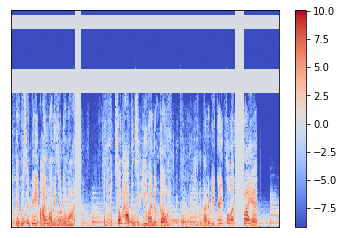

In [ ]:
plot_spectrogram(train_dataset[0][0].cpu().numpy())

## Session Training

In [ ]:
%cd /content/gdrive/MyDrive/11785/11785Project/sessions/
# Transfer Model
def transfer_encoder(model):
    model.encoder = Encoder(129, 256, 3, 0)
    return model
    
def transfer_encoder_lstm(model):
    model.encoder.lstm = nn.LSTM(input_size=129, hidden_size=256, num_layers=2, dropout=0.3,
                            bidirectional=True, batch_first=True).to(device)
    return model

/content/gdrive/.shortcut-targets-by-id/1nFHCtUbxTfWD0vW9CiANn58b6Rg7JhIt/11785Project/sessions


In [ ]:
session = LASSession('noMusic_dataAug',
                        lambda: transfer_encoder_lstm(LASSession('hw4p2').load_checkpoint("best").model),
                        lambda m: torch.optim.Adam(m.parameters(), lr=1e-4),
                        nn.CrossEntropyLoss(reduction='none'),
                        train_data=train_loader,
                        val_data=test_loader,
                        use_amp=False,
                        sched_factory=LRSched_0arg(
                            lambda op: 
                            optim.lr_scheduler.MultiStepLR(op, [150, 250, 350, 450], 0.6, verbose=True)),
                        tf_sched=lambda e: thred_sched(e, 300, 0.005, init=0.9, minval=0.65),
                        af_sched=lambda e: thred_sched(e, 80, 0.05, init=1, minval=0)
)

Loaded checkpoint hw4p2/last
Restored to epoch 78
Loaded checkpoint hw4p2/best
Adjusting learning rate of group 0 to 1.0000e-04.


Loaded checkpoint hw4p2/last
Restored to epoch 78
Loaded checkpoint hw4p2/best
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 1/600 tf=0.9 af=1


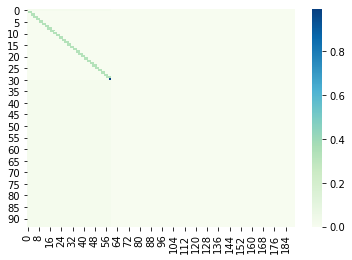

Train Dist: 57.56 Train Loss: 91.04


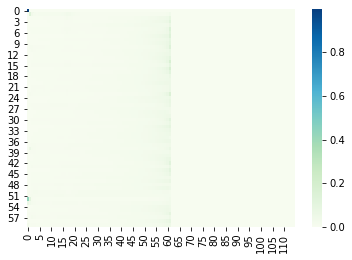

Val Dist: 52.19 Val Loss: 114.76
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 2/600 tf=0.9 af=1


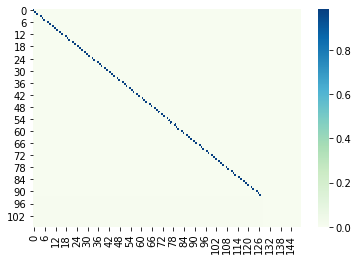

Train Dist: 70.68 Train Loss: 70.05


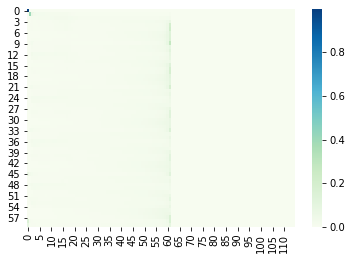

Val Dist: 63.79 Val Loss: 121.38
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 3/600 tf=0.9 af=1


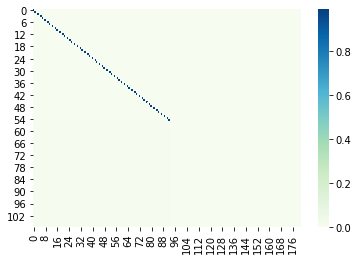

Train Dist: 69.93 Train Loss: 65.31


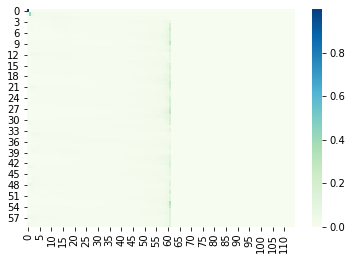

Val Dist: 62.98 Val Loss: 125.63
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 4/600 tf=0.9 af=1


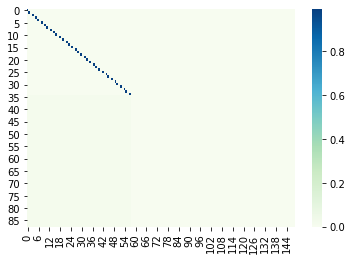

Train Dist: 73.82 Train Loss: 63.29


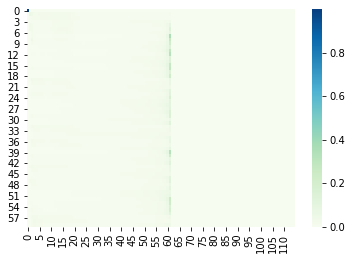

Val Dist: 61.17 Val Loss: 129.79
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 5/600 tf=0.9 af=1


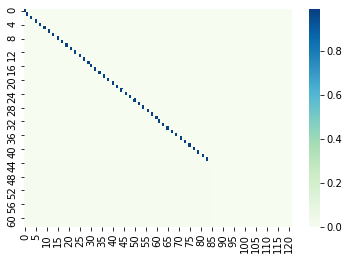

Train Dist: 70.73 Train Loss: 62.05


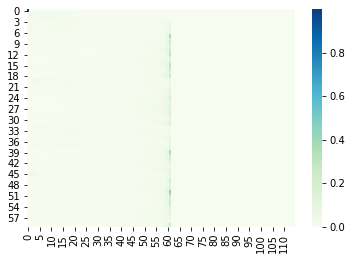

Val Dist: 60.94 Val Loss: 129.61
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 6/600 tf=0.9 af=1


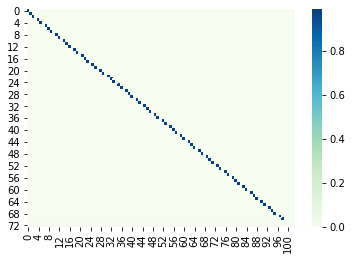

Train Dist: 71.35 Train Loss: 60.14


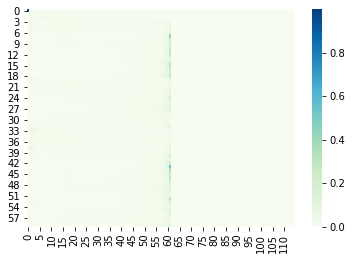

Val Dist: 60.91 Val Loss: 132.12
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 7/600 tf=0.9 af=1


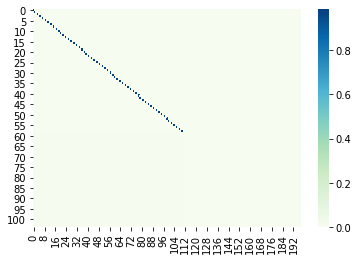

Train Dist: 70.95 Train Loss: 59.56


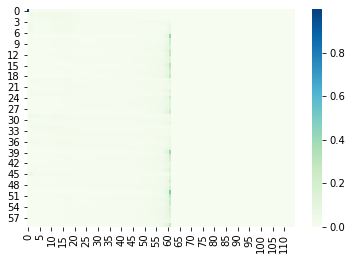

Val Dist: 61.87 Val Loss: 132.40
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 8/600 tf=0.9 af=1


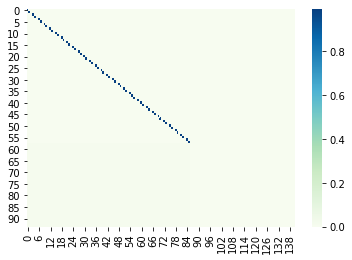

Train Dist: 68.70 Train Loss: 60.01


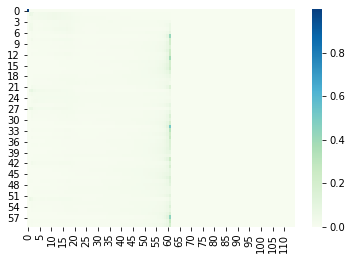

Val Dist: 64.90 Val Loss: 133.92
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 9/600 tf=0.9 af=1


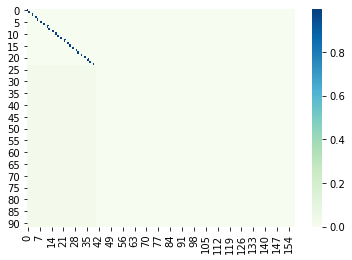

Train Dist: 72.90 Train Loss: 58.49


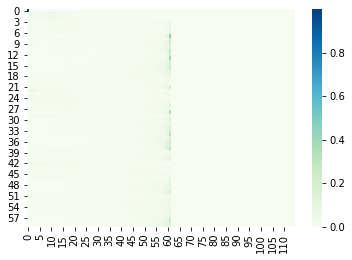

Val Dist: 64.87 Val Loss: 137.91
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 10/600 tf=0.9 af=1


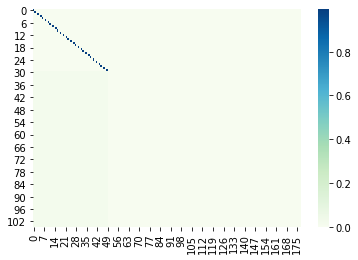

Train Dist: 72.42 Train Loss: 56.18


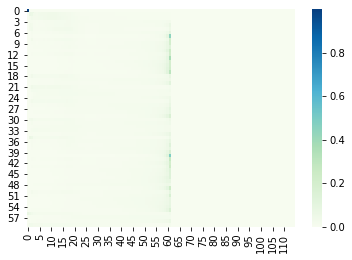

Val Dist: 63.59 Val Loss: 138.26
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 11/600 tf=0.9 af=1


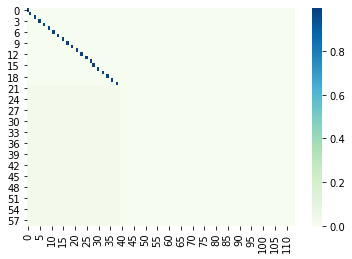

Train Dist: 68.61 Train Loss: 55.74


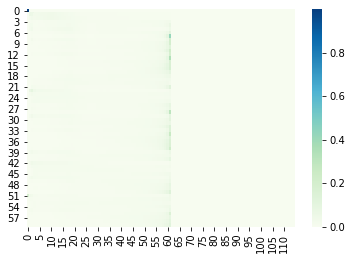

Val Dist: 64.60 Val Loss: 138.21
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 12/600 tf=0.9 af=1


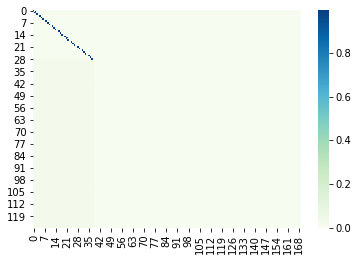

Train Dist: 70.19 Train Loss: 57.57


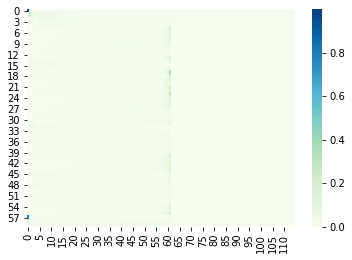

Val Dist: 60.14 Val Loss: 139.07
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 13/600 tf=0.9 af=1


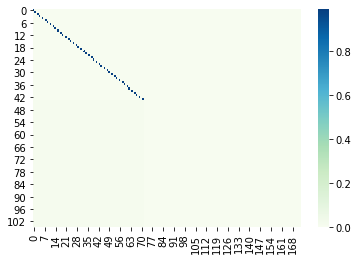

Train Dist: 68.56 Train Loss: 56.29


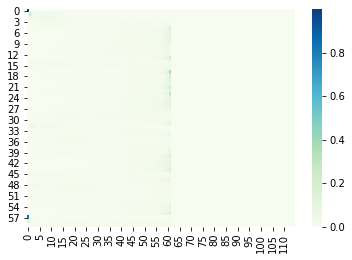

Val Dist: 63.47 Val Loss: 138.99
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 14/600 tf=0.9 af=1


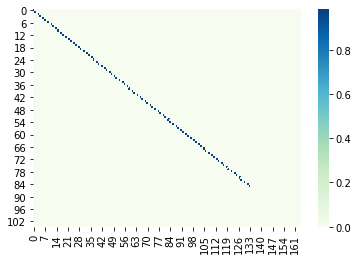

Train Dist: 70.56 Train Loss: 54.63


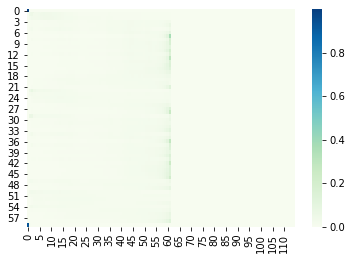

Val Dist: 58.51 Val Loss: 139.22
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 15/600 tf=0.9 af=1


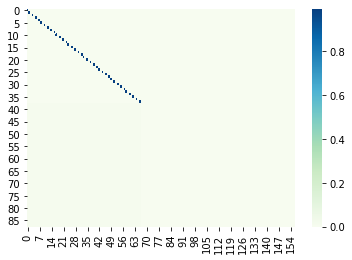

Train Dist: 68.17 Train Loss: 55.32


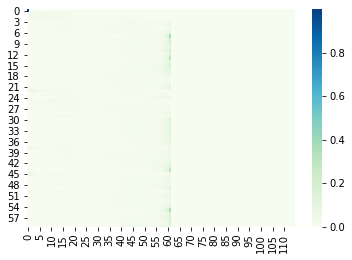

Val Dist: 59.51 Val Loss: 140.33
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 16/600 tf=0.9 af=1


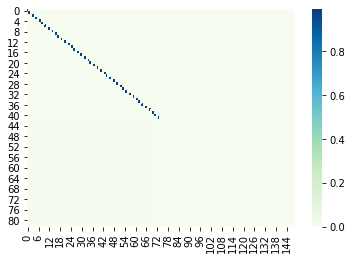

Train Dist: 67.80 Train Loss: 53.25


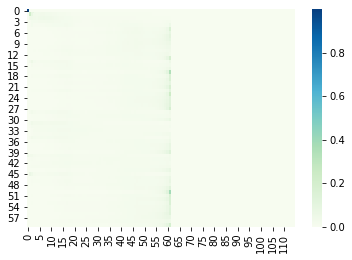

Val Dist: 55.48 Val Loss: 139.54
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 17/600 tf=0.9 af=1


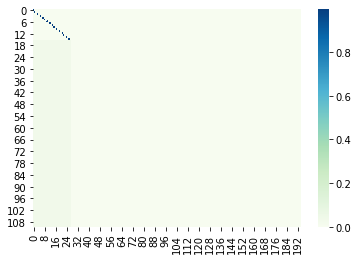

Train Dist: 68.97 Train Loss: 53.73


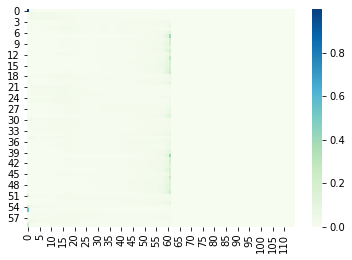

Val Dist: 60.56 Val Loss: 141.72
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 18/600 tf=0.9 af=1


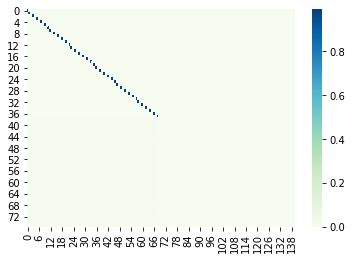

Train Dist: 66.87 Train Loss: 54.42


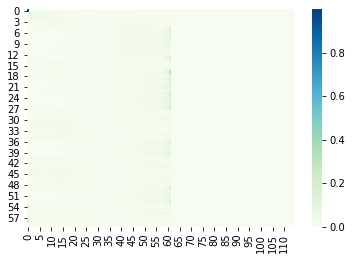

Val Dist: 60.89 Val Loss: 140.27
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 19/600 tf=0.9 af=1


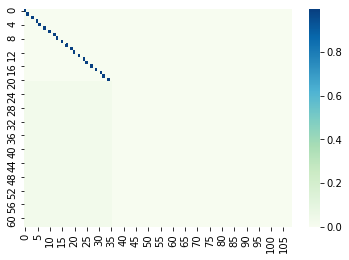

Train Dist: 68.68 Train Loss: 52.27


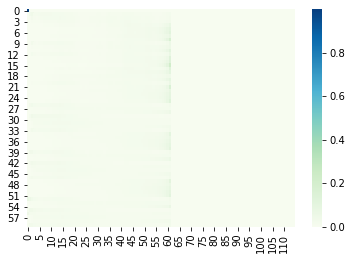

Val Dist: 58.66 Val Loss: 145.87
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 20/600 tf=0.9 af=1


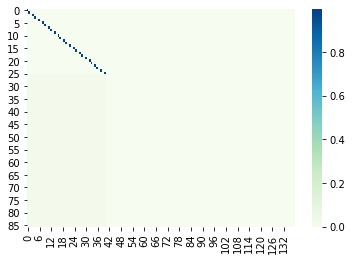

Train Dist: 66.02 Train Loss: 52.43


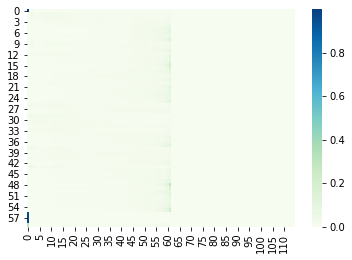

Val Dist: 59.74 Val Loss: 145.19
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 21/600 tf=0.9 af=1


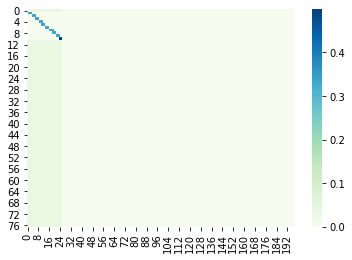

Train Dist: 69.15 Train Loss: 52.01


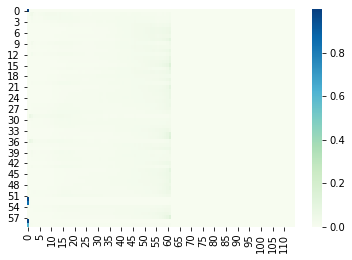

Val Dist: 61.15 Val Loss: 147.05
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 22/600 tf=0.9 af=1


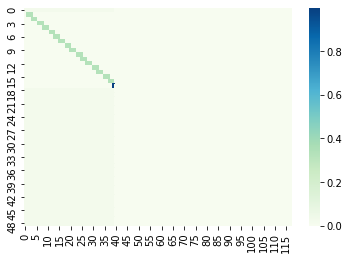

Train Dist: 65.94 Train Loss: 51.44


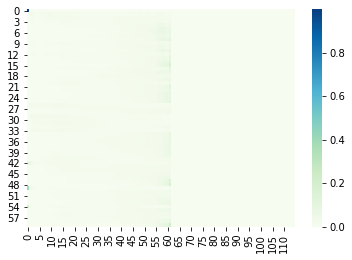

Val Dist: 63.55 Val Loss: 149.41
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 23/600 tf=0.9 af=1


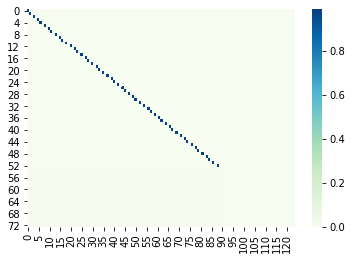

Train Dist: 64.78 Train Loss: 50.81


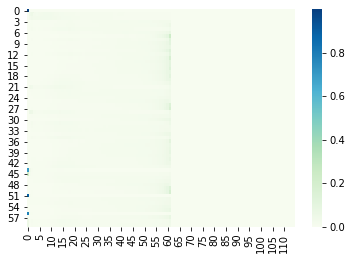

Val Dist: 63.53 Val Loss: 146.29
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 24/600 tf=0.9 af=1


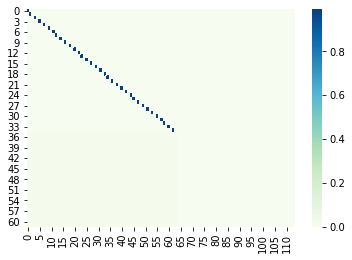

Train Dist: 64.40 Train Loss: 51.50


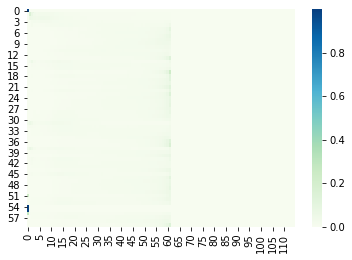

Val Dist: 63.23 Val Loss: 144.11
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 25/600 tf=0.9 af=1


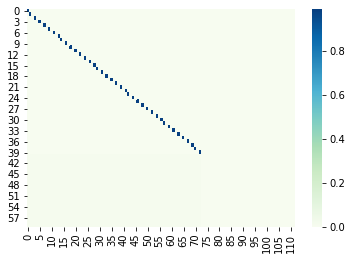

Train Dist: 64.41 Train Loss: 51.13


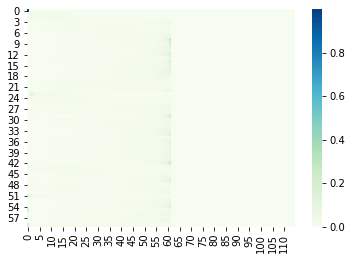

Val Dist: 56.66 Val Loss: 143.65
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 26/600 tf=0.9 af=1


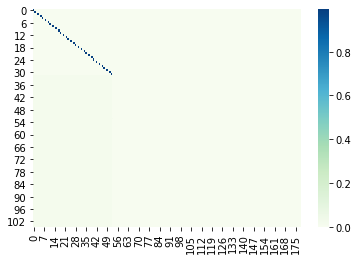

Train Dist: 63.04 Train Loss: 51.58


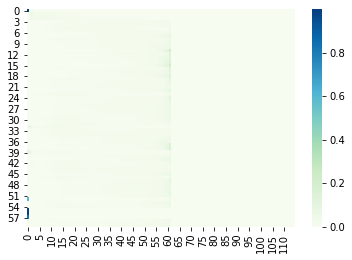

Val Dist: 60.14 Val Loss: 143.01
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 27/600 tf=0.9 af=1


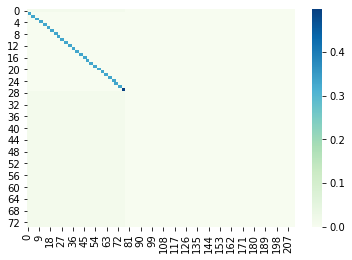

Train Dist: 64.20 Train Loss: 50.26


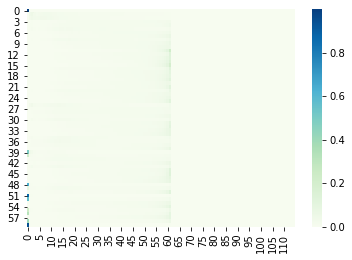

Val Dist: 54.34 Val Loss: 143.04
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 28/600 tf=0.9 af=1


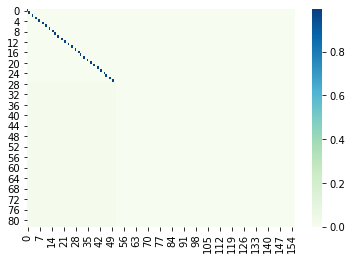

Train Dist: 63.23 Train Loss: 51.65


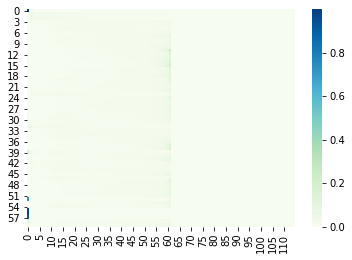

Val Dist: 61.34 Val Loss: 145.51
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 29/600 tf=0.9 af=1


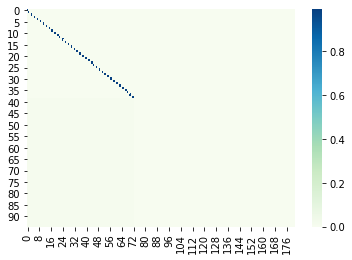

Train Dist: 63.57 Train Loss: 49.37


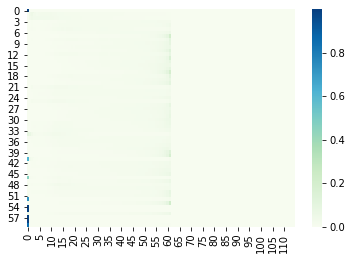

Val Dist: 59.87 Val Loss: 144.55
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 30/600 tf=0.9 af=1


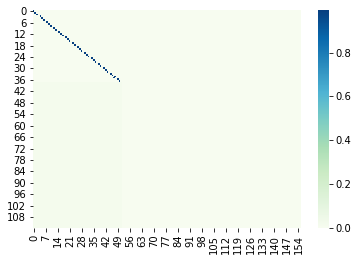

Train Dist: 62.16 Train Loss: 50.38


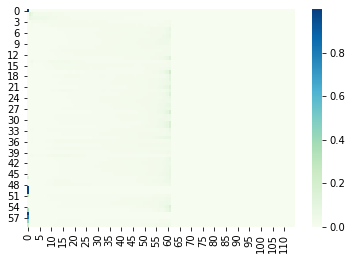

Val Dist: 59.15 Val Loss: 149.45
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 31/600 tf=0.9 af=1


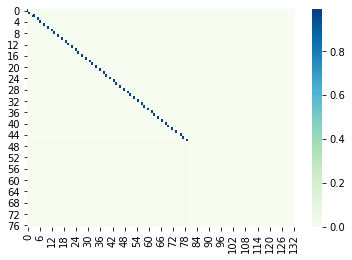

Train Dist: 62.91 Train Loss: 49.59


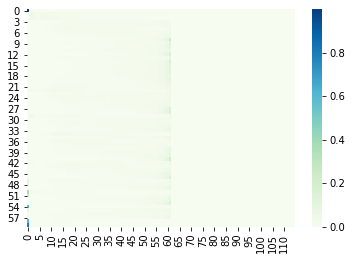

Val Dist: 58.51 Val Loss: 146.72
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 32/600 tf=0.9 af=1


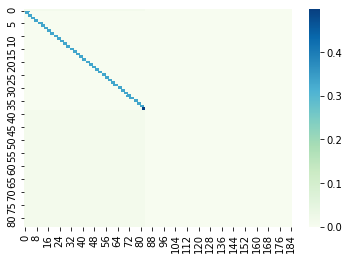

Train Dist: 62.08 Train Loss: 49.92


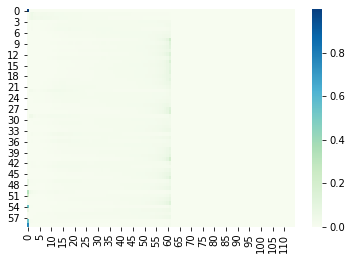

Val Dist: 56.48 Val Loss: 142.66
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 33/600 tf=0.9 af=1


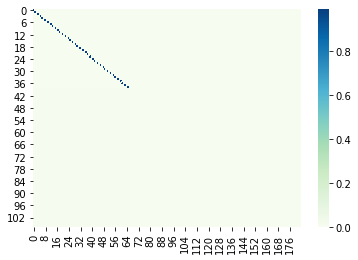

Train Dist: 61.70 Train Loss: 49.71


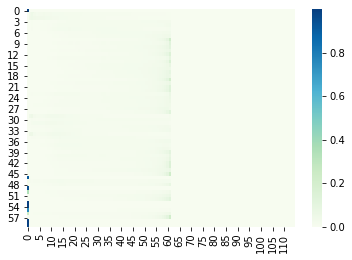

Val Dist: 54.59 Val Loss: 145.06
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 34/600 tf=0.9 af=1


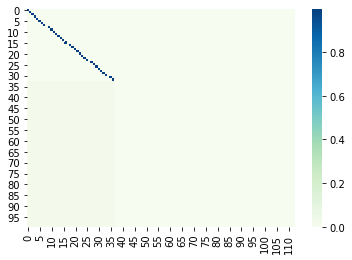

Train Dist: 60.99 Train Loss: 48.68


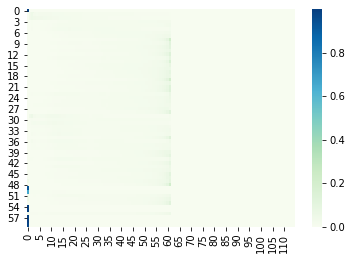

Val Dist: 52.45 Val Loss: 144.44
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 35/600 tf=0.9 af=1


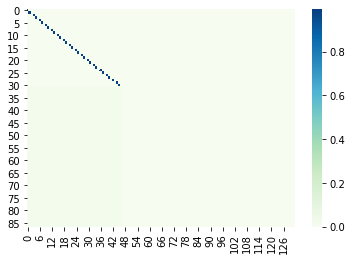

Train Dist: 60.86 Train Loss: 48.67


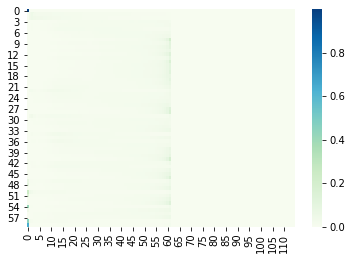

Val Dist: 58.28 Val Loss: 150.03
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 36/600 tf=0.9 af=1


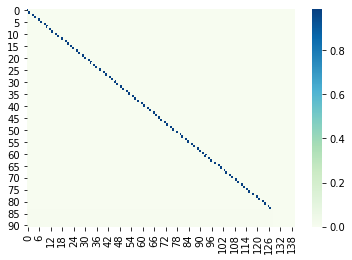

Train Dist: 61.06 Train Loss: 48.96


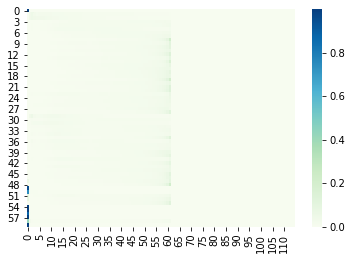

Val Dist: 51.75 Val Loss: 146.75
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 37/600 tf=0.9 af=1


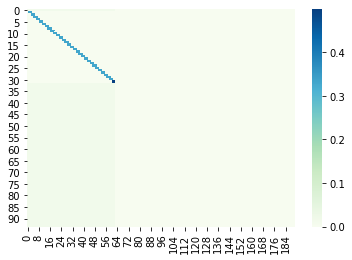

Train Dist: 60.53 Train Loss: 47.04


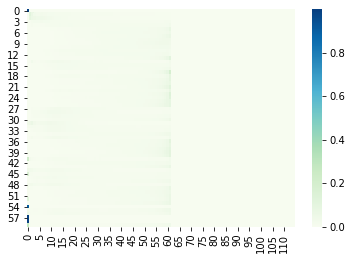

Val Dist: 53.20 Val Loss: 148.47
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 38/600 tf=0.9 af=1


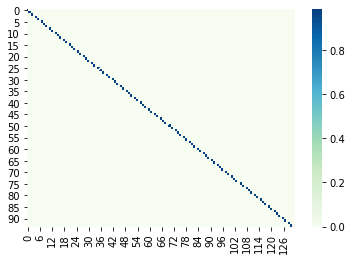

Train Dist: 61.16 Train Loss: 47.73


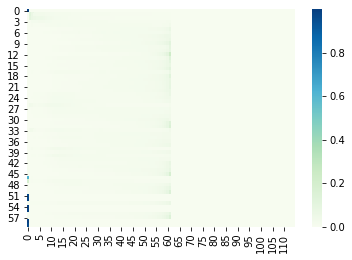

Val Dist: 54.71 Val Loss: 150.48
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 39/600 tf=0.9 af=1


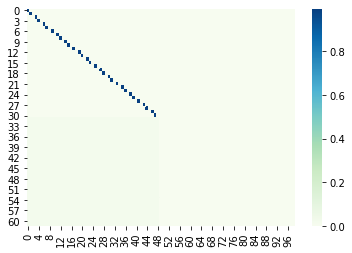

Train Dist: 58.97 Train Loss: 48.51


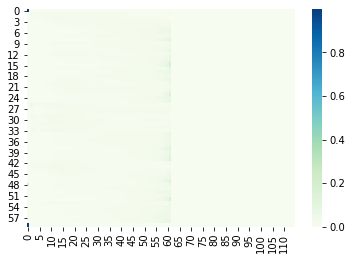

Val Dist: 58.45 Val Loss: 149.89
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 40/600 tf=0.9 af=1


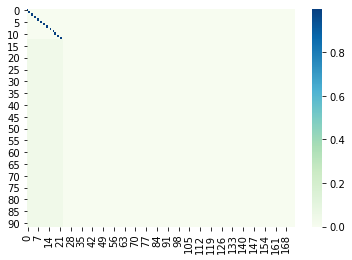

Train Dist: 58.20 Train Loss: 47.78


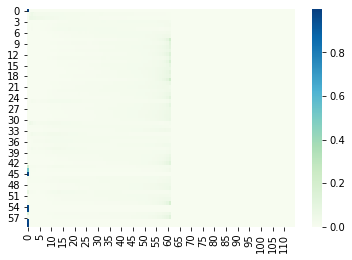

Val Dist: 49.81 Val Loss: 149.07
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 41/600 tf=0.9 af=1


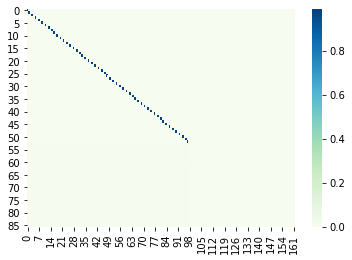

Train Dist: 59.39 Train Loss: 46.78


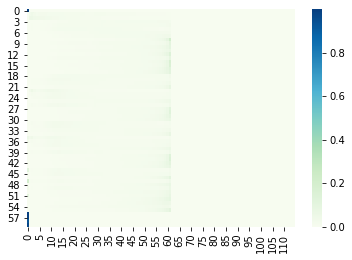

Val Dist: 51.99 Val Loss: 143.39
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 42/600 tf=0.9 af=1


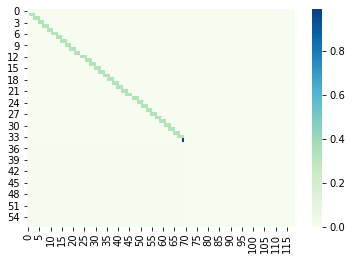

Train Dist: 58.51 Train Loss: 47.18


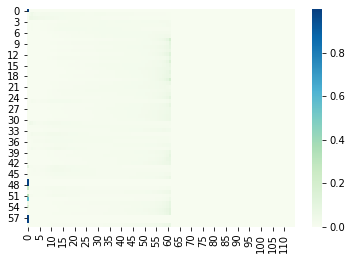

Val Dist: 52.29 Val Loss: 147.52
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 43/600 tf=0.9 af=1


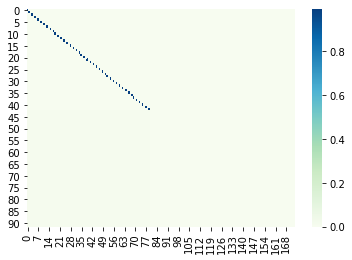

Train Dist: 58.34 Train Loss: 46.48


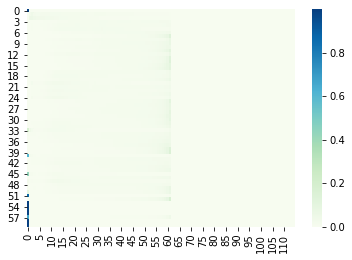

Val Dist: 53.65 Val Loss: 151.57
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 44/600 tf=0.9 af=1


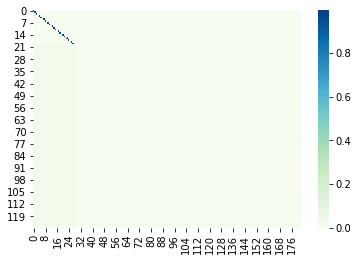

Train Dist: 57.54 Train Loss: 45.69


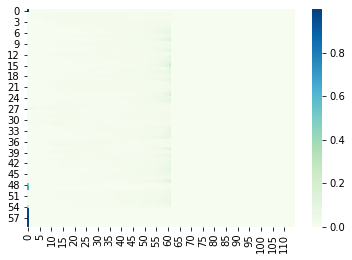

Val Dist: 48.67 Val Loss: 152.48
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 45/600 tf=0.9 af=1


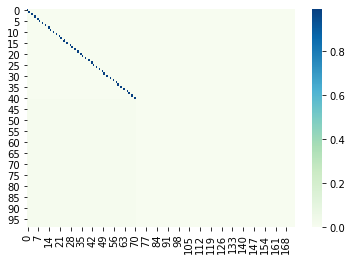

Train Dist: 54.83 Train Loss: 45.12


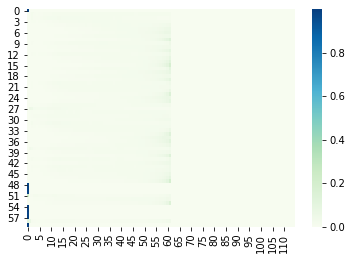

Val Dist: 46.66 Val Loss: 163.27
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 46/600 tf=0.9 af=1


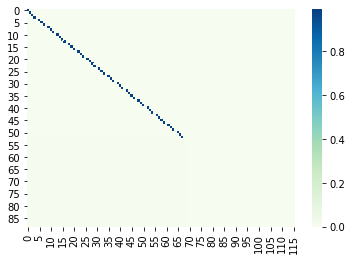

Train Dist: 56.62 Train Loss: 45.27


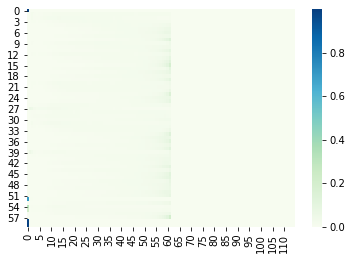

Val Dist: 43.28 Val Loss: 162.77
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 47/600 tf=0.9 af=1


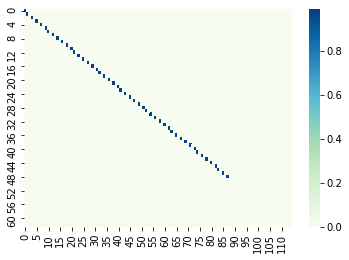

Train Dist: 55.23 Train Loss: 46.03


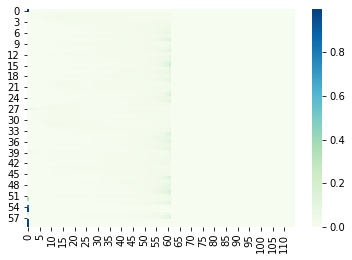

Val Dist: 45.34 Val Loss: 162.95
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 48/600 tf=0.9 af=1


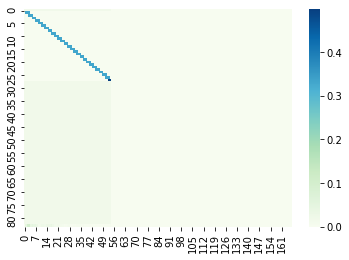

Train Dist: 58.16 Train Loss: 46.13


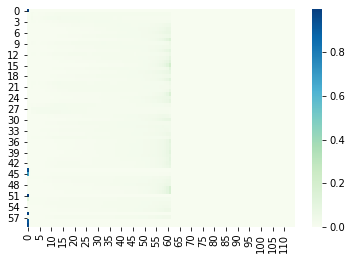

Val Dist: 46.90 Val Loss: 160.55
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 49/600 tf=0.9 af=1


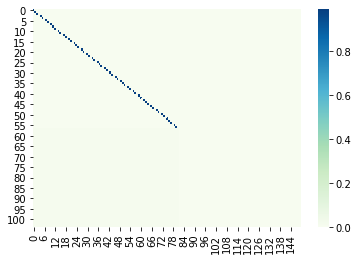

Train Dist: 57.03 Train Loss: 45.35


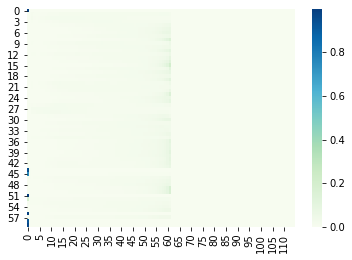

Val Dist: 44.23 Val Loss: 155.83
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 50/600 tf=0.9 af=1


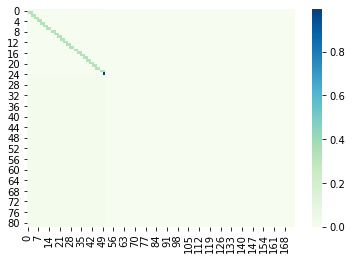

Train Dist: 55.80 Train Loss: 45.69


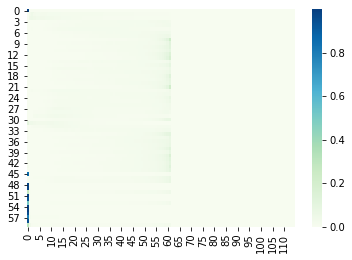

Val Dist: 47.22 Val Loss: 155.60
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 51/600 tf=0.9 af=1


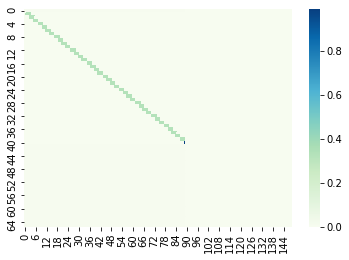

Train Dist: 56.71 Train Loss: 44.51


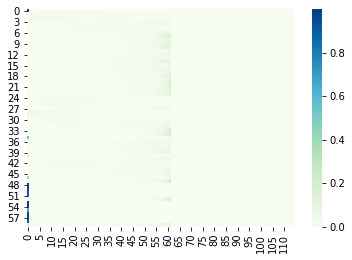

Val Dist: 47.95 Val Loss: 154.13
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 52/600 tf=0.9 af=1


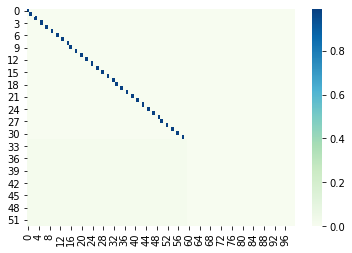

Train Dist: 53.51 Train Loss: 46.09


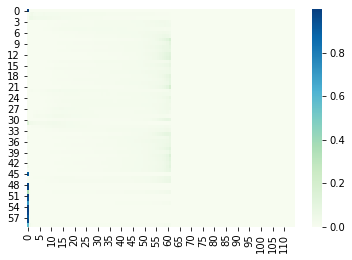

Val Dist: 53.31 Val Loss: 157.81
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 53/600 tf=0.9 af=1


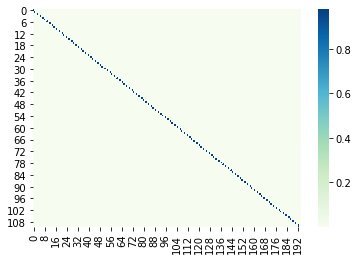

Train Dist: 52.72 Train Loss: 45.07


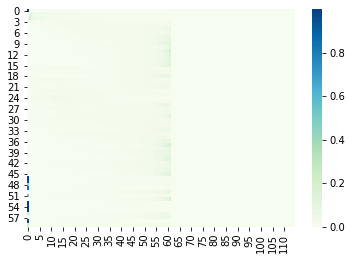

Val Dist: 43.13 Val Loss: 156.46
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 54/600 tf=0.9 af=1


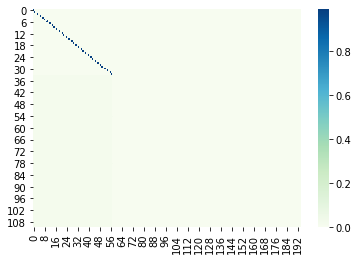

Train Dist: 53.10 Train Loss: 44.31


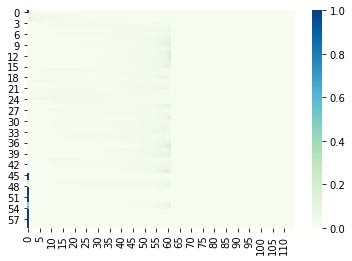

Val Dist: 45.56 Val Loss: 156.37
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 55/600 tf=0.9 af=1


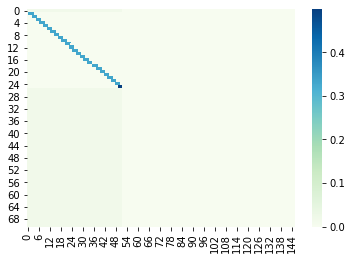

Train Dist: 53.60 Train Loss: 44.12


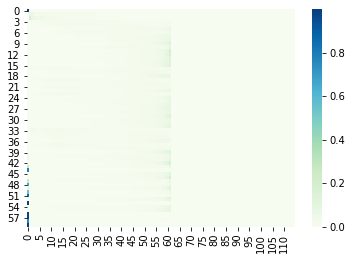

Val Dist: 49.33 Val Loss: 150.70
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 56/600 tf=0.9 af=1


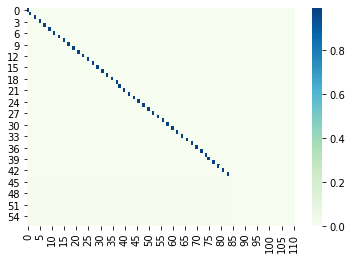

Train Dist: 53.38 Train Loss: 43.58


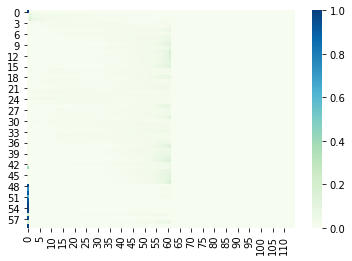

Val Dist: 43.70 Val Loss: 152.60
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 57/600 tf=0.9 af=1


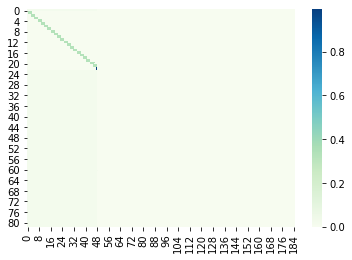

Train Dist: 50.36 Train Loss: 43.80


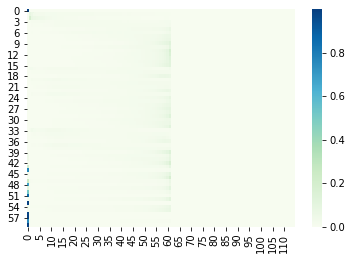

Val Dist: 48.60 Val Loss: 149.50
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 58/600 tf=0.9 af=1


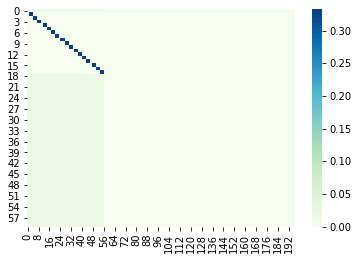

Train Dist: 52.28 Train Loss: 44.10


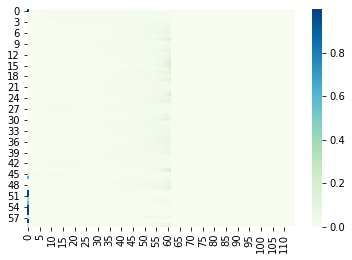

Val Dist: 40.31 Val Loss: 156.35
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 59/600 tf=0.9 af=1


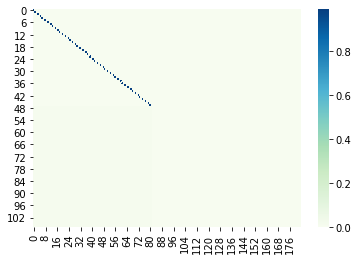

Train Dist: 54.09 Train Loss: 45.01


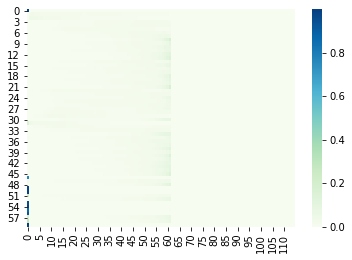

Val Dist: 44.15 Val Loss: 154.49
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 60/600 tf=0.9 af=1


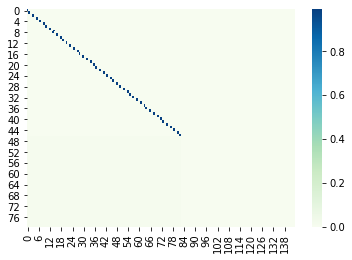

Train Dist: 53.47 Train Loss: 45.47


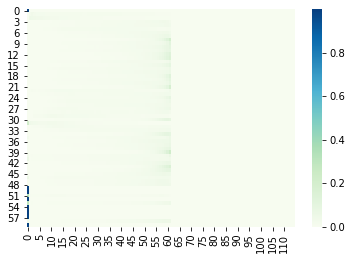

Val Dist: 40.99 Val Loss: 157.55
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 61/600 tf=0.9 af=1


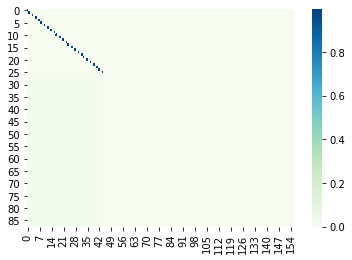

Train Dist: 51.89 Train Loss: 42.72


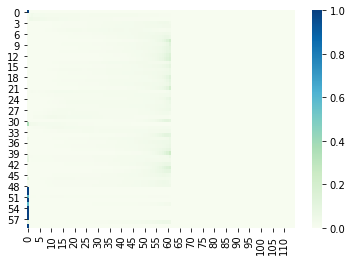

Val Dist: 40.40 Val Loss: 158.93
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 62/600 tf=0.9 af=1


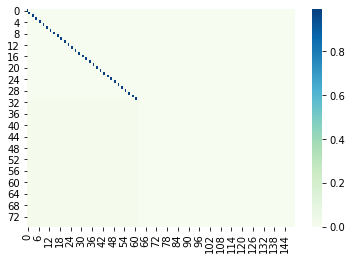

Train Dist: 51.03 Train Loss: 43.91


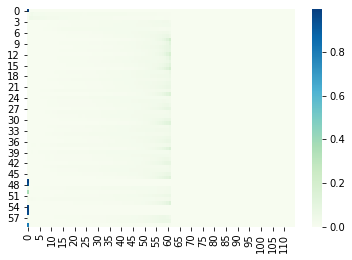

Val Dist: 44.05 Val Loss: 158.84
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 63/600 tf=0.9 af=1


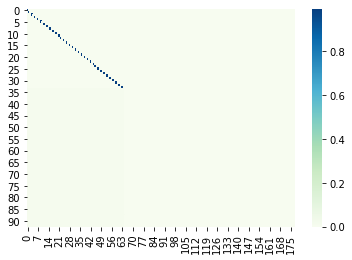

Train Dist: 54.49 Train Loss: 42.47


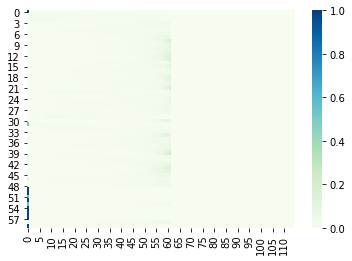

Val Dist: 36.65 Val Loss: 155.49
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 64/600 tf=0.9 af=1


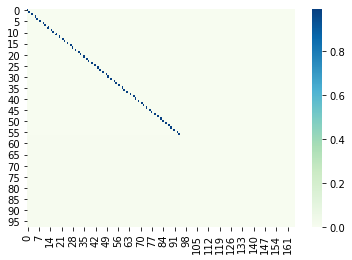

Train Dist: 50.82 Train Loss: 44.48


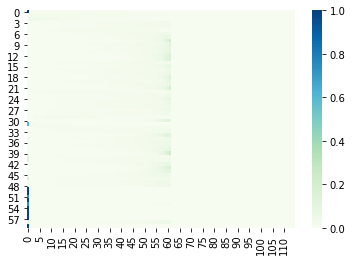

Val Dist: 40.37 Val Loss: 157.39
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 65/600 tf=0.9 af=1


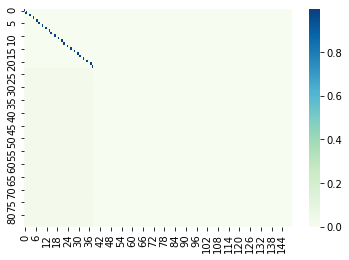

Train Dist: 51.29 Train Loss: 41.41


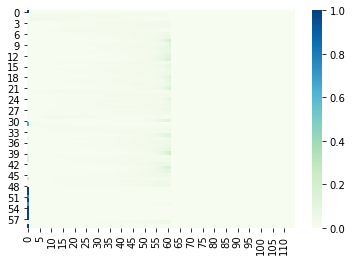

Val Dist: 39.73 Val Loss: 164.11
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 66/600 tf=0.9 af=1


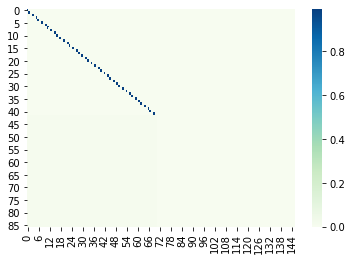

Train Dist: 51.51 Train Loss: 41.60


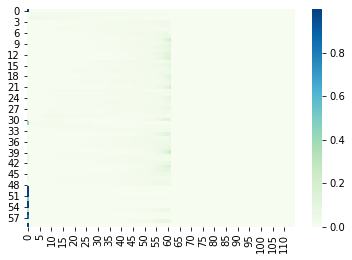

Val Dist: 36.25 Val Loss: 164.35
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 67/600 tf=0.9 af=1


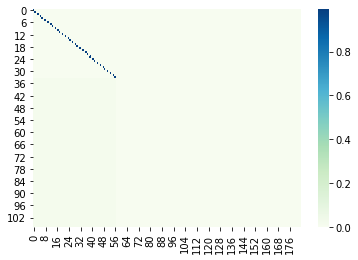

Train Dist: 49.66 Train Loss: 42.35


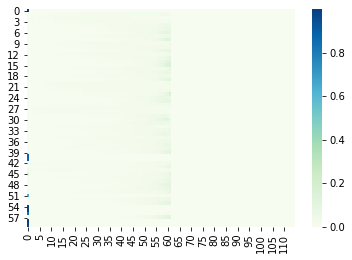

Val Dist: 37.03 Val Loss: 165.16
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 68/600 tf=0.9 af=1


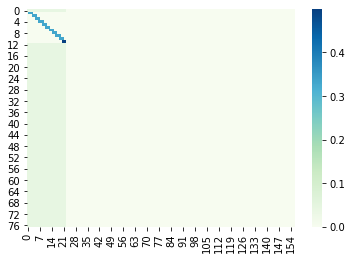

Train Dist: 50.46 Train Loss: 43.90


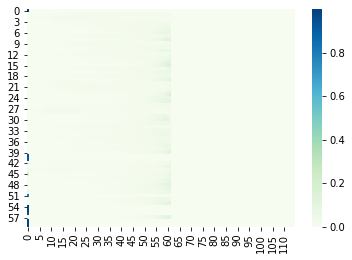

Val Dist: 33.00 Val Loss: 165.64
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 69/600 tf=0.9 af=1


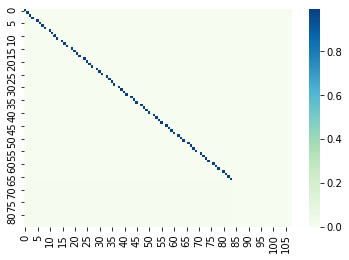

Train Dist: 48.76 Train Loss: 43.22


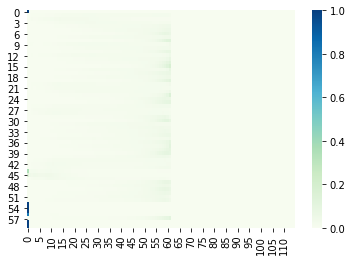

Val Dist: 36.69 Val Loss: 164.48
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 70/600 tf=0.9 af=1


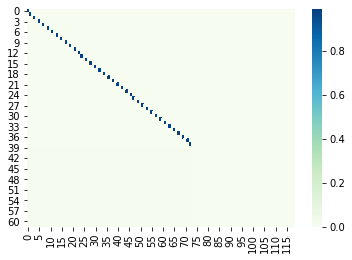

Train Dist: 50.74 Train Loss: 43.30


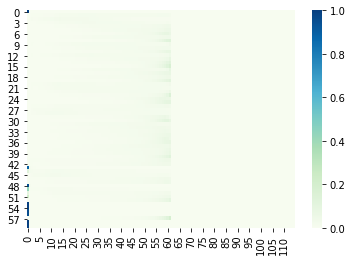

Val Dist: 33.23 Val Loss: 162.21
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 71/600 tf=0.9 af=1


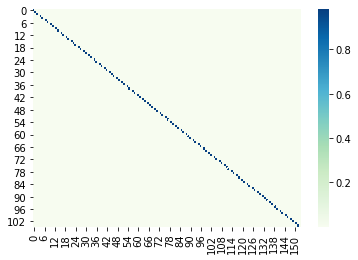

Train Dist: 49.44 Train Loss: 41.08


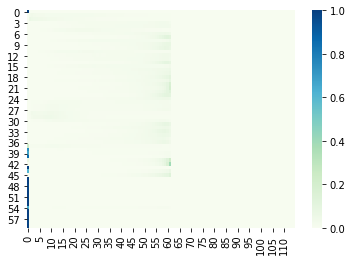

Val Dist: 38.15 Val Loss: 161.37
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 72/600 tf=0.9 af=1


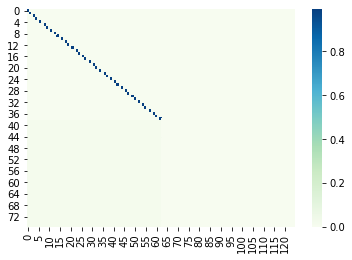

Train Dist: 50.41 Train Loss: 41.72


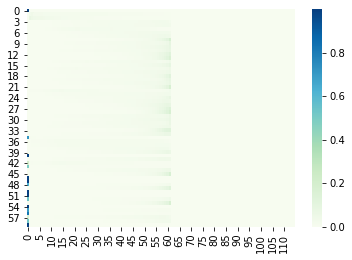

Val Dist: 35.01 Val Loss: 161.67
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 73/600 tf=0.9 af=1


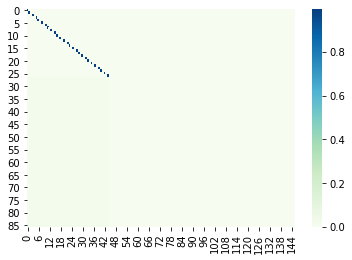

Train Dist: 48.34 Train Loss: 41.18


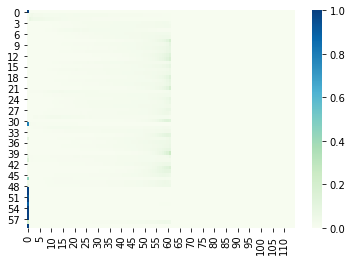

Val Dist: 38.49 Val Loss: 168.84
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 74/600 tf=0.9 af=1


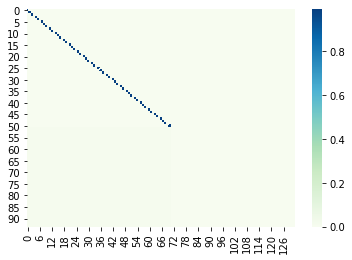

Train Dist: 45.65 Train Loss: 40.76


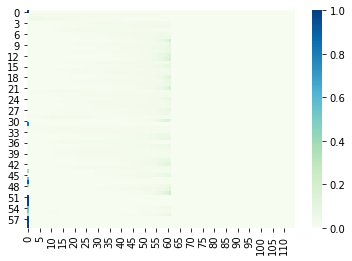

Val Dist: 36.29 Val Loss: 164.85
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 75/600 tf=0.9 af=1


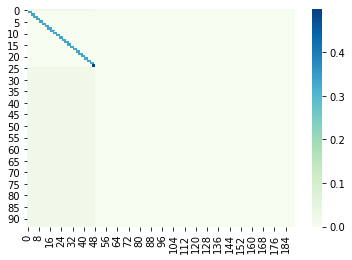

Train Dist: 50.57 Train Loss: 41.73


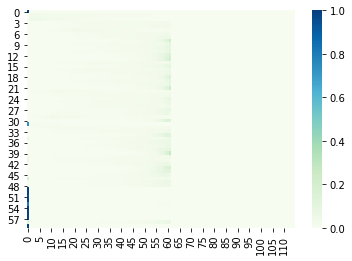

Val Dist: 34.92 Val Loss: 163.18
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 76/600 tf=0.9 af=1


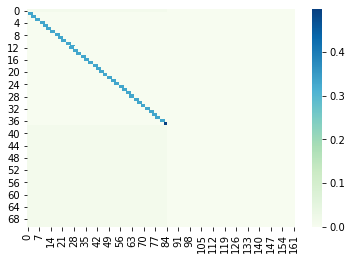

Train Dist: 48.28 Train Loss: 39.63


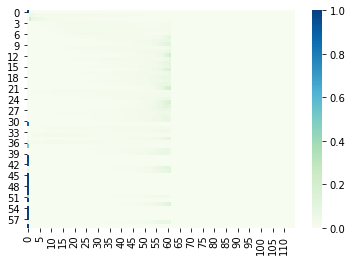

Val Dist: 33.79 Val Loss: 162.81
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 77/600 tf=0.9 af=1


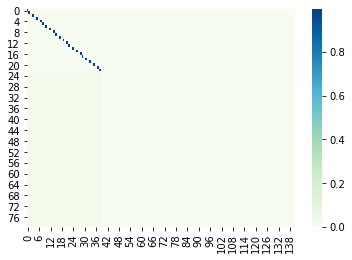

Train Dist: 50.06 Train Loss: 41.58


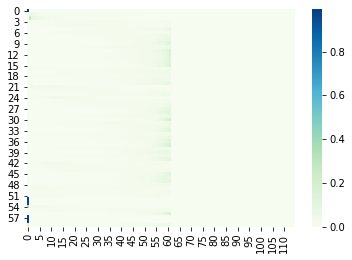

Val Dist: 35.26 Val Loss: 160.74
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 78/600 tf=0.9 af=1


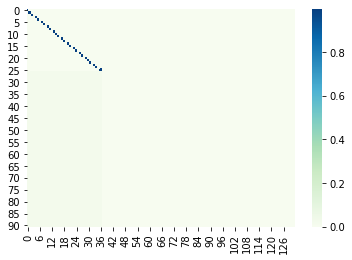

Train Dist: 46.89 Train Loss: 39.49


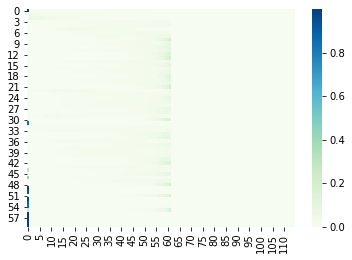

Val Dist: 39.73 Val Loss: 164.49
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 79/600 tf=0.9 af=1


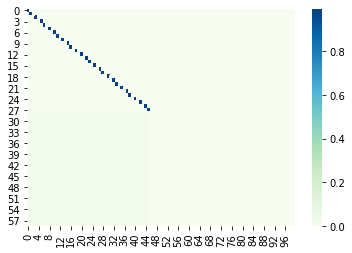

Train Dist: 45.50 Train Loss: 41.00


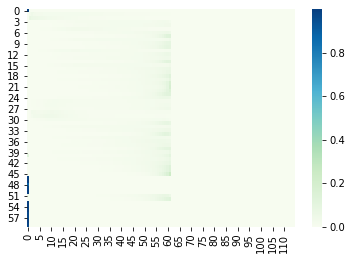

Val Dist: 33.99 Val Loss: 162.98
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 80/600 tf=0.9 af=1


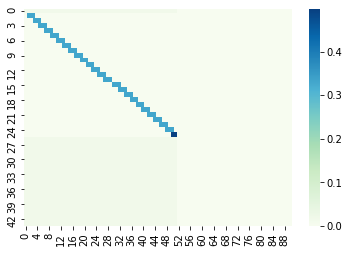

Train Dist: 47.72 Train Loss: 39.13


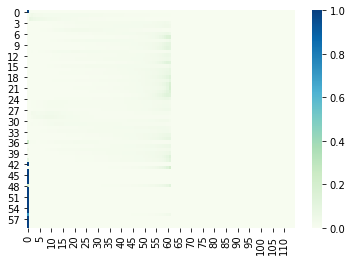

Val Dist: 35.09 Val Loss: 161.65
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 81/600 tf=0.9 af=0.95


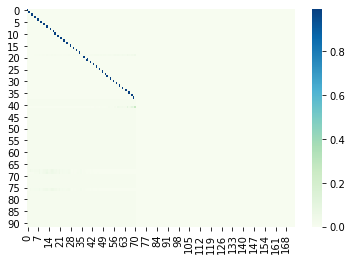

Train Dist: 45.81 Train Loss: 39.77


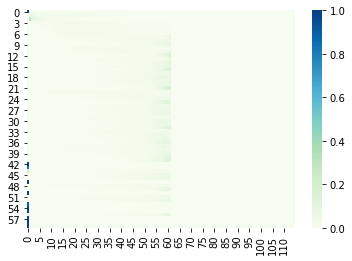

Val Dist: 45.31 Val Loss: 170.30
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 82/600 tf=0.9 af=0.9


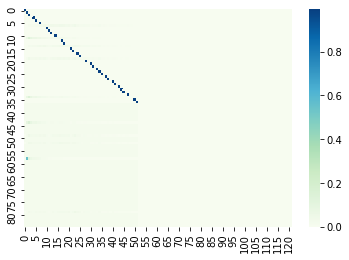

Train Dist: 47.80 Train Loss: 40.55


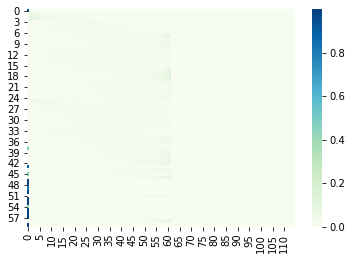

Val Dist: 36.52 Val Loss: 167.70
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 83/600 tf=0.9 af=0.85


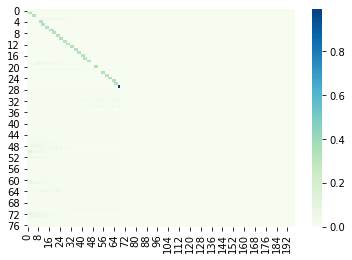

Train Dist: 48.43 Train Loss: 40.57


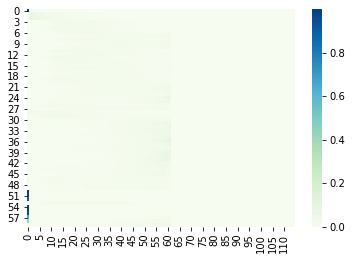

Val Dist: 34.58 Val Loss: 170.16
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 84/600 tf=0.9 af=0.8


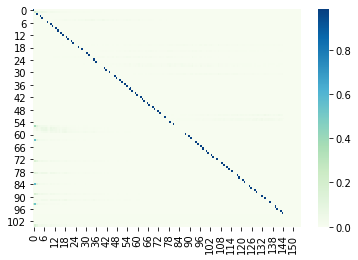

Train Dist: 46.36 Train Loss: 40.30


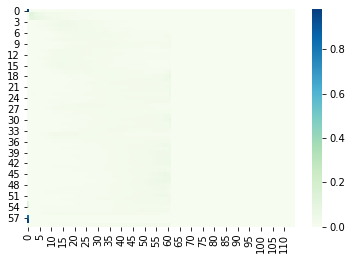

Val Dist: 40.56 Val Loss: 174.54
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 85/600 tf=0.9 af=0.75


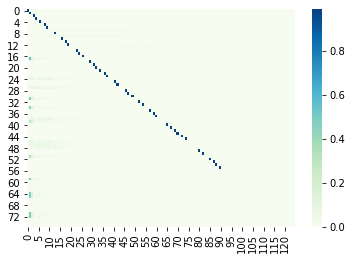

Train Dist: 48.09 Train Loss: 40.67


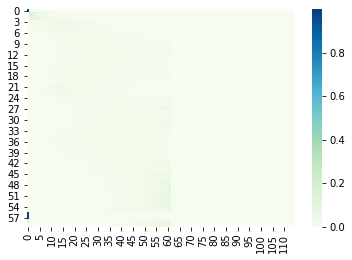

Val Dist: 39.27 Val Loss: 176.73
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 86/600 tf=0.9 af=0.7


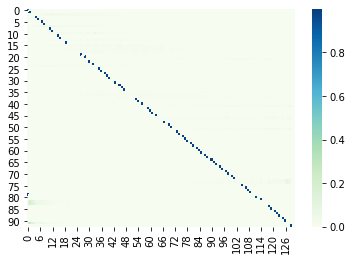

Train Dist: 44.38 Train Loss: 38.93


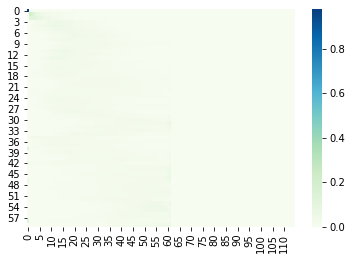

Val Dist: 39.74 Val Loss: 174.15
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 87/600 tf=0.9 af=0.6499999999999999


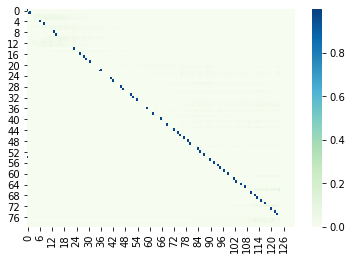

Train Dist: 45.11 Train Loss: 39.27


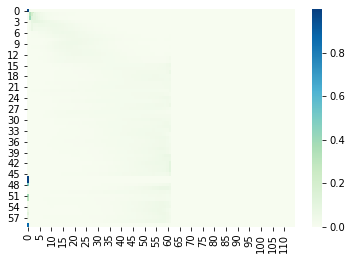

Val Dist: 38.84 Val Loss: 170.28
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 88/600 tf=0.9 af=0.6


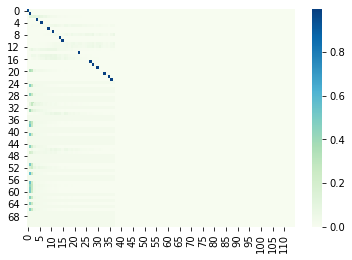

Train Dist: 43.88 Train Loss: 39.24


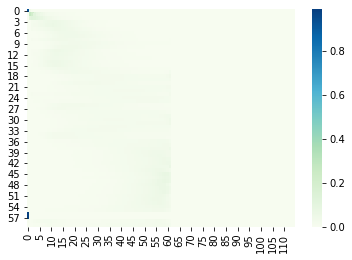

Val Dist: 34.59 Val Loss: 169.80
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 89/600 tf=0.9 af=0.55


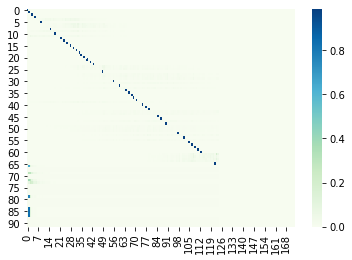

Train Dist: 42.64 Train Loss: 36.74


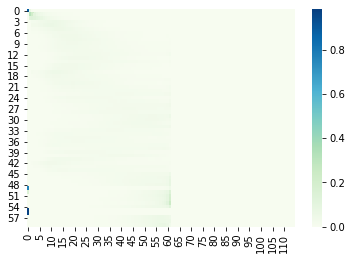

Val Dist: 42.91 Val Loss: 175.03
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 90/600 tf=0.9 af=0.5


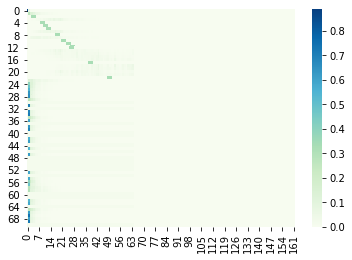

Train Dist: 45.79 Train Loss: 40.16


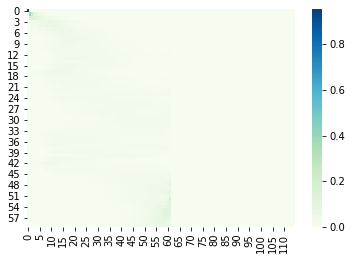

Val Dist: 43.38 Val Loss: 177.43
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 91/600 tf=0.9 af=0.44999999999999996


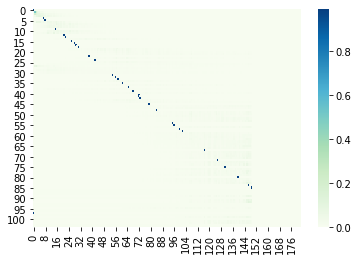

Train Dist: 43.33 Train Loss: 38.56


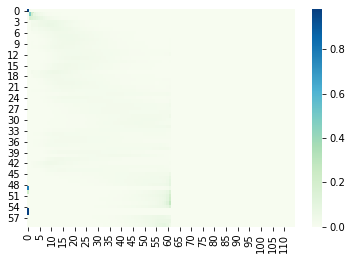

Val Dist: 43.99 Val Loss: 174.30
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 92/600 tf=0.9 af=0.3999999999999999


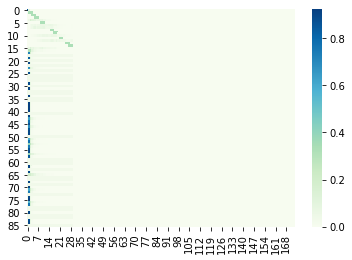

Train Dist: 41.52 Train Loss: 38.01


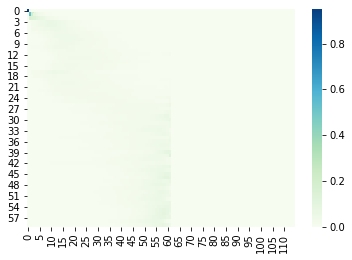

Val Dist: 40.92 Val Loss: 181.20
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 93/600 tf=0.9 af=0.35


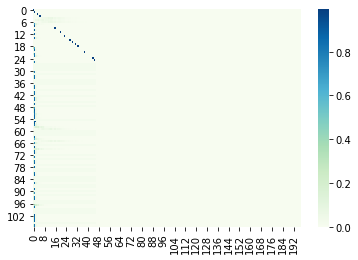

Train Dist: 43.05 Train Loss: 38.26


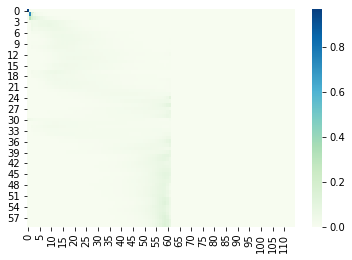

Val Dist: 38.06 Val Loss: 173.52
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 94/600 tf=0.9 af=0.29999999999999993


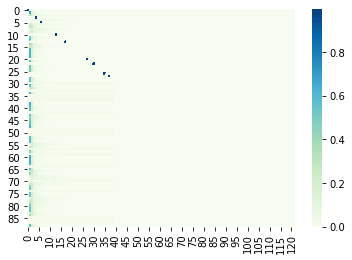

Train Dist: 39.19 Train Loss: 38.81


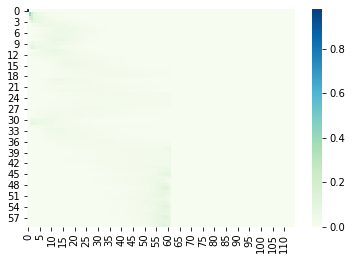

Val Dist: 38.83 Val Loss: 175.09
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 95/600 tf=0.9 af=0.25


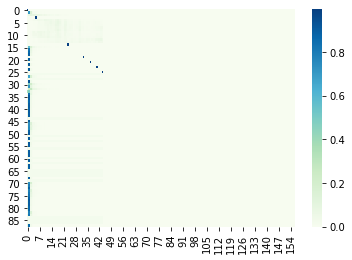

Train Dist: 43.91 Train Loss: 39.39


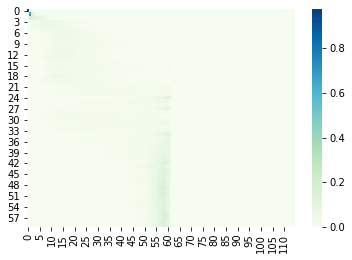

Val Dist: 30.33 Val Loss: 167.05
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 96/600 tf=0.9 af=0.19999999999999996


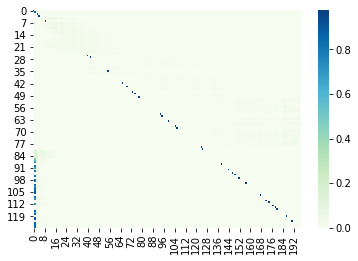

Train Dist: 38.52 Train Loss: 36.79


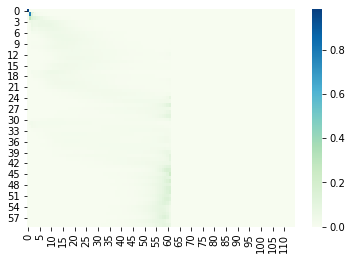

Val Dist: 38.01 Val Loss: 178.21
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 97/600 tf=0.9 af=0.1499999999999999


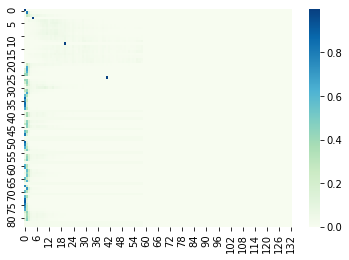

Train Dist: 40.20 Train Loss: 39.40


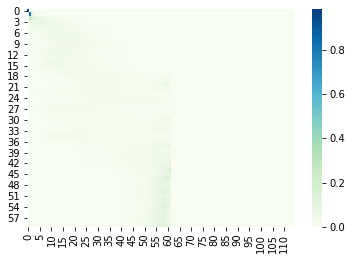

Val Dist: 37.71 Val Loss: 174.02
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 98/600 tf=0.9 af=0.09999999999999998


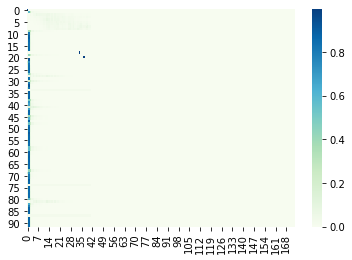

Train Dist: 37.71 Train Loss: 36.99


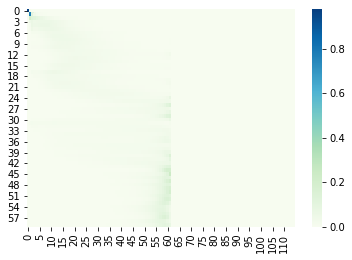

Val Dist: 35.31 Val Loss: 178.93
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 99/600 tf=0.9 af=0.04999999999999993


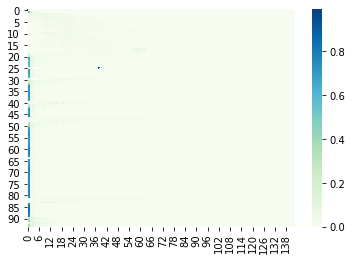

Train Dist: 38.12 Train Loss: 35.97


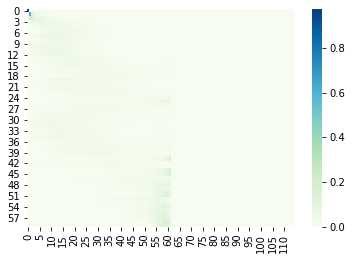

Val Dist: 32.09 Val Loss: 177.11
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 100/600 tf=0.9 af=0.0


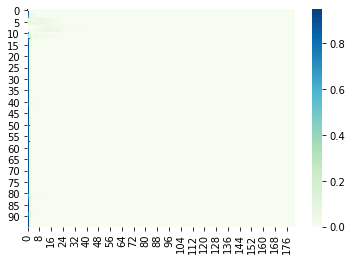

Train Dist: 36.04 Train Loss: 35.44


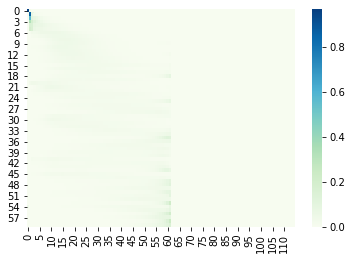

Val Dist: 33.12 Val Loss: 178.98
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 101/600 tf=0.9 af=0


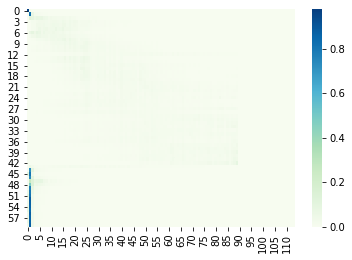

Train Dist: 37.14 Train Loss: 38.82


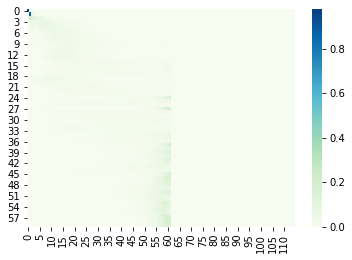

Val Dist: 29.94 Val Loss: 171.83
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 102/600 tf=0.9 af=0


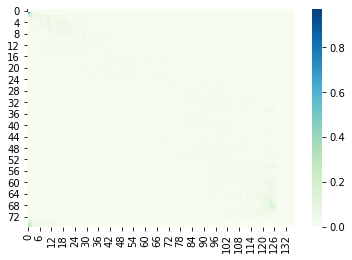

Train Dist: 36.69 Train Loss: 36.23


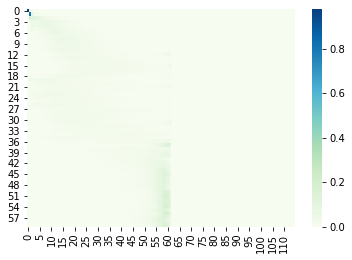

Val Dist: 31.66 Val Loss: 175.88
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 103/600 tf=0.9 af=0


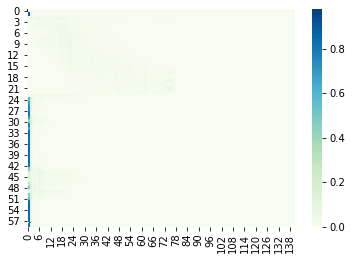

Train Dist: 35.86 Train Loss: 37.10


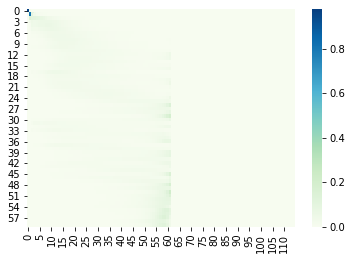

Val Dist: 32.37 Val Loss: 179.42
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 104/600 tf=0.9 af=0


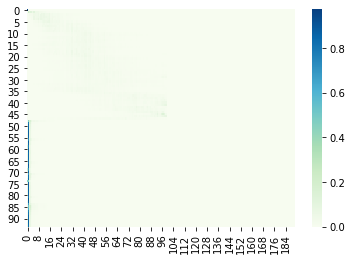

Train Dist: 36.59 Train Loss: 37.14


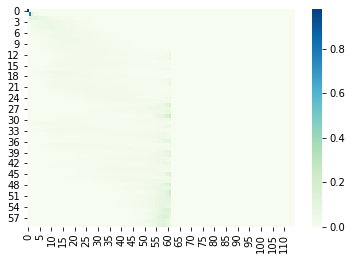

Val Dist: 30.28 Val Loss: 178.56
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 105/600 tf=0.9 af=0


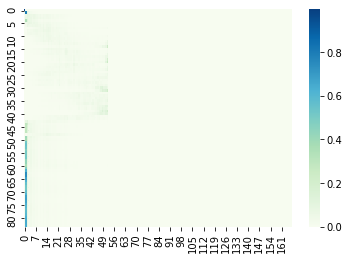

Train Dist: 36.13 Train Loss: 36.62


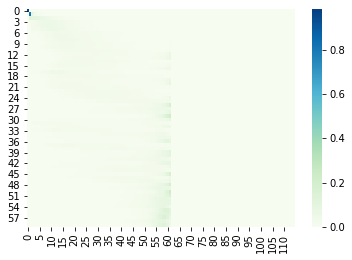

Val Dist: 32.55 Val Loss: 184.58
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 106/600 tf=0.9 af=0


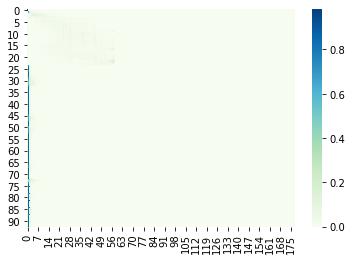

Train Dist: 36.38 Train Loss: 35.57


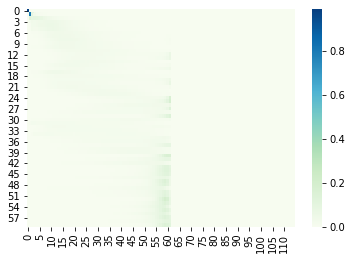

Val Dist: 30.17 Val Loss: 181.11
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 107/600 tf=0.9 af=0


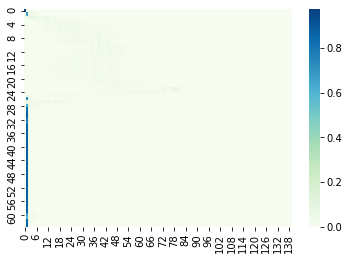

Train Dist: 35.39 Train Loss: 37.55


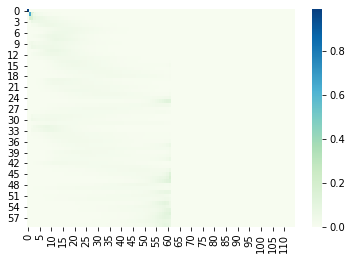

Val Dist: 29.70 Val Loss: 176.61
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 108/600 tf=0.9 af=0


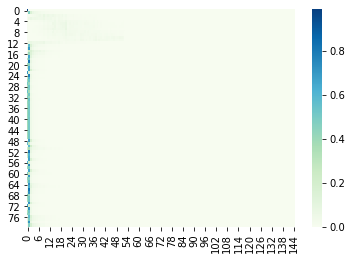

Train Dist: 36.24 Train Loss: 36.43


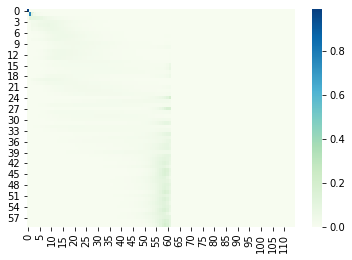

Val Dist: 28.68 Val Loss: 179.14
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 109/600 tf=0.9 af=0


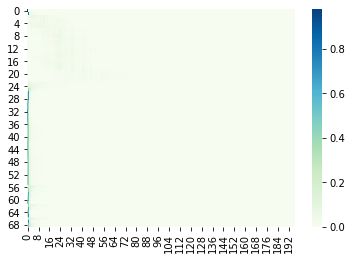

Train Dist: 34.04 Train Loss: 35.91


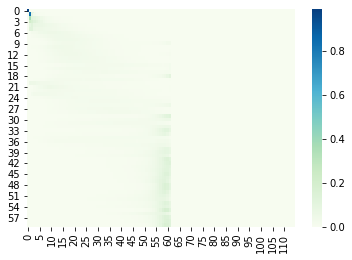

Val Dist: 30.29 Val Loss: 179.12
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 110/600 tf=0.9 af=0


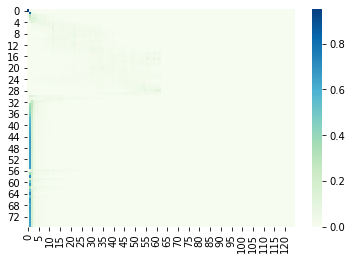

Train Dist: 35.78 Train Loss: 36.76


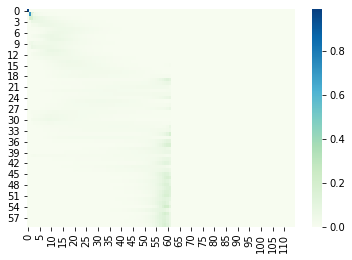

Val Dist: 29.65 Val Loss: 183.43
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 111/600 tf=0.9 af=0


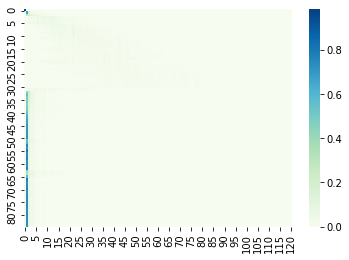

Train Dist: 33.31 Train Loss: 34.49


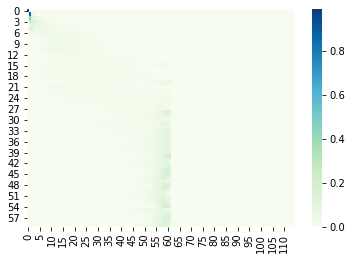

Val Dist: 30.47 Val Loss: 189.53
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 112/600 tf=0.9 af=0


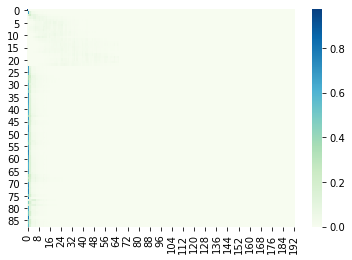

Train Dist: 34.80 Train Loss: 36.29


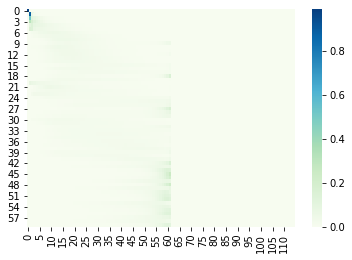

Val Dist: 28.70 Val Loss: 186.86
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 113/600 tf=0.9 af=0


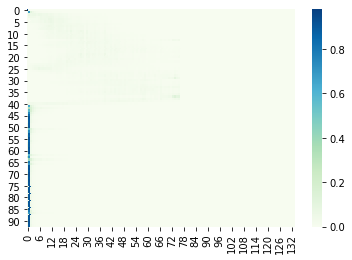

Train Dist: 33.35 Train Loss: 34.82


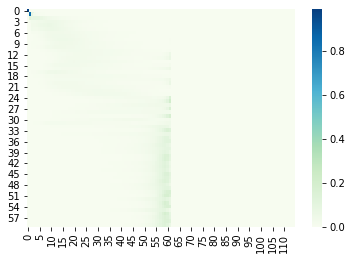

Val Dist: 28.83 Val Loss: 187.48
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 114/600 tf=0.9 af=0


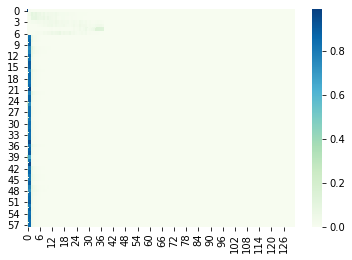

Train Dist: 34.19 Train Loss: 35.15


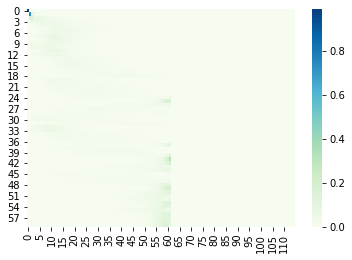

Val Dist: 29.40 Val Loss: 186.77
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 115/600 tf=0.9 af=0


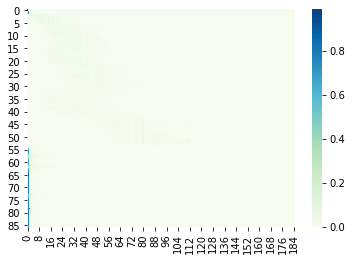

Train Dist: 33.07 Train Loss: 35.63


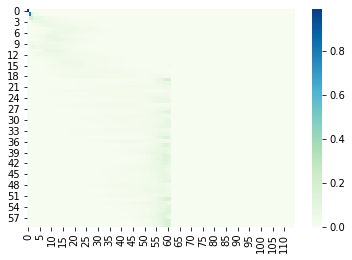

Val Dist: 26.65 Val Loss: 175.36
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 116/600 tf=0.9 af=0


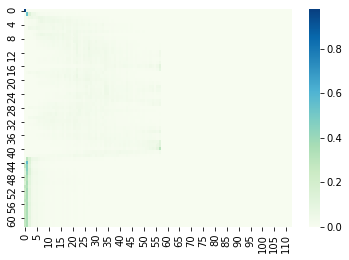

Train Dist: 33.02 Train Loss: 33.57


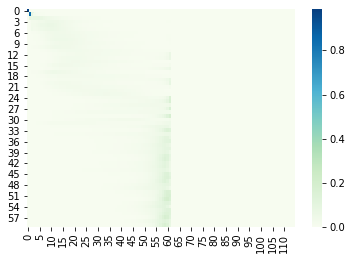

Val Dist: 27.61 Val Loss: 181.72
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 117/600 tf=0.9 af=0


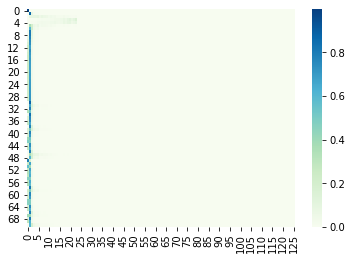

Train Dist: 32.19 Train Loss: 34.74


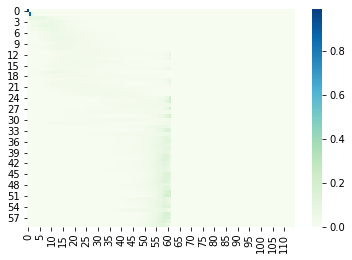

Val Dist: 29.15 Val Loss: 190.13
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 118/600 tf=0.9 af=0


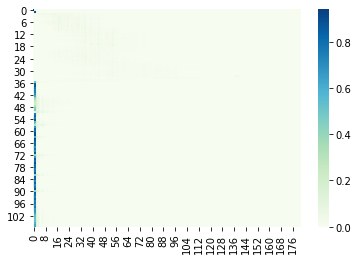

Train Dist: 32.51 Train Loss: 33.23


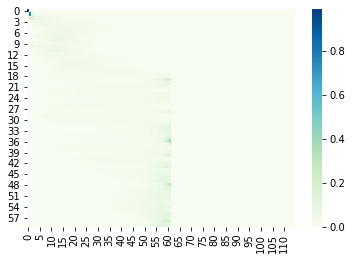

Val Dist: 27.71 Val Loss: 191.74
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 119/600 tf=0.9 af=0


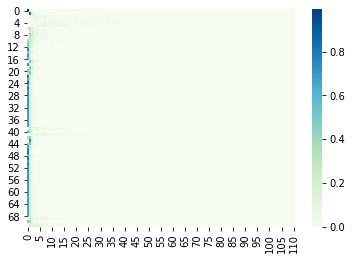

Train Dist: 30.72 Train Loss: 33.74


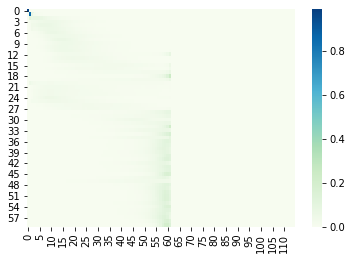

Val Dist: 28.01 Val Loss: 188.63
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 120/600 tf=0.9 af=0


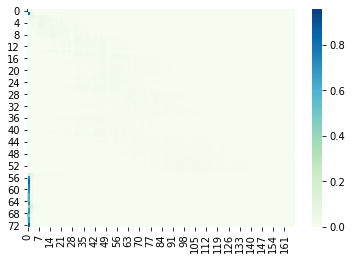

Train Dist: 31.58 Train Loss: 33.05


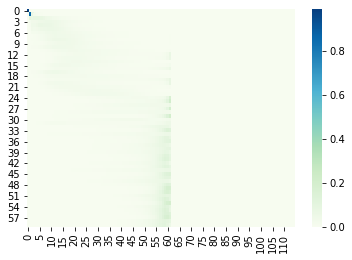

Val Dist: 29.02 Val Loss: 182.99
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 121/600 tf=0.9 af=0


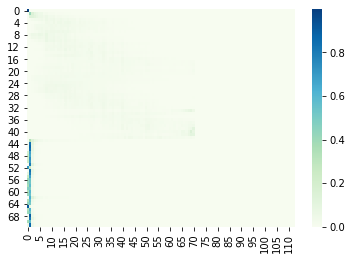

Train Dist: 30.52 Train Loss: 35.49


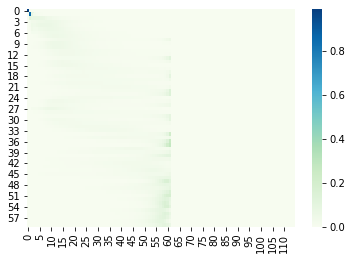

Val Dist: 28.98 Val Loss: 181.09
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 122/600 tf=0.9 af=0


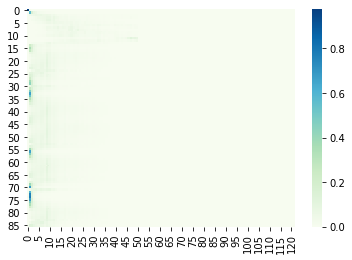

Train Dist: 33.56 Train Loss: 35.04


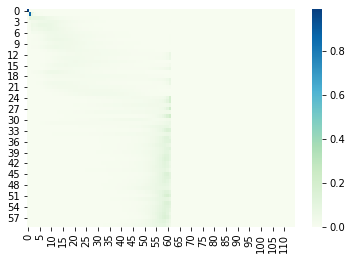

Val Dist: 30.06 Val Loss: 194.22
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 123/600 tf=0.9 af=0


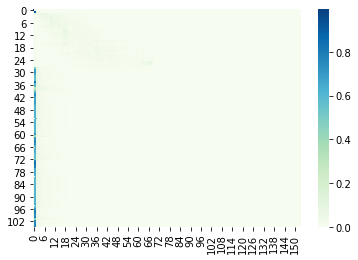

Train Dist: 31.40 Train Loss: 33.77


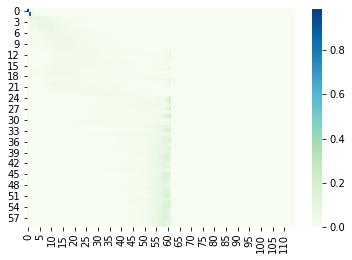

Val Dist: 29.52 Val Loss: 180.59
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 124/600 tf=0.9 af=0


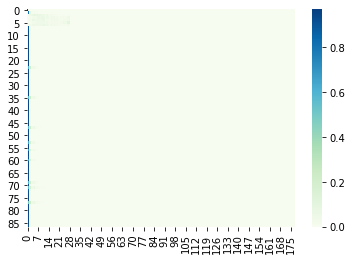

Train Dist: 32.70 Train Loss: 33.31


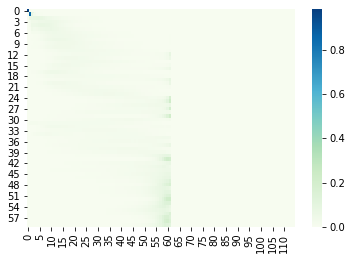

Val Dist: 29.12 Val Loss: 196.86
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 125/600 tf=0.9 af=0


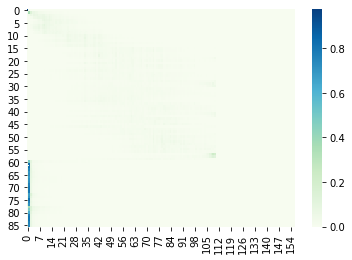

Train Dist: 29.35 Train Loss: 32.49


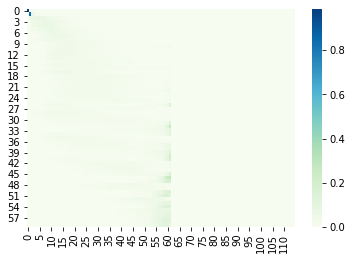

Val Dist: 30.53 Val Loss: 195.95
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 126/600 tf=0.9 af=0


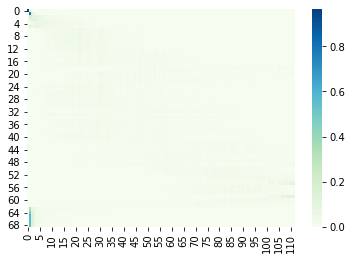

Train Dist: 30.80 Train Loss: 32.39


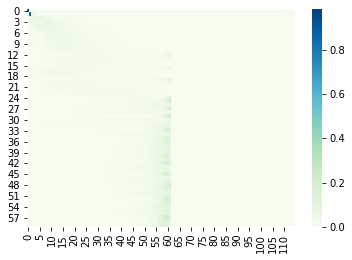

Val Dist: 30.50 Val Loss: 200.96
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 127/600 tf=0.9 af=0


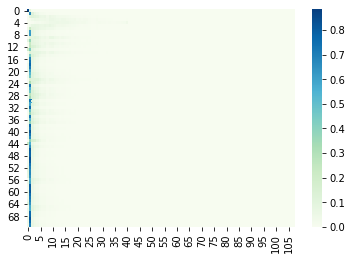

Train Dist: 30.99 Train Loss: 32.84


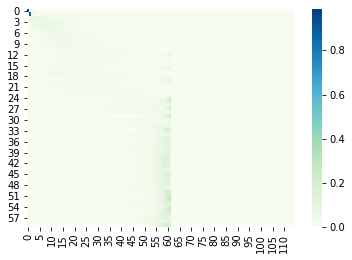

Val Dist: 29.25 Val Loss: 198.51
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 128/600 tf=0.9 af=0


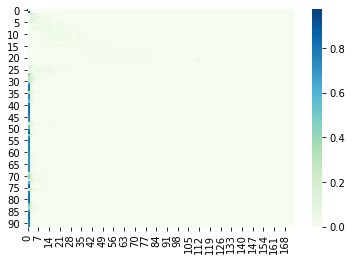

Train Dist: 29.41 Train Loss: 32.87


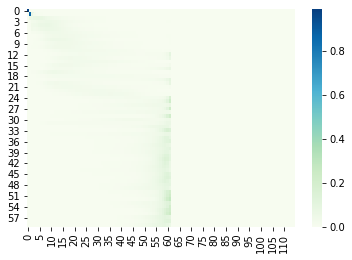

Val Dist: 28.61 Val Loss: 186.89
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 129/600 tf=0.9 af=0


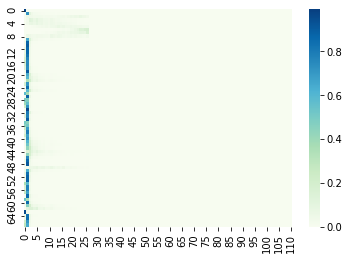

Train Dist: 31.02 Train Loss: 33.28


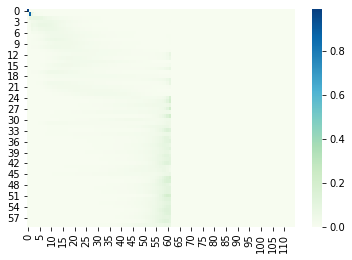

Val Dist: 31.98 Val Loss: 197.46
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 130/600 tf=0.9 af=0


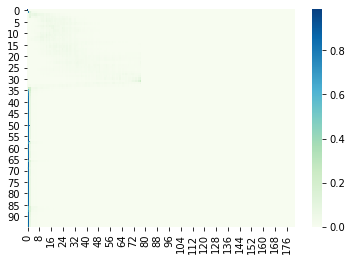

Train Dist: 30.97 Train Loss: 31.53


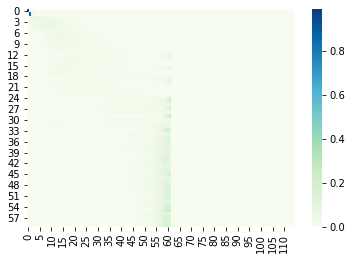

Val Dist: 29.57 Val Loss: 199.16
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 131/600 tf=0.9 af=0


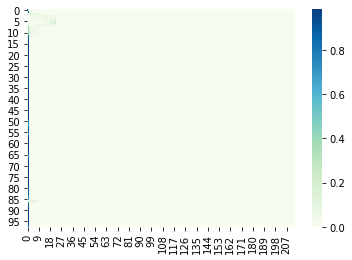

Train Dist: 30.46 Train Loss: 32.73


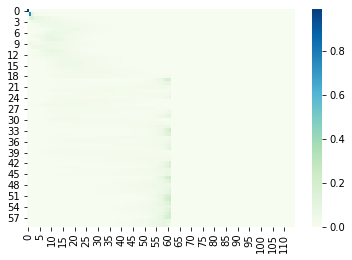

Val Dist: 28.15 Val Loss: 193.58
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 132/600 tf=0.9 af=0


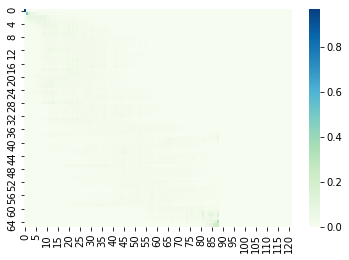

Train Dist: 29.50 Train Loss: 31.65


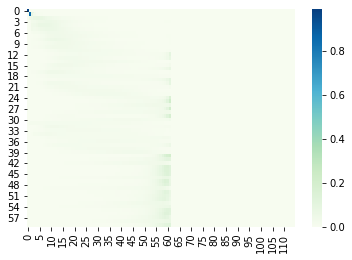

Val Dist: 26.92 Val Loss: 197.18
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 133/600 tf=0.9 af=0


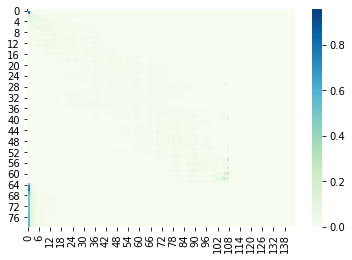

Train Dist: 30.51 Train Loss: 32.92


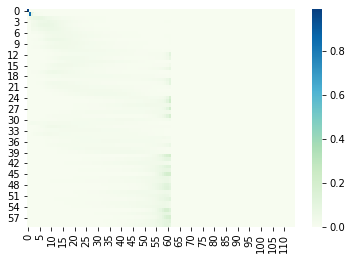

Val Dist: 30.29 Val Loss: 196.48
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 134/600 tf=0.9 af=0


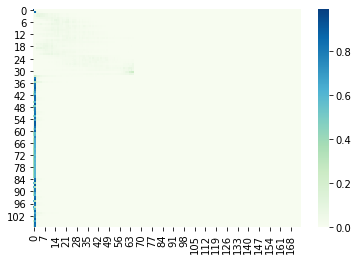

Train Dist: 29.36 Train Loss: 31.94


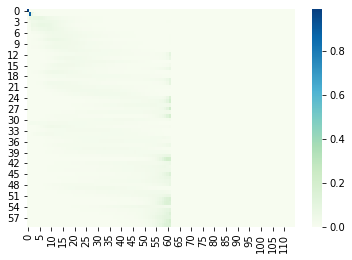

Val Dist: 28.84 Val Loss: 187.08
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 135/600 tf=0.9 af=0


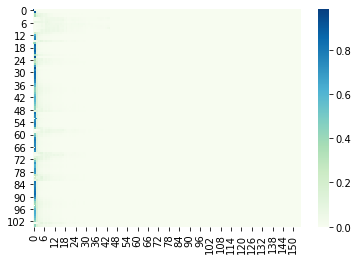

Train Dist: 28.16 Train Loss: 32.30


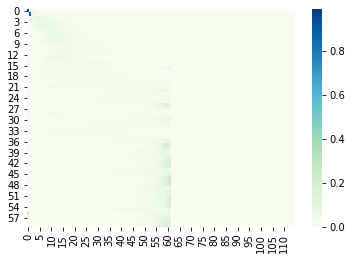

Val Dist: 28.33 Val Loss: 188.11
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 136/600 tf=0.9 af=0


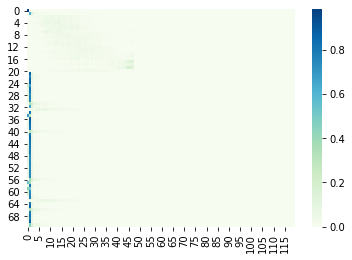

Train Dist: 28.81 Train Loss: 32.88


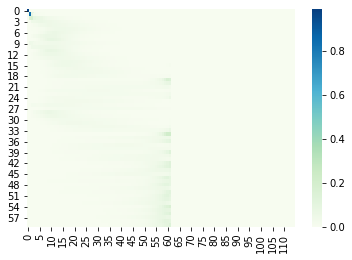

Val Dist: 28.42 Val Loss: 186.73
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 137/600 tf=0.9 af=0


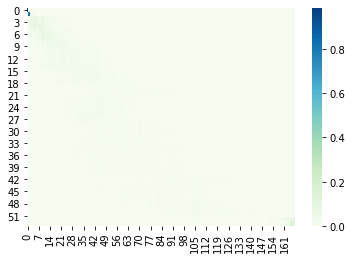

Train Dist: 27.97 Train Loss: 30.51


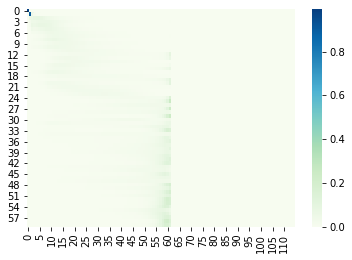

Val Dist: 30.51 Val Loss: 207.39
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 138/600 tf=0.9 af=0


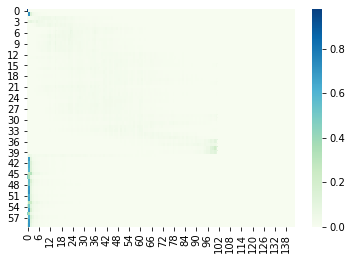

Train Dist: 28.55 Train Loss: 33.29


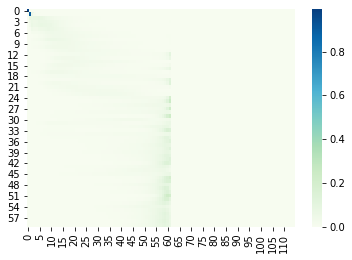

Val Dist: 27.49 Val Loss: 203.18
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 139/600 tf=0.9 af=0


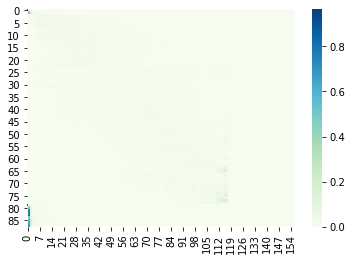

Train Dist: 26.75 Train Loss: 30.48


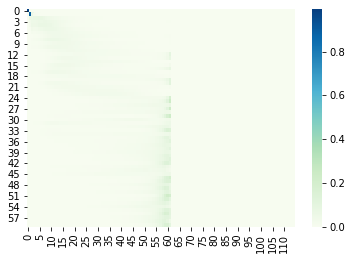

Val Dist: 28.28 Val Loss: 199.99
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 140/600 tf=0.9 af=0


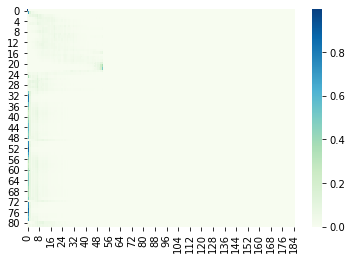

Train Dist: 26.92 Train Loss: 31.79


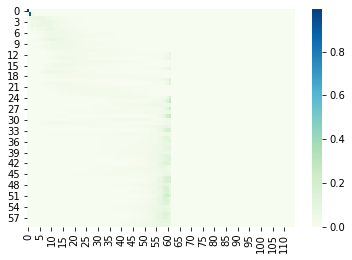

Val Dist: 29.28 Val Loss: 199.12
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 141/600 tf=0.9 af=0


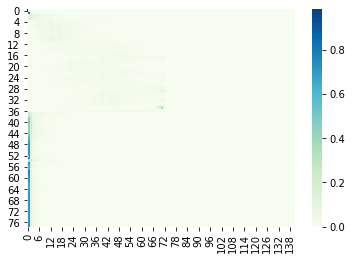

Train Dist: 27.36 Train Loss: 30.31


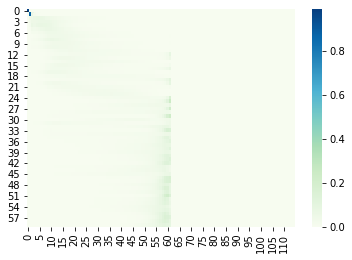

Val Dist: 28.90 Val Loss: 201.89
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 142/600 tf=0.9 af=0


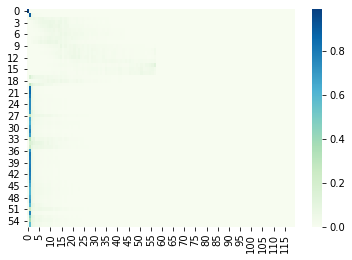

Train Dist: 29.27 Train Loss: 31.98


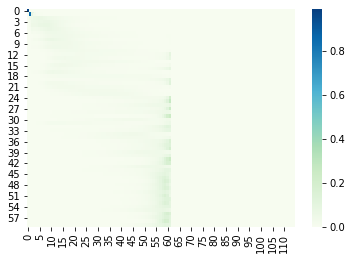

Val Dist: 30.41 Val Loss: 201.50
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 143/600 tf=0.9 af=0


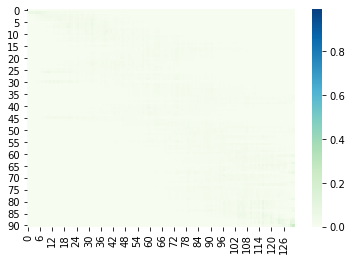

Train Dist: 29.15 Train Loss: 33.26


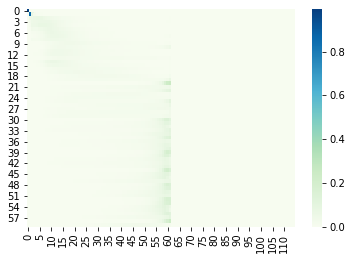

Val Dist: 26.76 Val Loss: 193.61
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 144/600 tf=0.9 af=0


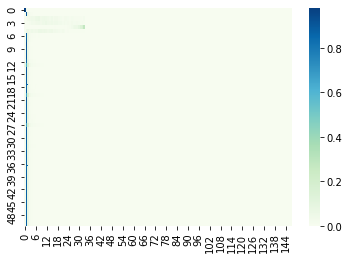

Train Dist: 28.45 Train Loss: 32.60


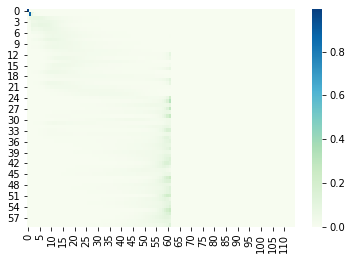

Val Dist: 28.33 Val Loss: 200.02
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 145/600 tf=0.9 af=0


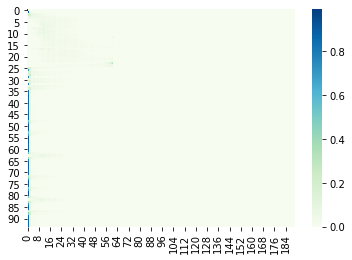

Train Dist: 27.95 Train Loss: 31.61


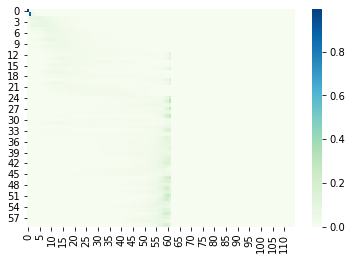

Val Dist: 29.87 Val Loss: 202.27
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 146/600 tf=0.9 af=0


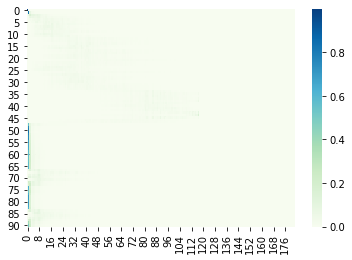

Train Dist: 26.80 Train Loss: 29.79


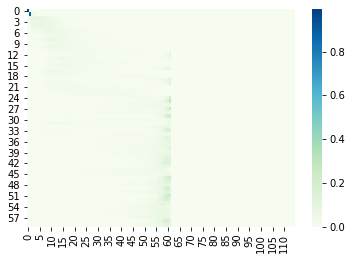

Val Dist: 26.87 Val Loss: 199.28
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 147/600 tf=0.9 af=0


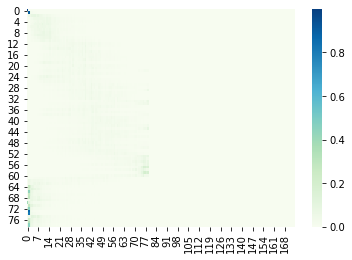

Train Dist: 26.01 Train Loss: 30.18


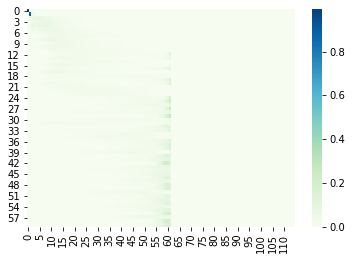

Val Dist: 28.62 Val Loss: 201.18
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 148/600 tf=0.9 af=0


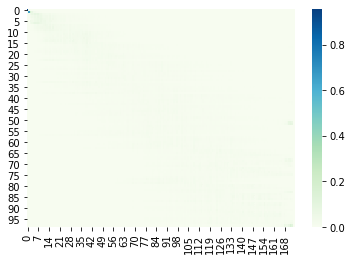

Train Dist: 28.35 Train Loss: 31.65


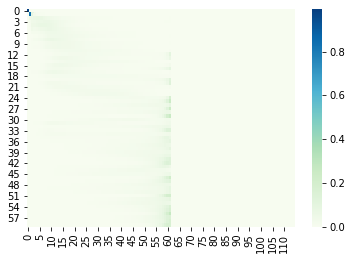

Val Dist: 27.27 Val Loss: 195.67
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 149/600 tf=0.9 af=0


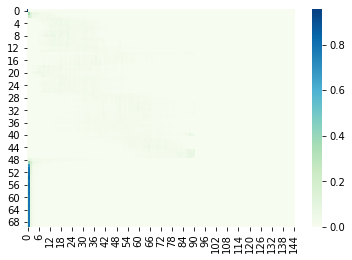

Train Dist: 26.95 Train Loss: 30.16


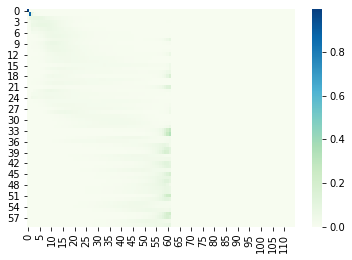

Val Dist: 28.91 Val Loss: 195.48
Adjusting learning rate of group 0 to 1.0000e-04.

Epoch 150/600 tf=0.9 af=0


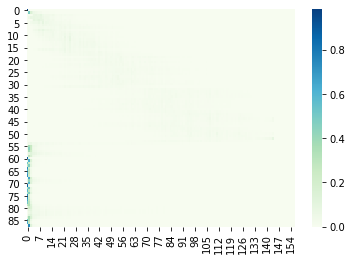

Train Dist: 24.37 Train Loss: 30.43


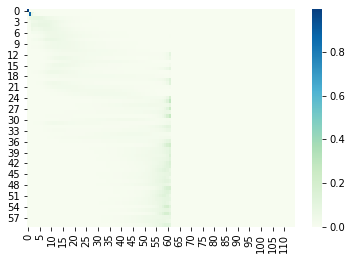

Val Dist: 32.98 Val Loss: 207.39
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 151/600 tf=0.9 af=0


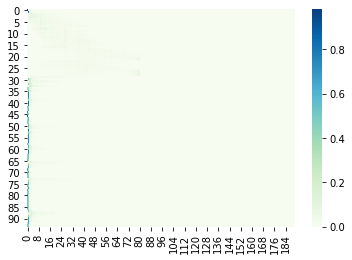

Train Dist: 27.87 Train Loss: 32.34


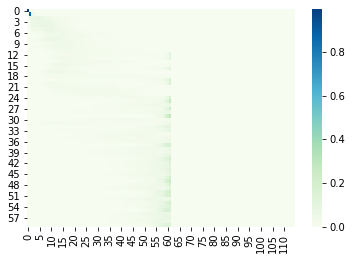

Val Dist: 28.59 Val Loss: 203.31
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 152/600 tf=0.9 af=0


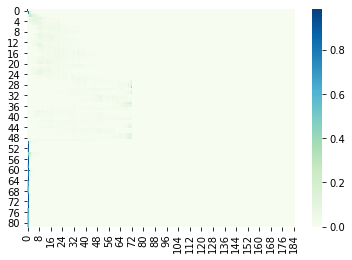

Train Dist: 23.99 Train Loss: 29.88


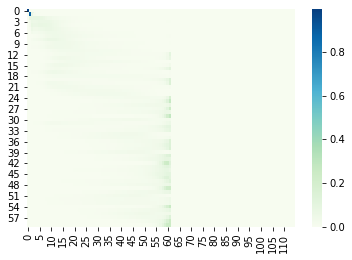

Val Dist: 27.55 Val Loss: 205.93
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 153/600 tf=0.9 af=0


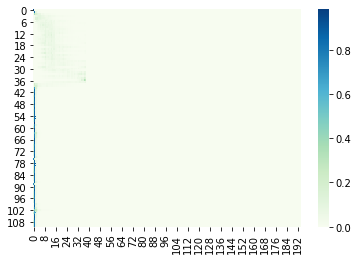

Train Dist: 26.04 Train Loss: 30.09


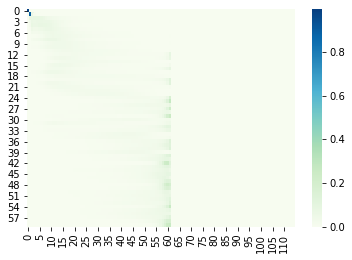

Val Dist: 27.55 Val Loss: 203.21
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 154/600 tf=0.9 af=0


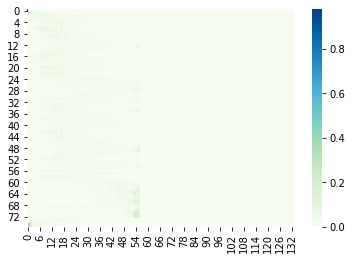

Train Dist: 22.54 Train Loss: 27.69


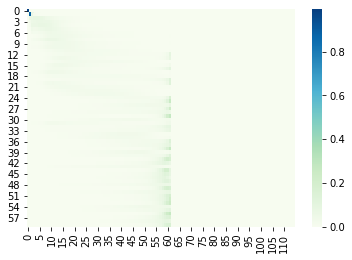

Val Dist: 29.01 Val Loss: 206.85
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 155/600 tf=0.9 af=0


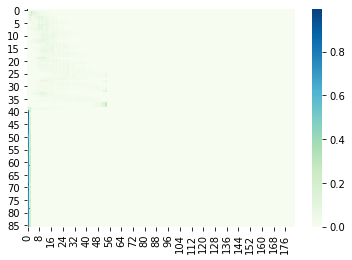

Train Dist: 25.33 Train Loss: 30.91


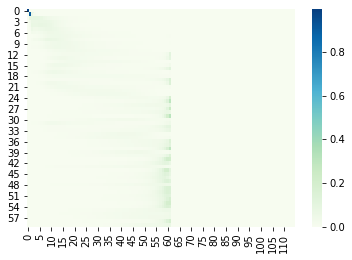

Val Dist: 29.52 Val Loss: 201.53
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 156/600 tf=0.9 af=0


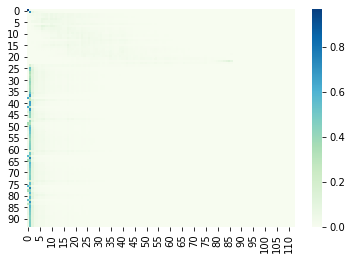

Train Dist: 25.73 Train Loss: 30.14


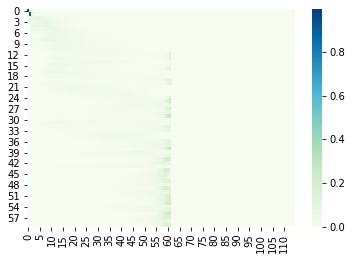

Val Dist: 28.78 Val Loss: 198.87
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 157/600 tf=0.9 af=0


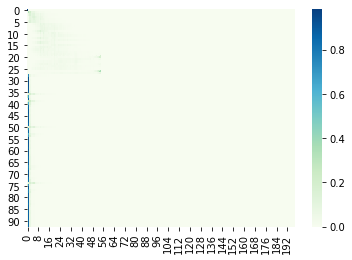

Train Dist: 24.62 Train Loss: 29.42


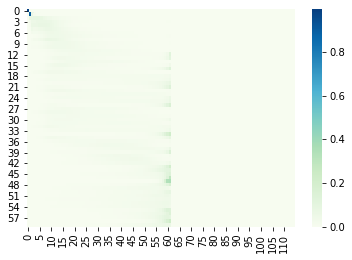

Val Dist: 28.61 Val Loss: 200.67
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 158/600 tf=0.9 af=0


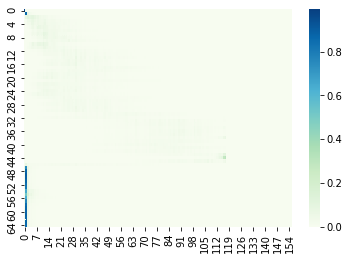

Train Dist: 28.13 Train Loss: 30.61


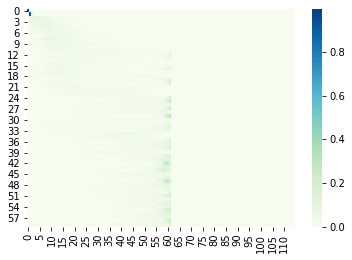

Val Dist: 28.42 Val Loss: 198.71
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 159/600 tf=0.9 af=0


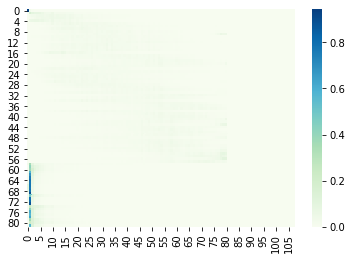

Train Dist: 25.43 Train Loss: 29.92


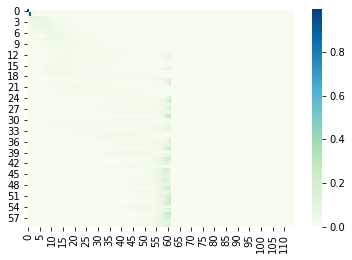

Val Dist: 28.35 Val Loss: 200.17
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 160/600 tf=0.9 af=0


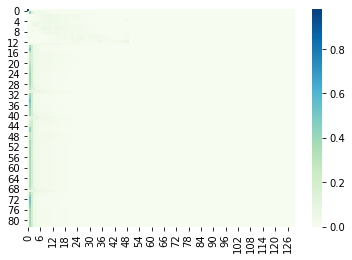

Train Dist: 23.00 Train Loss: 27.35


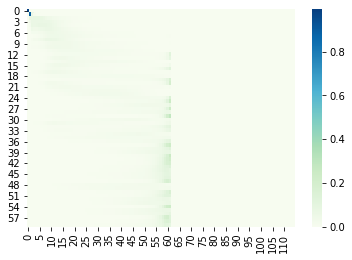

Val Dist: 26.19 Val Loss: 200.70
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 161/600 tf=0.9 af=0


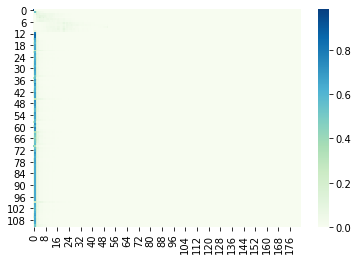

Train Dist: 25.61 Train Loss: 29.07


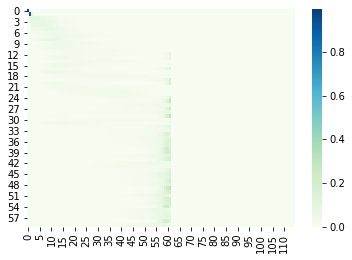

Val Dist: 28.09 Val Loss: 203.75
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 162/600 tf=0.9 af=0


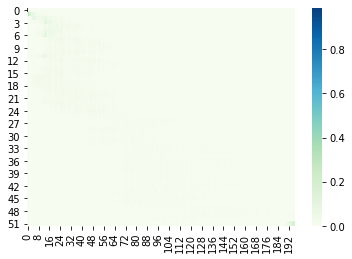

Train Dist: 23.25 Train Loss: 29.55


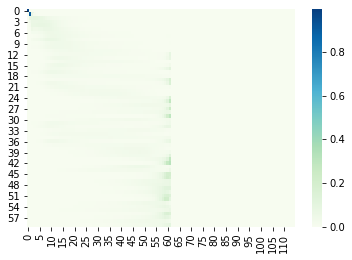

Val Dist: 28.81 Val Loss: 203.00
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 163/600 tf=0.9 af=0


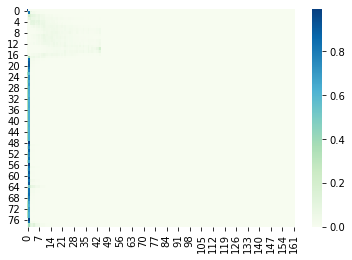

Train Dist: 23.52 Train Loss: 28.93


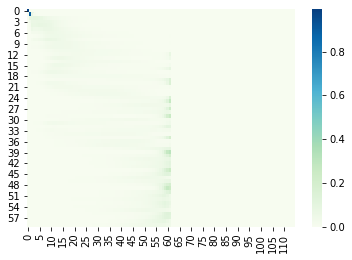

Val Dist: 27.22 Val Loss: 203.06
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 164/600 tf=0.9 af=0


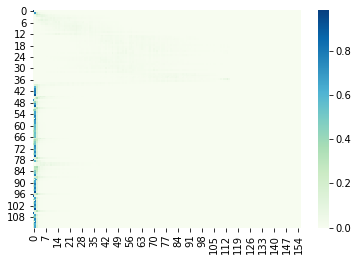

Train Dist: 23.54 Train Loss: 27.42


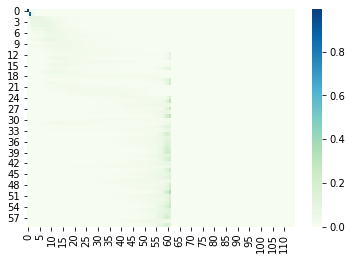

Val Dist: 28.54 Val Loss: 206.74
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 165/600 tf=0.9 af=0


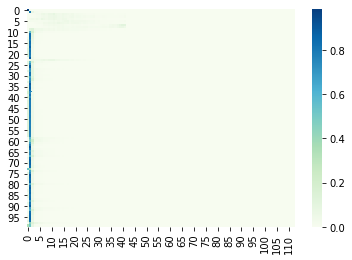

Train Dist: 22.43 Train Loss: 27.64


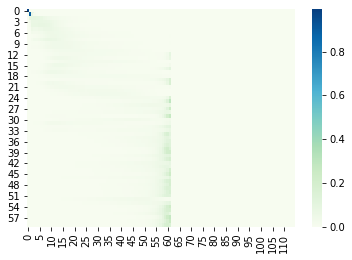

Val Dist: 29.38 Val Loss: 209.09
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 166/600 tf=0.9 af=0


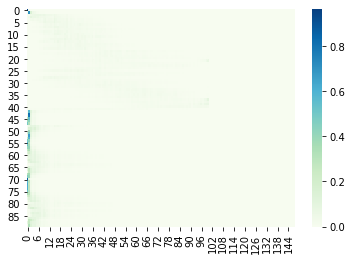

Train Dist: 25.72 Train Loss: 30.45


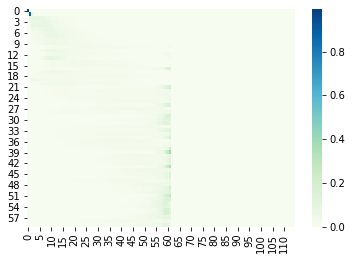

Val Dist: 28.59 Val Loss: 204.76
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 167/600 tf=0.9 af=0


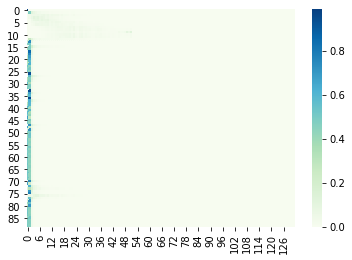

Train Dist: 23.51 Train Loss: 29.44


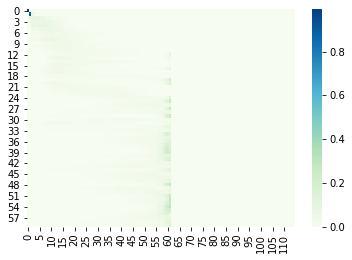

Val Dist: 28.84 Val Loss: 204.94
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 168/600 tf=0.9 af=0


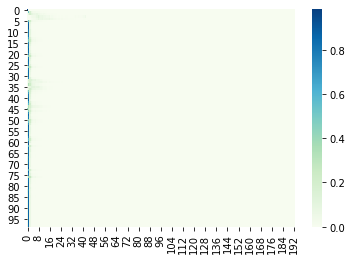

Train Dist: 24.49 Train Loss: 28.72


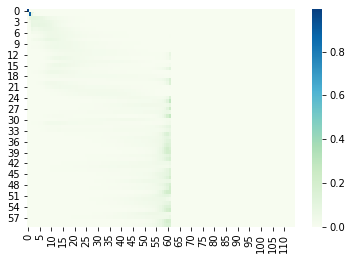

Val Dist: 28.66 Val Loss: 205.56
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 169/600 tf=0.9 af=0


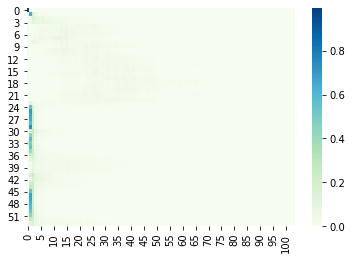

Train Dist: 23.67 Train Loss: 27.51


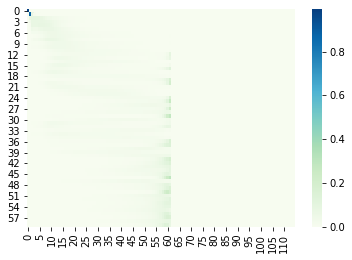

Val Dist: 26.63 Val Loss: 204.04
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 170/600 tf=0.9 af=0


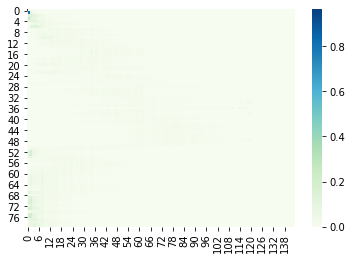

Train Dist: 23.75 Train Loss: 27.52


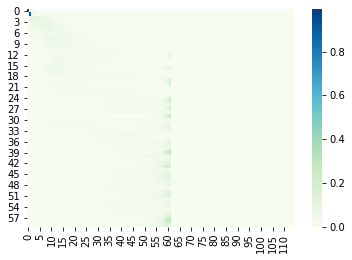

Val Dist: 28.30 Val Loss: 205.53
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 171/600 tf=0.9 af=0


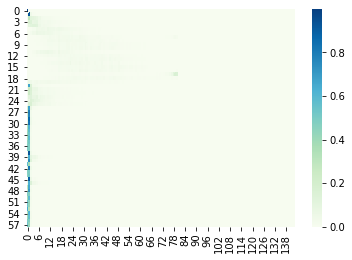

Train Dist: 23.17 Train Loss: 29.20


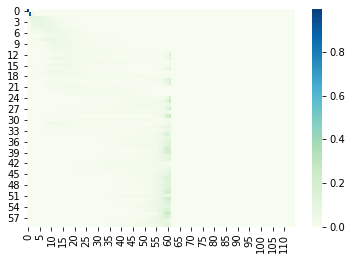

Val Dist: 27.28 Val Loss: 203.63
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 172/600 tf=0.9 af=0


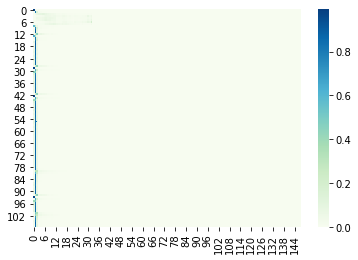

Train Dist: 24.71 Train Loss: 29.13


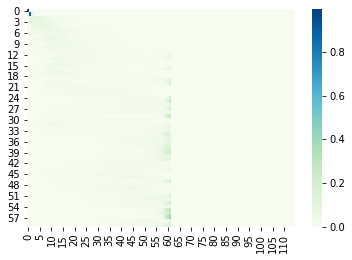

Val Dist: 27.98 Val Loss: 204.59
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 173/600 tf=0.9 af=0


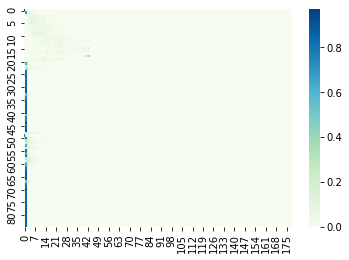

Train Dist: 24.42 Train Loss: 28.89


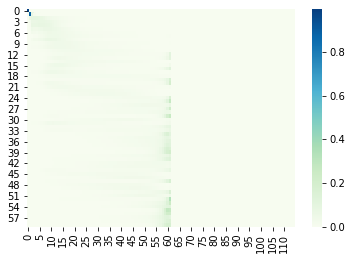

Val Dist: 27.67 Val Loss: 202.95
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 174/600 tf=0.9 af=0


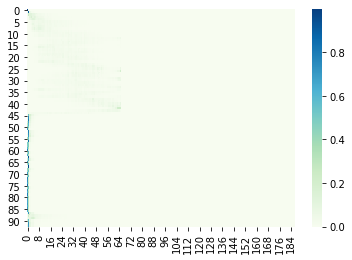

Train Dist: 22.16 Train Loss: 27.57


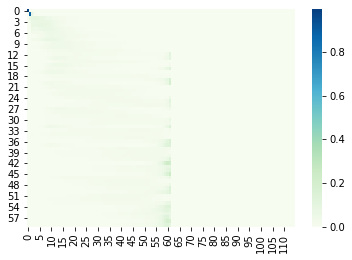

Val Dist: 27.70 Val Loss: 204.22
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 175/600 tf=0.9 af=0


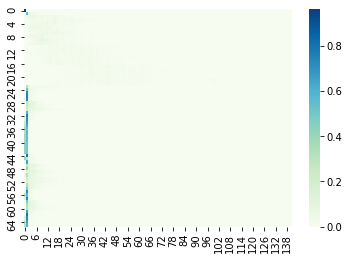

Train Dist: 24.73 Train Loss: 28.27


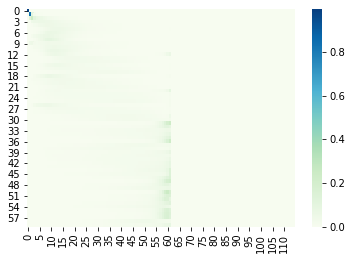

Val Dist: 27.06 Val Loss: 204.27
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 176/600 tf=0.9 af=0


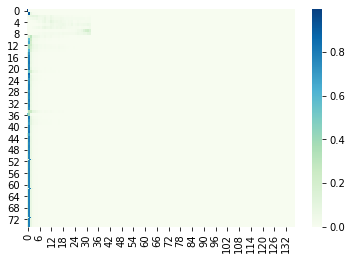

Train Dist: 23.86 Train Loss: 28.76


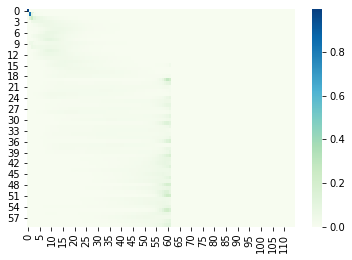

Val Dist: 27.72 Val Loss: 205.35
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 177/600 tf=0.9 af=0


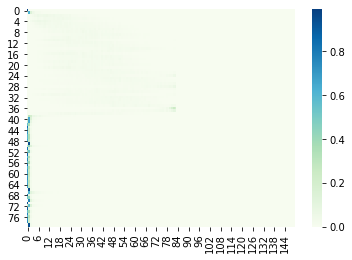

Train Dist: 23.08 Train Loss: 27.86


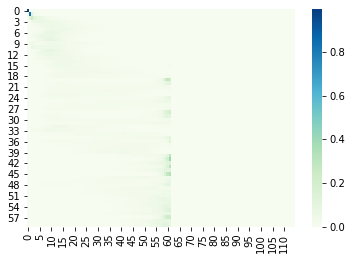

Val Dist: 28.53 Val Loss: 209.67
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 178/600 tf=0.9 af=0


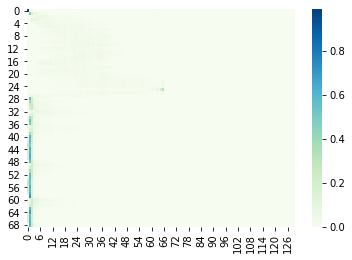

Train Dist: 22.43 Train Loss: 27.53


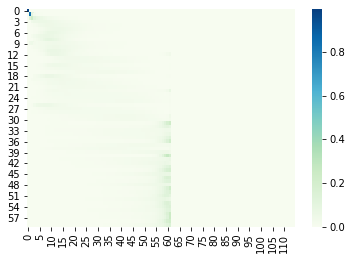

Val Dist: 29.42 Val Loss: 203.95
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 179/600 tf=0.9 af=0


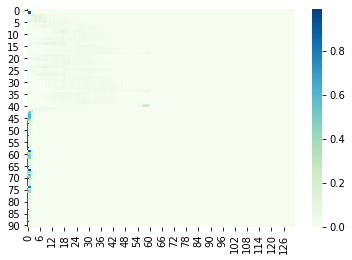

Train Dist: 24.16 Train Loss: 28.68


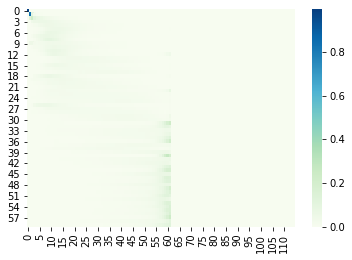

Val Dist: 29.48 Val Loss: 203.75
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 180/600 tf=0.9 af=0


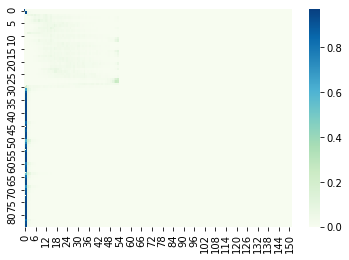

Train Dist: 23.89 Train Loss: 28.75


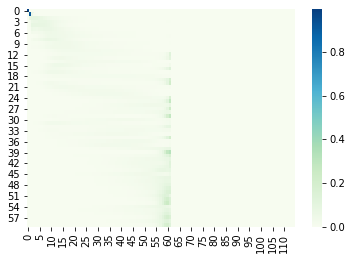

Val Dist: 30.64 Val Loss: 203.79
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 181/600 tf=0.9 af=0


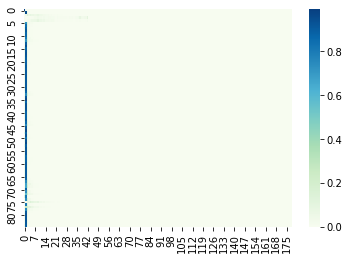

Train Dist: 22.93 Train Loss: 28.20


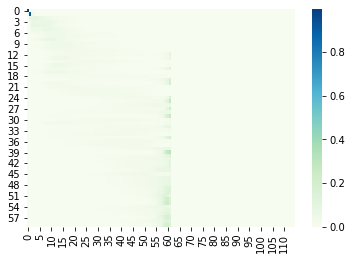

Val Dist: 29.73 Val Loss: 201.51
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 182/600 tf=0.9 af=0


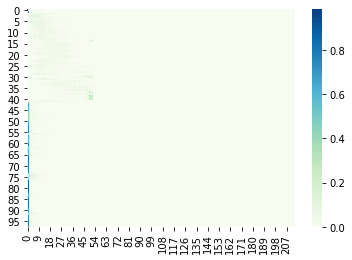

Train Dist: 22.47 Train Loss: 26.55


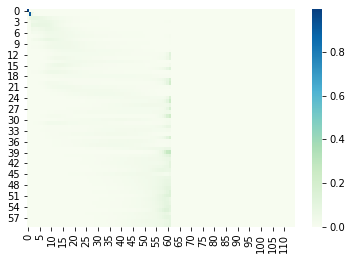

Val Dist: 28.03 Val Loss: 204.44
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 183/600 tf=0.9 af=0


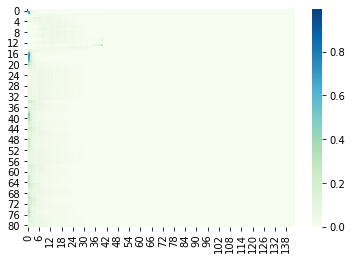

Train Dist: 22.90 Train Loss: 28.14


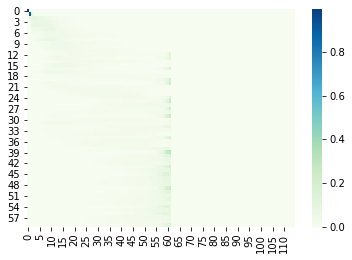

Val Dist: 26.47 Val Loss: 203.30
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 184/600 tf=0.9 af=0


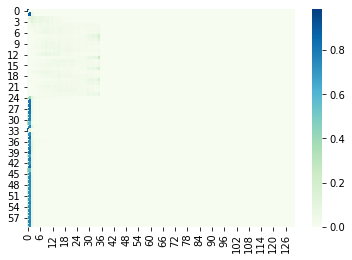

Train Dist: 23.86 Train Loss: 30.21


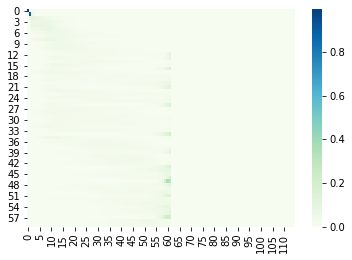

Val Dist: 27.48 Val Loss: 198.94
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 185/600 tf=0.9 af=0


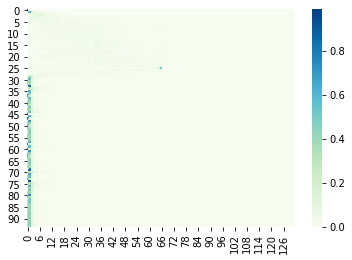

Train Dist: 24.72 Train Loss: 30.13


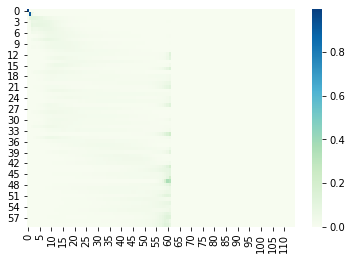

Val Dist: 28.47 Val Loss: 205.30
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 186/600 tf=0.9 af=0


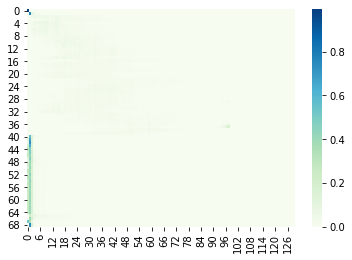

Train Dist: 22.03 Train Loss: 26.13


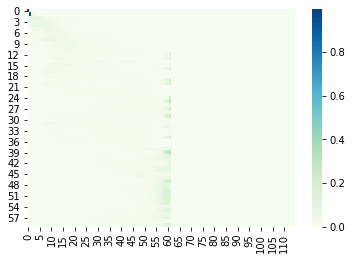

Val Dist: 27.55 Val Loss: 204.68
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 187/600 tf=0.9 af=0


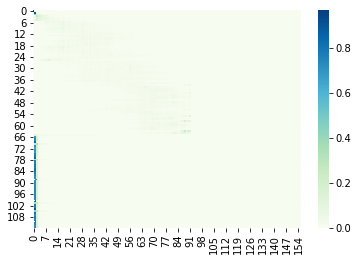

Train Dist: 21.92 Train Loss: 26.79


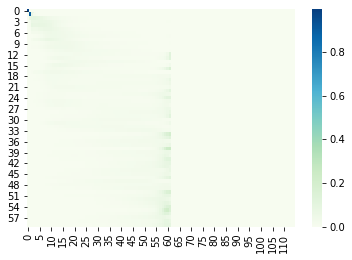

Val Dist: 27.95 Val Loss: 205.03
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 188/600 tf=0.9 af=0


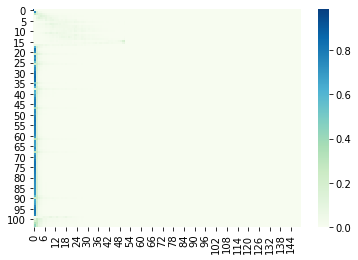

Train Dist: 20.55 Train Loss: 26.40


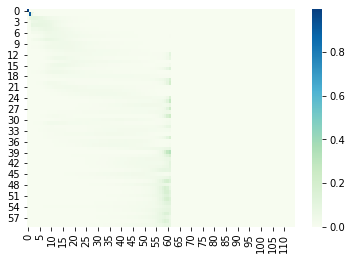

Val Dist: 30.53 Val Loss: 206.91
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 189/600 tf=0.9 af=0


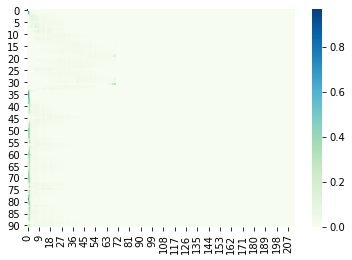

Train Dist: 23.10 Train Loss: 28.49


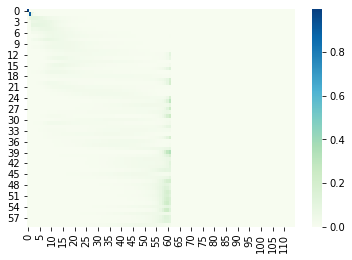

Val Dist: 28.74 Val Loss: 205.40
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 190/600 tf=0.9 af=0


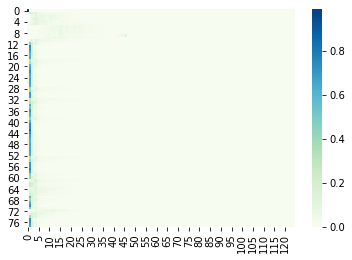

Train Dist: 22.04 Train Loss: 25.75


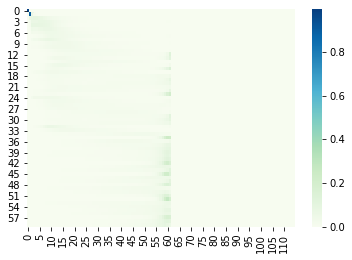

Val Dist: 26.30 Val Loss: 203.23
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 191/600 tf=0.9 af=0


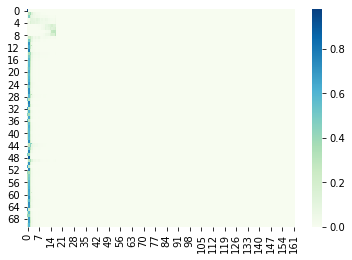

Train Dist: 22.48 Train Loss: 26.70


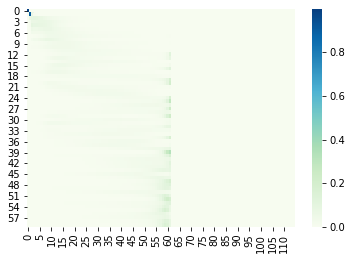

Val Dist: 27.40 Val Loss: 208.73
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 192/600 tf=0.9 af=0


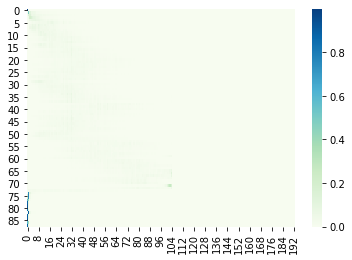

Train Dist: 21.50 Train Loss: 27.10


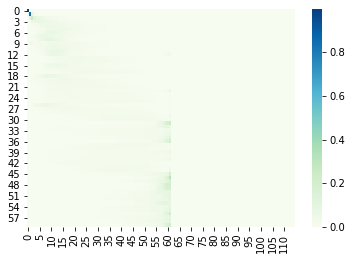

Val Dist: 28.45 Val Loss: 204.67
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 193/600 tf=0.9 af=0


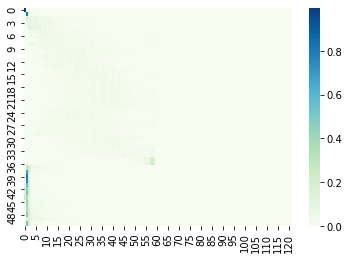

Train Dist: 21.82 Train Loss: 26.64


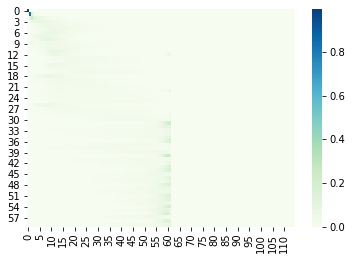

Val Dist: 29.06 Val Loss: 210.39
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 194/600 tf=0.9 af=0


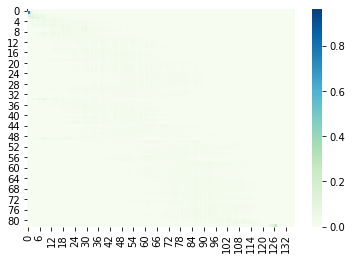

Train Dist: 23.77 Train Loss: 27.52


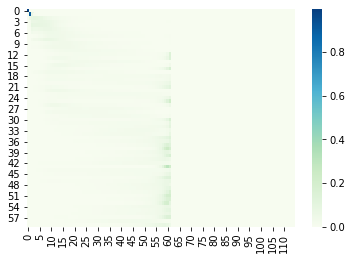

Val Dist: 28.84 Val Loss: 207.77
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 195/600 tf=0.9 af=0


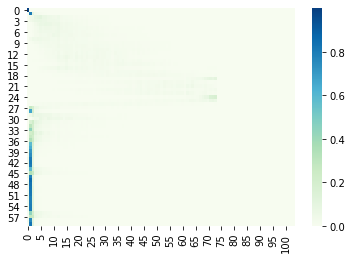

Train Dist: 21.65 Train Loss: 25.56


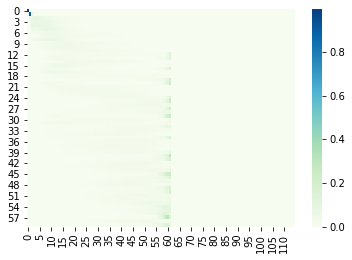

Val Dist: 28.30 Val Loss: 207.91
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 196/600 tf=0.9 af=0


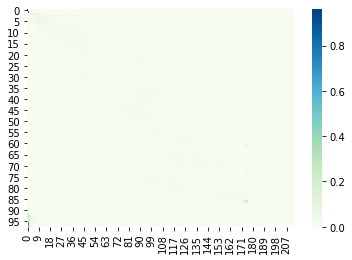

Train Dist: 22.34 Train Loss: 28.03


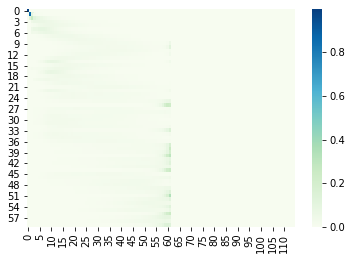

Val Dist: 27.25 Val Loss: 206.69
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 197/600 tf=0.9 af=0


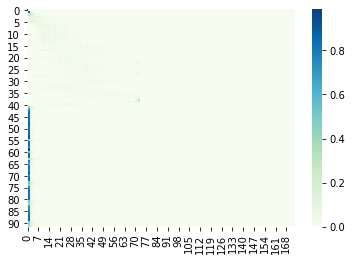

Train Dist: 20.13 Train Loss: 25.77


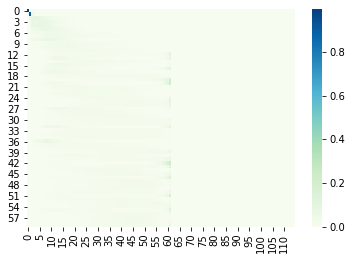

Val Dist: 27.65 Val Loss: 205.36
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 198/600 tf=0.9 af=0


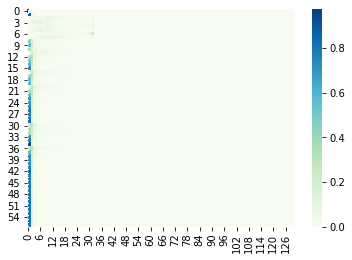

Train Dist: 21.81 Train Loss: 26.80


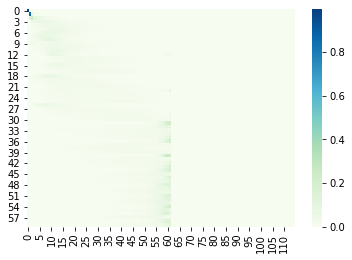

Val Dist: 27.19 Val Loss: 203.32
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 199/600 tf=0.9 af=0


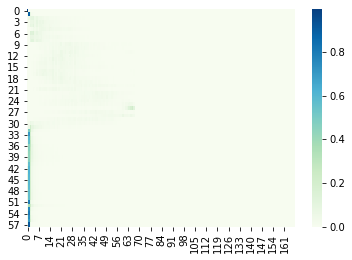

Train Dist: 22.33 Train Loss: 27.95


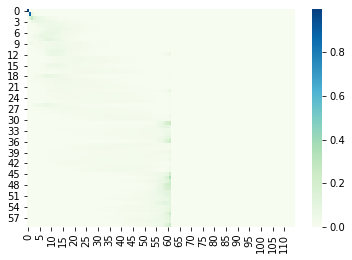

Val Dist: 27.08 Val Loss: 205.38
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 200/600 tf=0.9 af=0


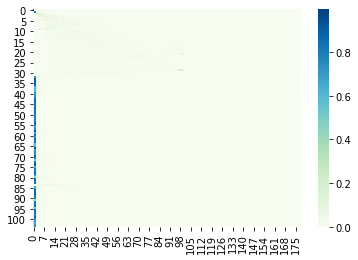

Train Dist: 22.11 Train Loss: 28.13


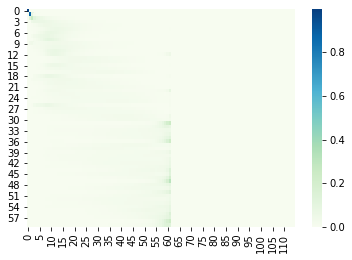

Val Dist: 29.86 Val Loss: 200.88
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 201/600 tf=0.9 af=0


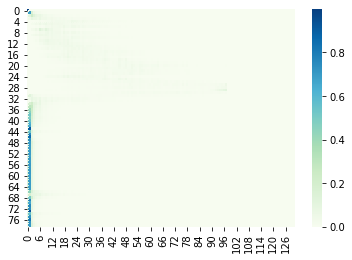

Train Dist: 20.80 Train Loss: 25.50


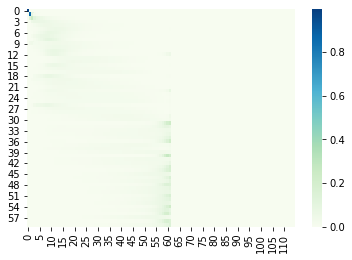

Val Dist: 29.28 Val Loss: 200.76
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 202/600 tf=0.9 af=0


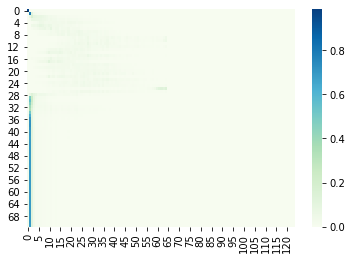

Train Dist: 21.21 Train Loss: 25.82


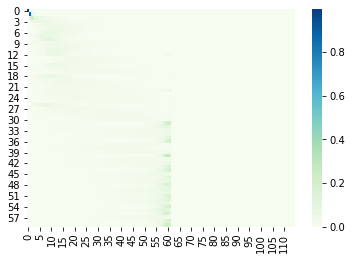

Val Dist: 30.40 Val Loss: 205.06
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 203/600 tf=0.9 af=0


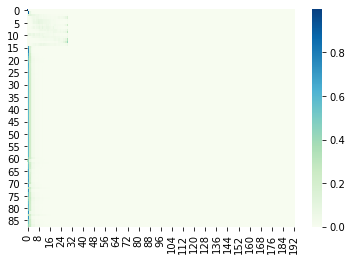

Train Dist: 21.01 Train Loss: 25.85


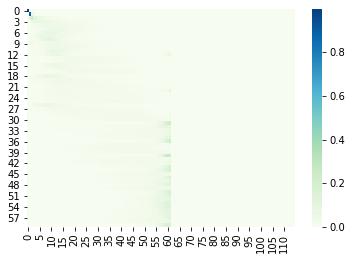

Val Dist: 27.74 Val Loss: 202.10
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 204/600 tf=0.9 af=0


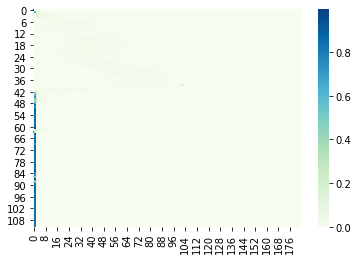

Train Dist: 20.54 Train Loss: 25.94


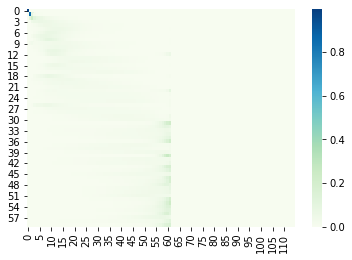

Val Dist: 27.62 Val Loss: 201.14
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 205/600 tf=0.9 af=0


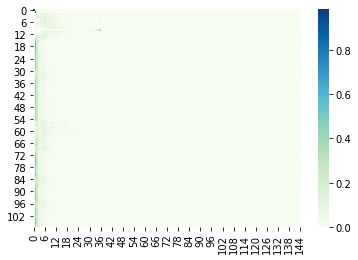

Train Dist: 18.60 Train Loss: 25.59


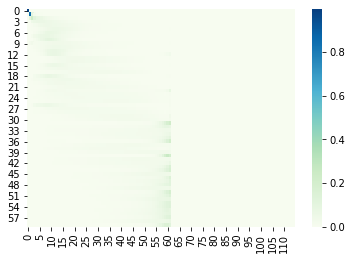

Val Dist: 29.21 Val Loss: 206.37
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 206/600 tf=0.9 af=0


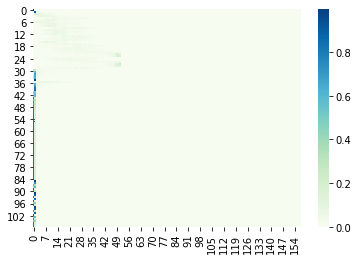

Train Dist: 19.83 Train Loss: 24.21


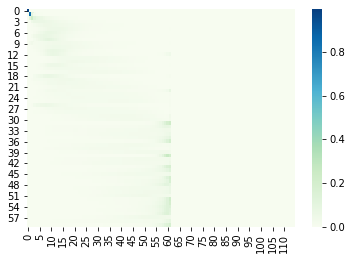

Val Dist: 27.85 Val Loss: 210.15
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 207/600 tf=0.9 af=0


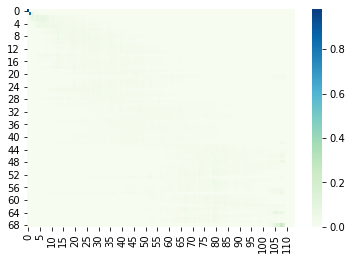

Train Dist: 19.62 Train Loss: 26.67


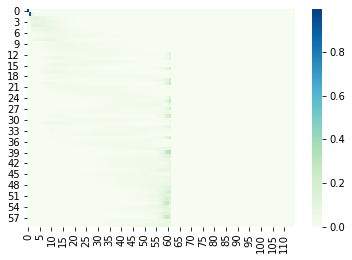

Val Dist: 26.54 Val Loss: 207.47
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 208/600 tf=0.9 af=0


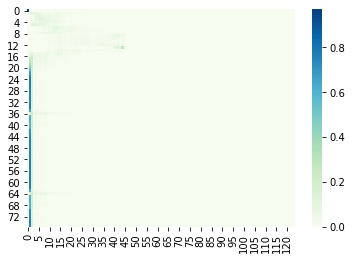

Train Dist: 20.63 Train Loss: 24.15


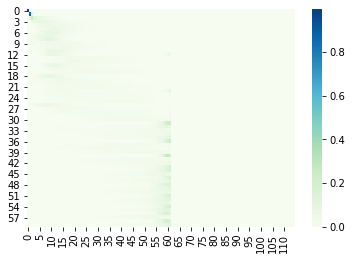

Val Dist: 26.22 Val Loss: 204.74
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 209/600 tf=0.9 af=0


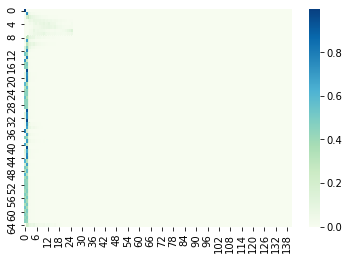

Train Dist: 21.31 Train Loss: 27.93


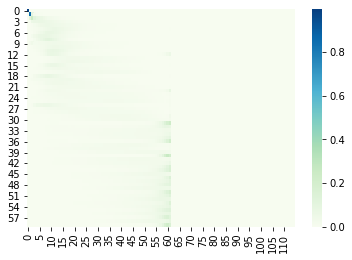

Val Dist: 27.28 Val Loss: 203.90
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 210/600 tf=0.9 af=0


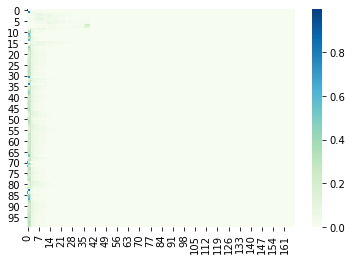

Train Dist: 21.68 Train Loss: 25.37


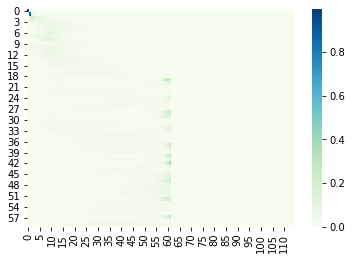

Val Dist: 26.31 Val Loss: 206.99
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 211/600 tf=0.9 af=0


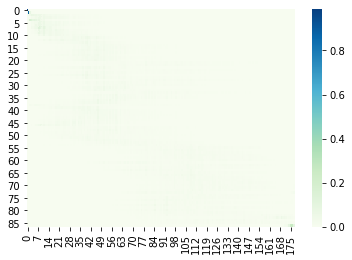

Train Dist: 19.40 Train Loss: 24.26


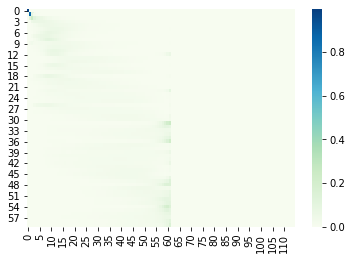

Val Dist: 26.46 Val Loss: 202.19
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 212/600 tf=0.9 af=0


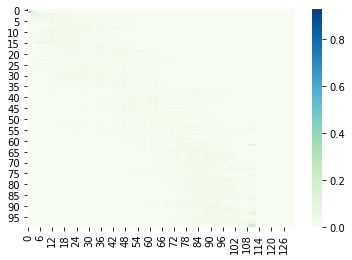

Train Dist: 18.20 Train Loss: 25.06


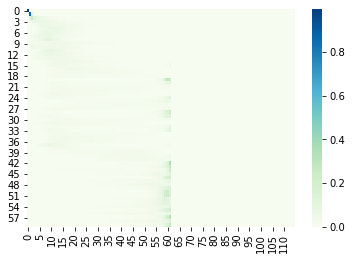

Val Dist: 27.60 Val Loss: 210.95
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 213/600 tf=0.9 af=0


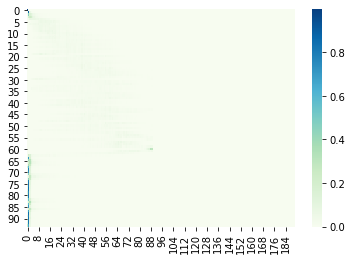

Train Dist: 23.26 Train Loss: 30.11


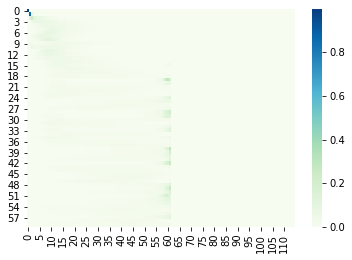

Val Dist: 26.30 Val Loss: 207.25
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 214/600 tf=0.9 af=0


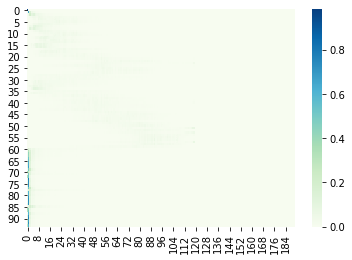

Train Dist: 20.53 Train Loss: 24.80


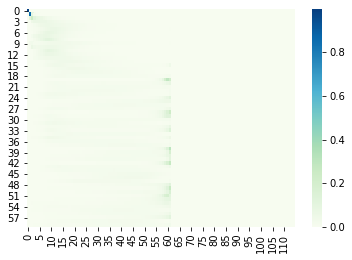

Val Dist: 26.64 Val Loss: 208.95
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 215/600 tf=0.9 af=0


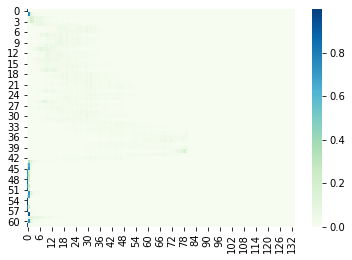

Train Dist: 19.25 Train Loss: 24.54


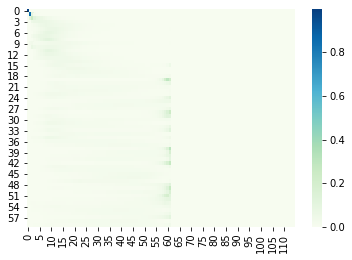

Val Dist: 27.27 Val Loss: 214.31
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 216/600 tf=0.9 af=0


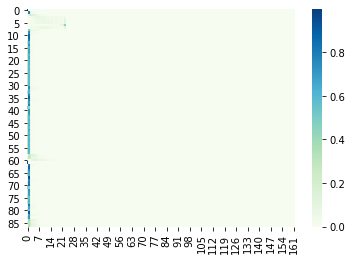

Train Dist: 20.44 Train Loss: 25.91


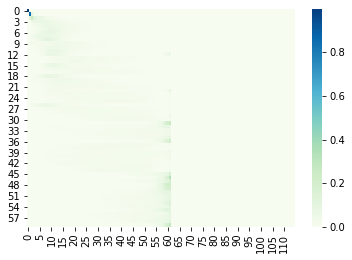

Val Dist: 27.91 Val Loss: 210.46
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 217/600 tf=0.9 af=0


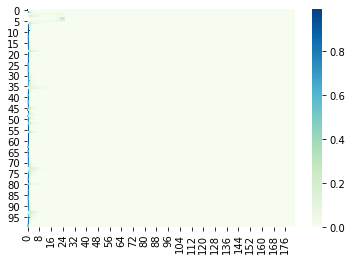

Train Dist: 19.16 Train Loss: 25.03


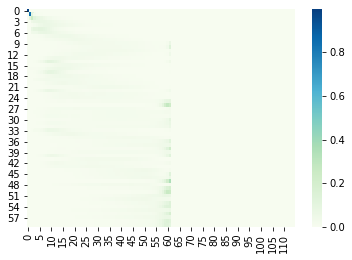

Val Dist: 27.74 Val Loss: 211.37
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 218/600 tf=0.9 af=0


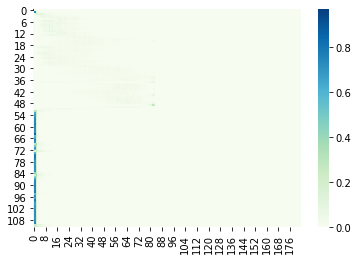

Train Dist: 19.06 Train Loss: 25.00


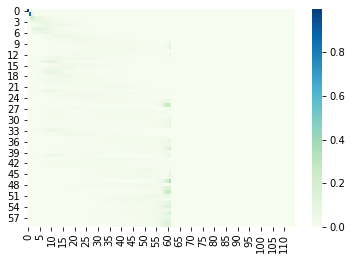

Val Dist: 28.41 Val Loss: 216.31
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 219/600 tf=0.9 af=0


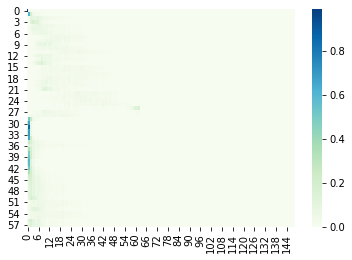

Train Dist: 19.41 Train Loss: 23.32


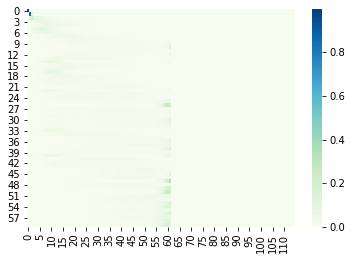

Val Dist: 27.31 Val Loss: 215.29
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 220/600 tf=0.9 af=0


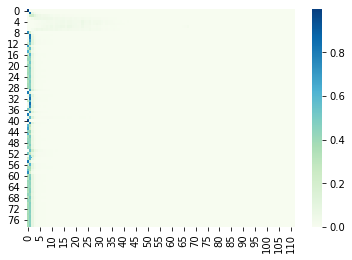

Train Dist: 20.25 Train Loss: 25.74


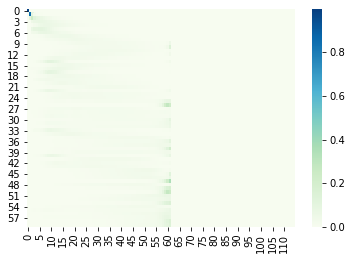

Val Dist: 28.56 Val Loss: 214.69
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 221/600 tf=0.9 af=0


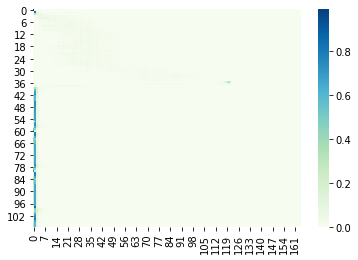

Train Dist: 19.29 Train Loss: 25.74


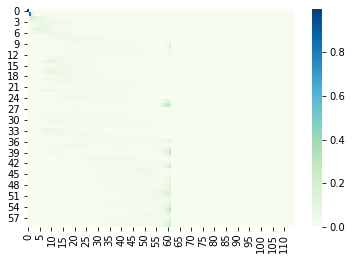

Val Dist: 28.16 Val Loss: 209.73
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 222/600 tf=0.9 af=0


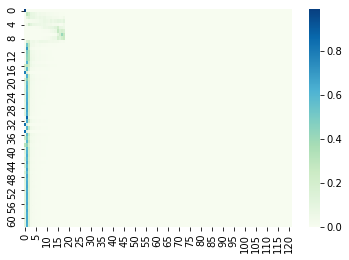

Train Dist: 19.80 Train Loss: 25.31


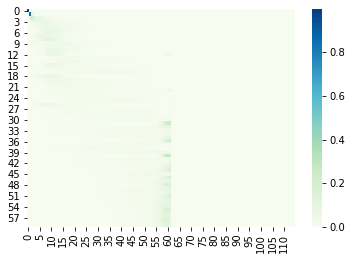

Val Dist: 28.90 Val Loss: 211.75
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 223/600 tf=0.9 af=0


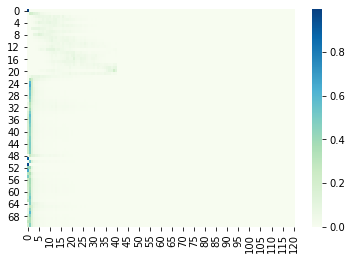

Train Dist: 17.80 Train Loss: 23.58


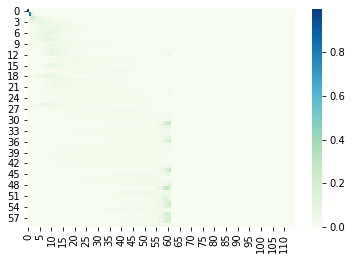

Val Dist: 29.01 Val Loss: 213.95
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 224/600 tf=0.9 af=0


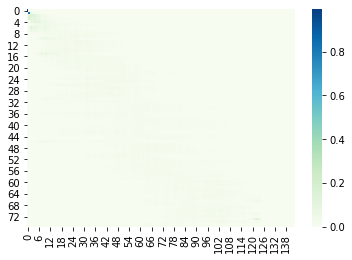

Train Dist: 20.65 Train Loss: 25.97


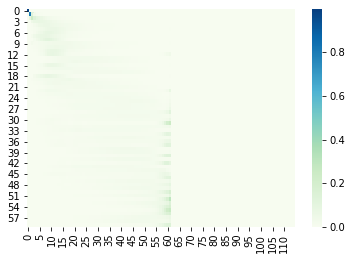

Val Dist: 28.93 Val Loss: 208.93
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 225/600 tf=0.9 af=0


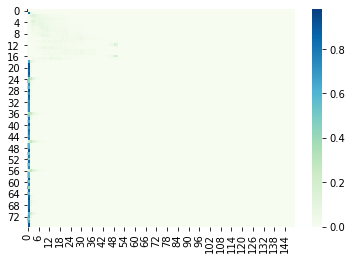

Train Dist: 19.80 Train Loss: 24.81


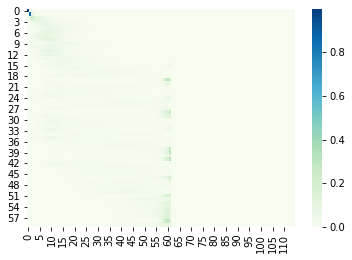

Val Dist: 28.87 Val Loss: 212.43
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 226/600 tf=0.9 af=0


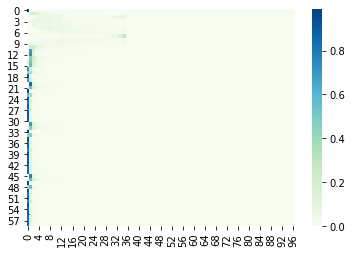

Train Dist: 18.02 Train Loss: 24.01


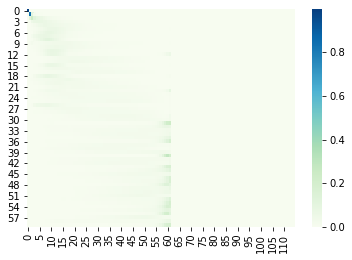

Val Dist: 27.49 Val Loss: 215.77
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 227/600 tf=0.9 af=0


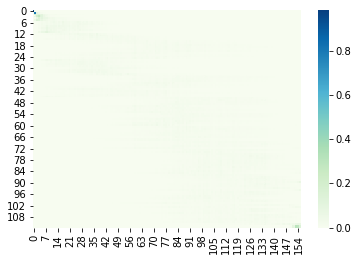

Train Dist: 19.51 Train Loss: 26.33


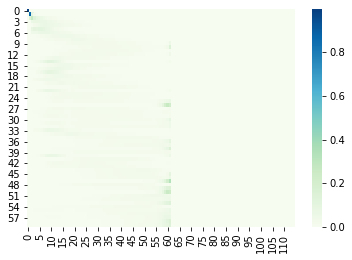

Val Dist: 29.38 Val Loss: 218.46
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 228/600 tf=0.9 af=0


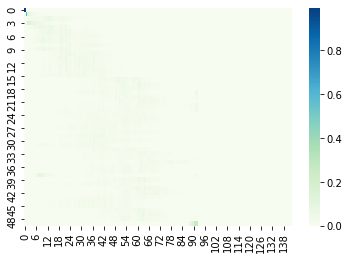

Train Dist: 20.51 Train Loss: 24.00


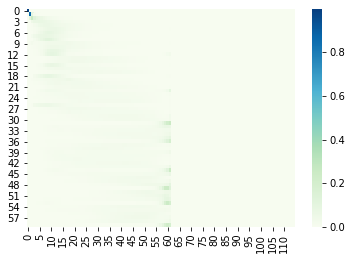

Val Dist: 31.20 Val Loss: 216.25
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 229/600 tf=0.9 af=0


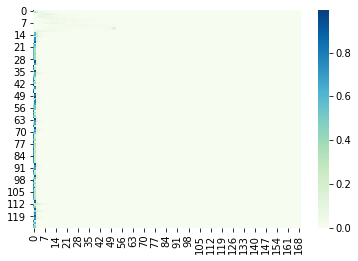

Train Dist: 19.17 Train Loss: 25.12


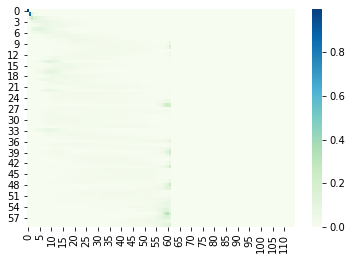

Val Dist: 28.60 Val Loss: 214.36
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 230/600 tf=0.9 af=0


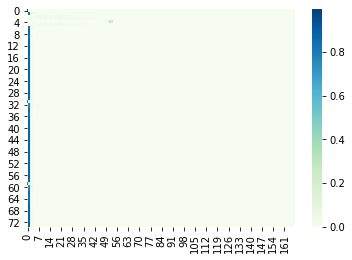

Train Dist: 20.35 Train Loss: 25.61


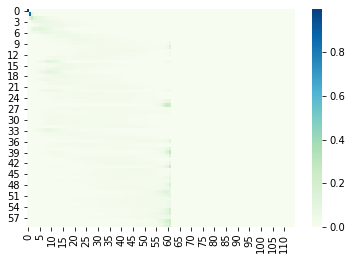

Val Dist: 28.03 Val Loss: 215.58
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 231/600 tf=0.9 af=0


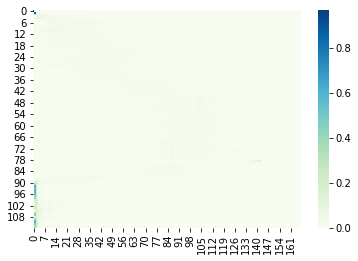

Train Dist: 18.13 Train Loss: 23.93


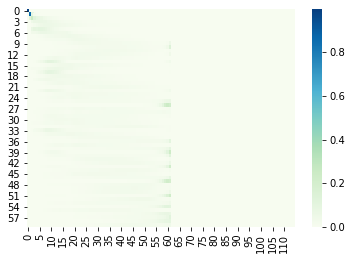

Val Dist: 28.26 Val Loss: 214.62
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 232/600 tf=0.9 af=0


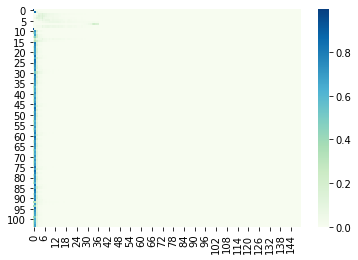

Train Dist: 17.12 Train Loss: 23.90


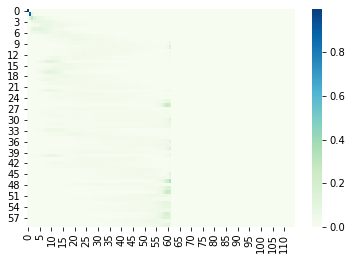

Val Dist: 29.28 Val Loss: 219.22
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 233/600 tf=0.9 af=0


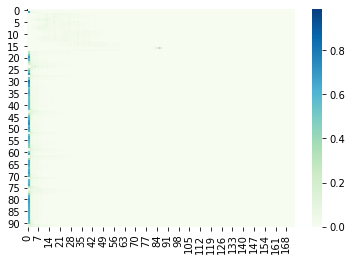

Train Dist: 18.95 Train Loss: 23.77


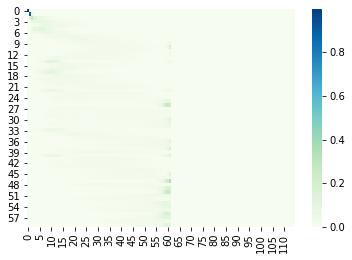

Val Dist: 28.34 Val Loss: 220.29
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 234/600 tf=0.9 af=0


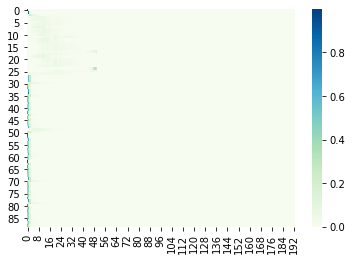

Train Dist: 20.04 Train Loss: 26.01


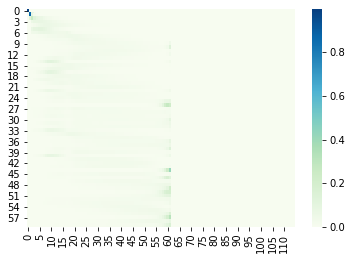

Val Dist: 29.08 Val Loss: 218.94
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 235/600 tf=0.9 af=0


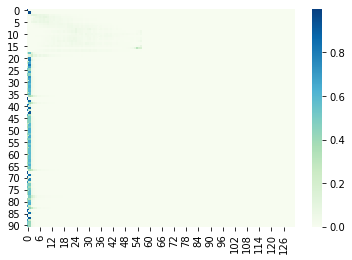

Train Dist: 20.70 Train Loss: 25.80


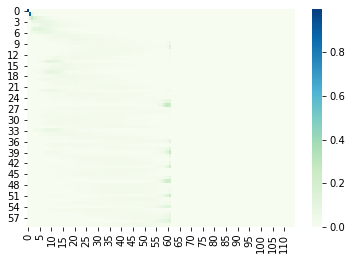

Val Dist: 28.87 Val Loss: 217.21
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 236/600 tf=0.9 af=0


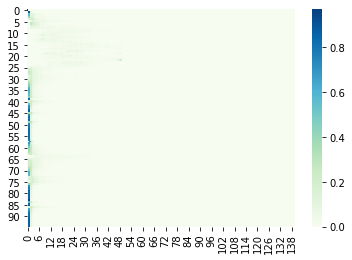

Train Dist: 17.96 Train Loss: 23.12


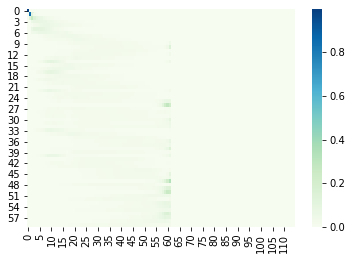

Val Dist: 28.96 Val Loss: 219.69
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 237/600 tf=0.9 af=0


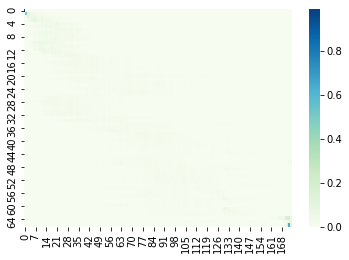

Train Dist: 18.93 Train Loss: 24.34


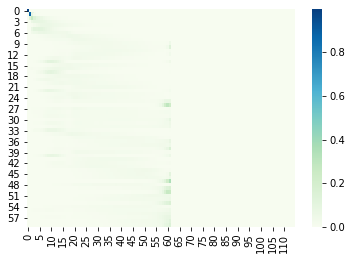

Val Dist: 29.34 Val Loss: 221.61
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 238/600 tf=0.9 af=0


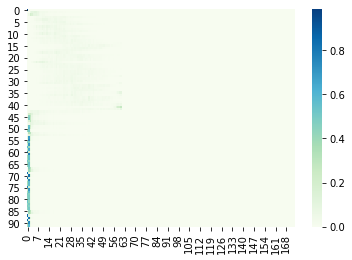

Train Dist: 18.44 Train Loss: 23.78


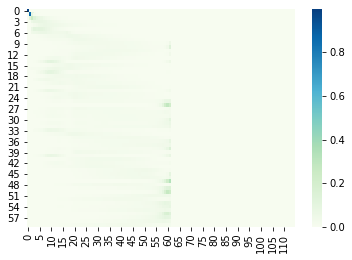

Val Dist: 27.55 Val Loss: 216.06
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 239/600 tf=0.9 af=0


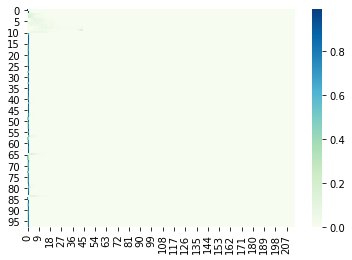

Train Dist: 19.87 Train Loss: 25.20


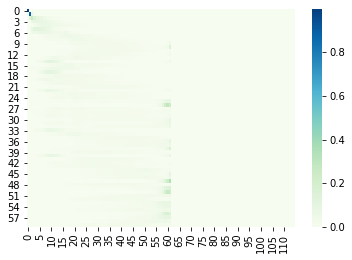

Val Dist: 27.67 Val Loss: 216.71
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 240/600 tf=0.9 af=0


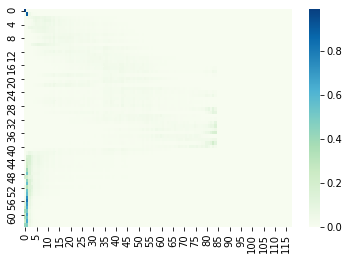

Train Dist: 19.73 Train Loss: 24.16


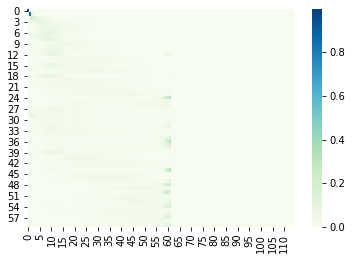

Val Dist: 27.00 Val Loss: 212.77
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 241/600 tf=0.9 af=0


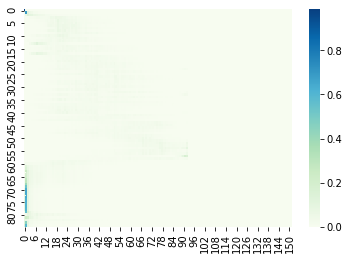

Train Dist: 17.50 Train Loss: 23.26


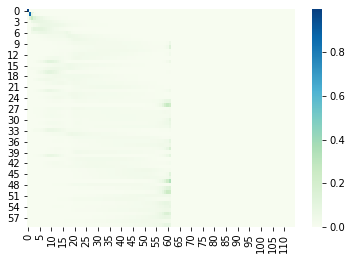

Val Dist: 27.27 Val Loss: 216.52
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 242/600 tf=0.9 af=0


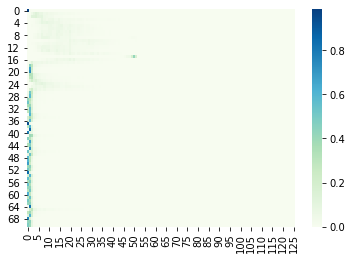

Train Dist: 18.39 Train Loss: 25.10


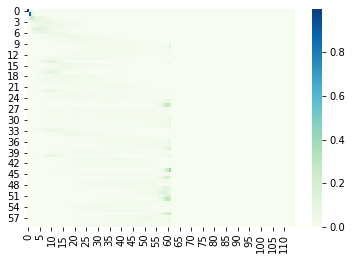

Val Dist: 27.06 Val Loss: 211.86
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 243/600 tf=0.9 af=0


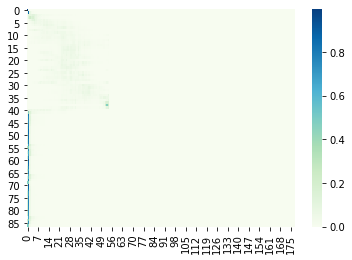

Train Dist: 17.48 Train Loss: 23.43


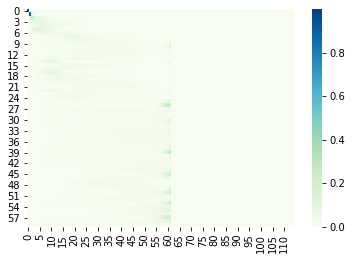

Val Dist: 26.88 Val Loss: 218.02
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 244/600 tf=0.9 af=0


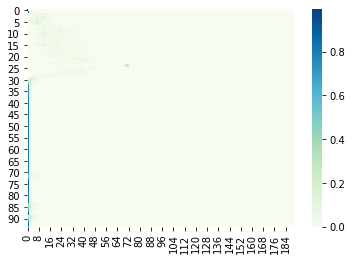

Train Dist: 18.22 Train Loss: 24.68


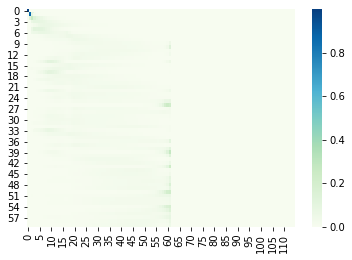

Val Dist: 27.74 Val Loss: 216.52
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 245/600 tf=0.9 af=0


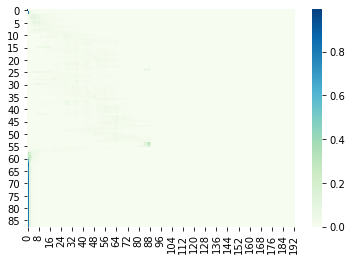

Train Dist: 18.51 Train Loss: 23.21


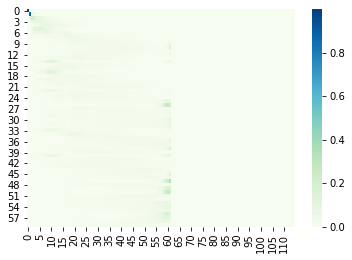

Val Dist: 26.65 Val Loss: 212.89
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 246/600 tf=0.9 af=0


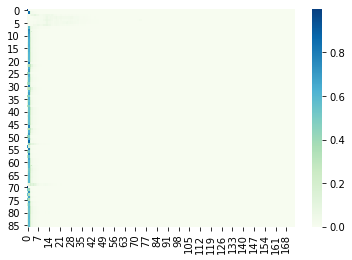

Train Dist: 18.51 Train Loss: 24.56


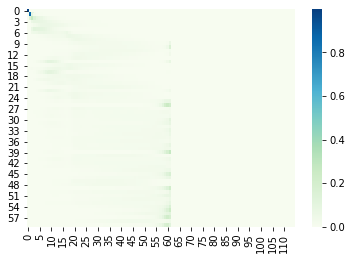

Val Dist: 27.34 Val Loss: 212.62
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 247/600 tf=0.9 af=0


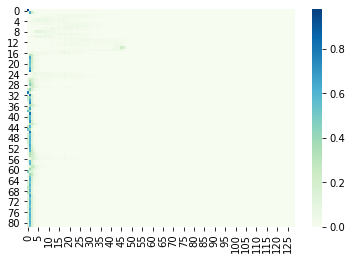

Train Dist: 19.12 Train Loss: 24.45


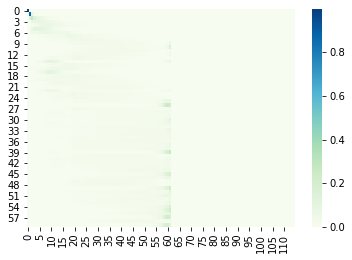

Val Dist: 26.63 Val Loss: 215.76
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 248/600 tf=0.9 af=0


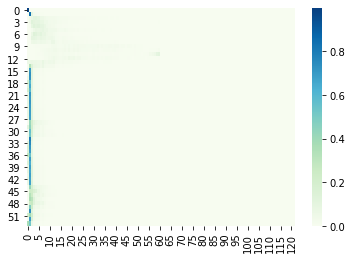

Train Dist: 18.01 Train Loss: 23.46


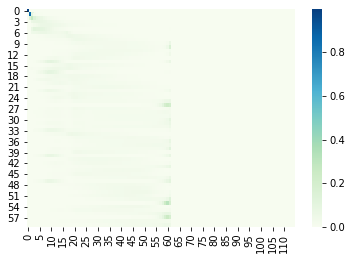

Val Dist: 27.16 Val Loss: 212.50
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 249/600 tf=0.9 af=0


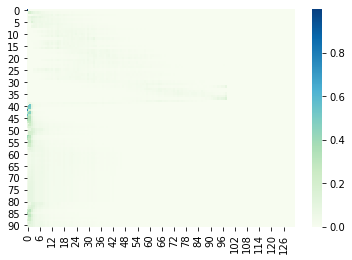

Train Dist: 16.72 Train Loss: 21.78


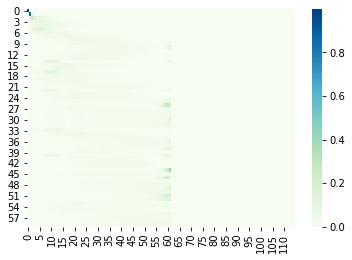

Val Dist: 27.08 Val Loss: 214.99
Adjusting learning rate of group 0 to 6.0000e-05.

Epoch 250/600 tf=0.9 af=0


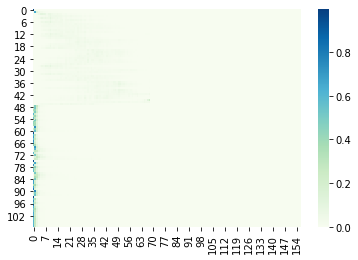

Train Dist: 15.88 Train Loss: 20.69


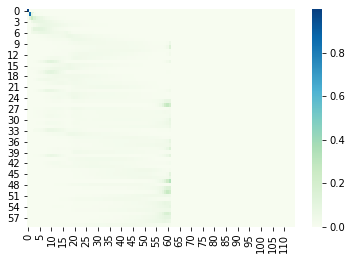

Val Dist: 27.37 Val Loss: 217.43
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 251/600 tf=0.9 af=0


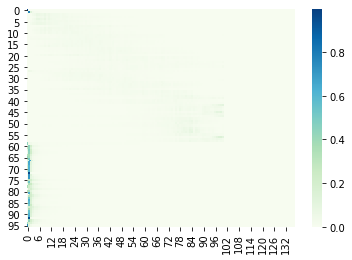

Train Dist: 16.19 Train Loss: 22.22


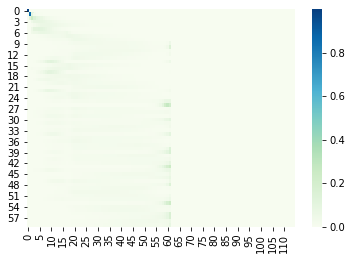

Val Dist: 27.42 Val Loss: 219.83
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 252/600 tf=0.9 af=0


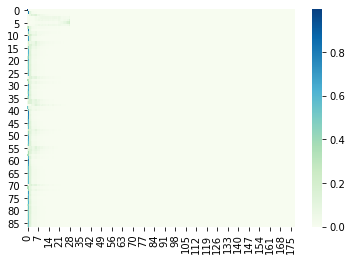

Train Dist: 16.25 Train Loss: 21.31


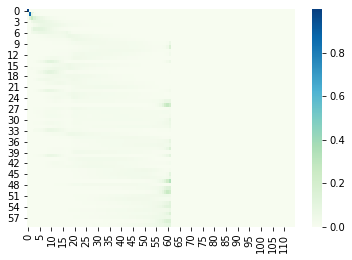

Val Dist: 27.04 Val Loss: 216.97
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 253/600 tf=0.9 af=0


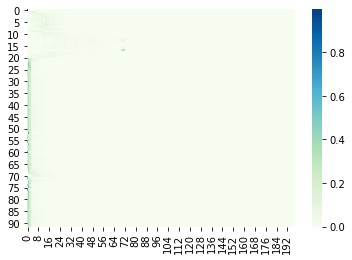

Train Dist: 16.99 Train Loss: 22.67


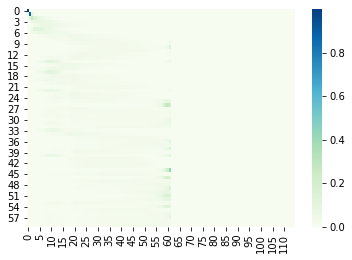

Val Dist: 27.15 Val Loss: 218.53
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 254/600 tf=0.9 af=0


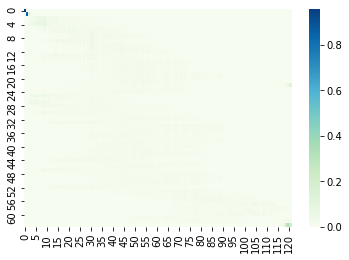

Train Dist: 17.35 Train Loss: 23.24


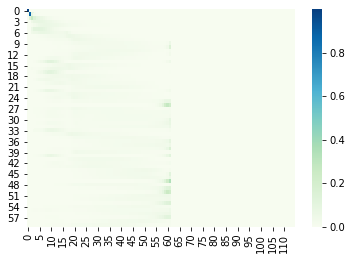

Val Dist: 27.00 Val Loss: 216.17
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 255/600 tf=0.9 af=0


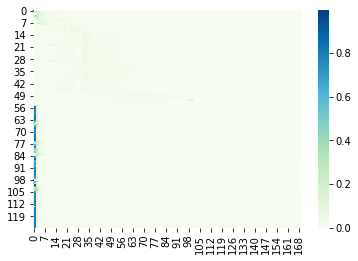

Train Dist: 17.82 Train Loss: 22.82


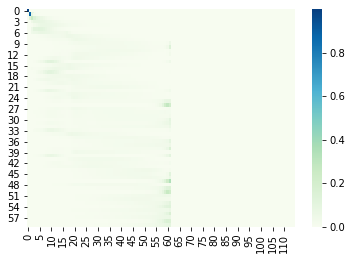

Val Dist: 27.59 Val Loss: 215.93
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 256/600 tf=0.9 af=0


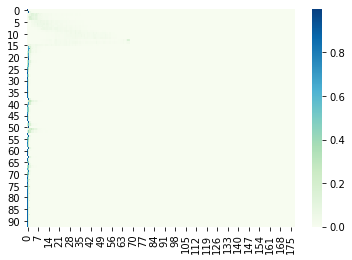

Train Dist: 16.10 Train Loss: 22.20


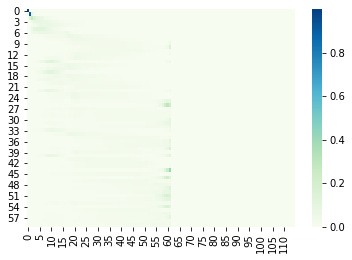

Val Dist: 28.16 Val Loss: 220.13
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 257/600 tf=0.9 af=0


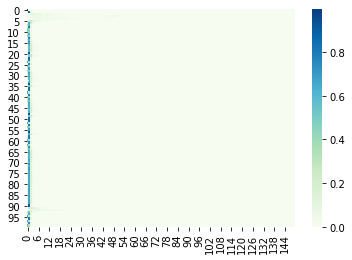

Train Dist: 17.96 Train Loss: 25.76


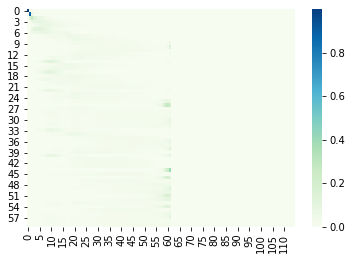

Val Dist: 28.54 Val Loss: 215.39
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 258/600 tf=0.9 af=0


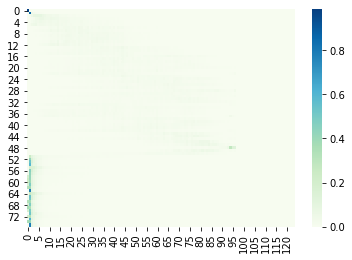

Train Dist: 17.38 Train Loss: 24.28


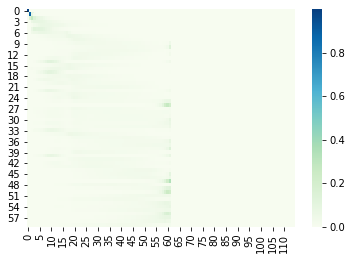

Val Dist: 28.44 Val Loss: 217.68
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 259/600 tf=0.9 af=0


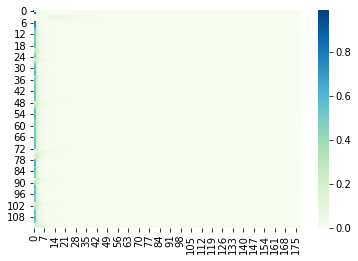

Train Dist: 18.16 Train Loss: 23.03


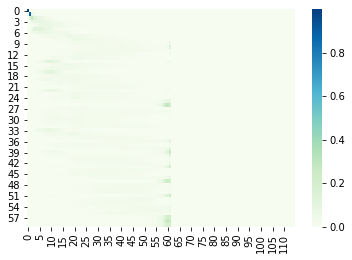

Val Dist: 29.13 Val Loss: 217.16
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 260/600 tf=0.9 af=0


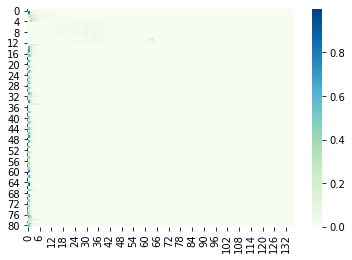

Train Dist: 17.99 Train Loss: 23.28


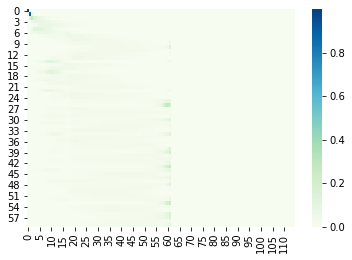

Val Dist: 28.52 Val Loss: 217.57
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 261/600 tf=0.9 af=0


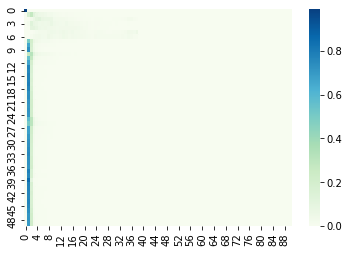

Train Dist: 16.80 Train Loss: 24.35


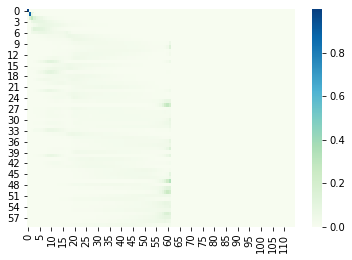

Val Dist: 26.97 Val Loss: 216.59
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 262/600 tf=0.9 af=0


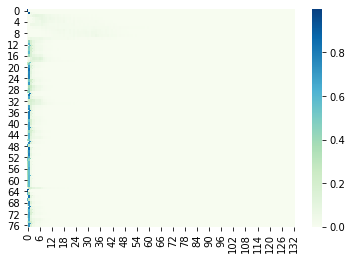

Train Dist: 15.94 Train Loss: 23.39


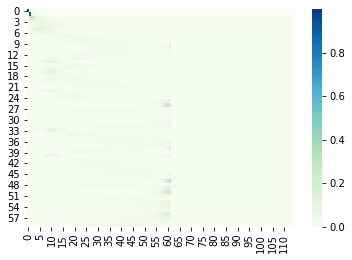

Val Dist: 27.74 Val Loss: 215.93
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 263/600 tf=0.9 af=0


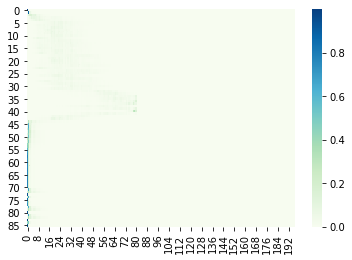

Train Dist: 16.59 Train Loss: 22.15


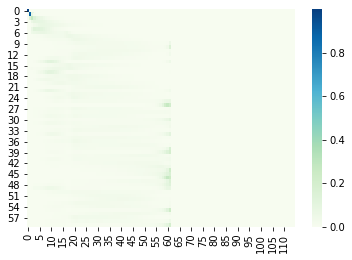

Val Dist: 27.53 Val Loss: 216.88
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 264/600 tf=0.9 af=0


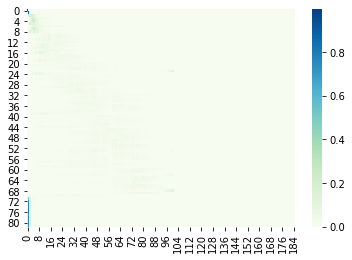

Train Dist: 15.62 Train Loss: 21.22


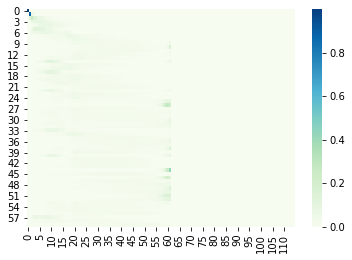

Val Dist: 27.95 Val Loss: 219.14
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 265/600 tf=0.9 af=0


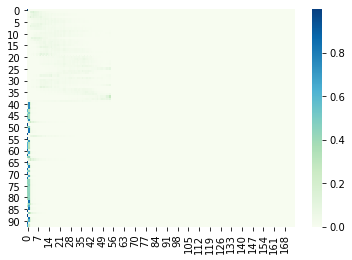

Train Dist: 17.60 Train Loss: 23.04


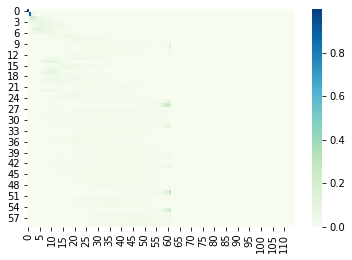

Val Dist: 27.54 Val Loss: 211.92
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 266/600 tf=0.9 af=0


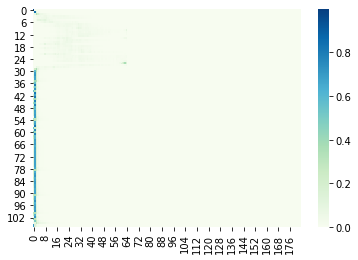

Train Dist: 16.28 Train Loss: 22.81


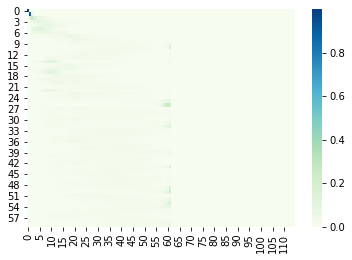

Val Dist: 28.07 Val Loss: 217.81
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 267/600 tf=0.9 af=0


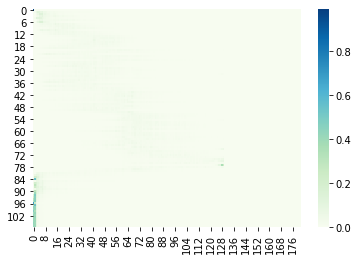

Train Dist: 15.42 Train Loss: 22.13


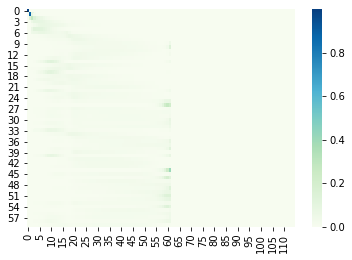

Val Dist: 27.41 Val Loss: 216.90
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 268/600 tf=0.9 af=0


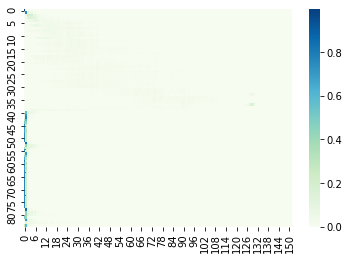

Train Dist: 17.05 Train Loss: 23.26


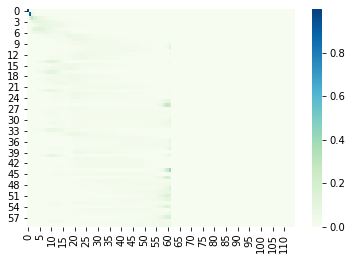

Val Dist: 28.77 Val Loss: 220.31
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 269/600 tf=0.9 af=0


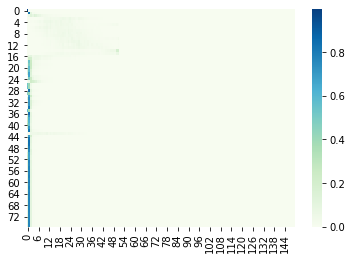

Train Dist: 16.28 Train Loss: 22.45


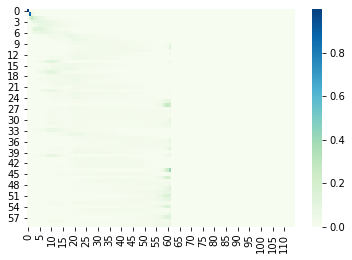

Val Dist: 27.80 Val Loss: 216.21
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 270/600 tf=0.9 af=0


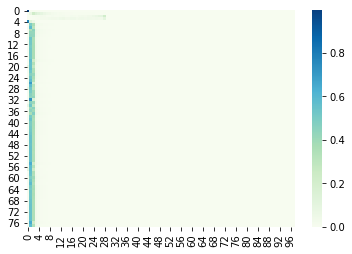

Train Dist: 16.38 Train Loss: 21.96


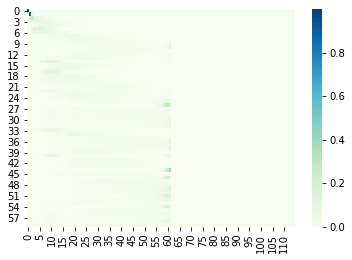

Val Dist: 27.84 Val Loss: 219.73
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 271/600 tf=0.9 af=0


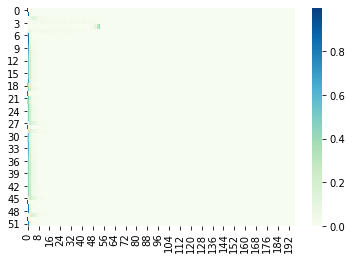

Train Dist: 17.81 Train Loss: 23.37


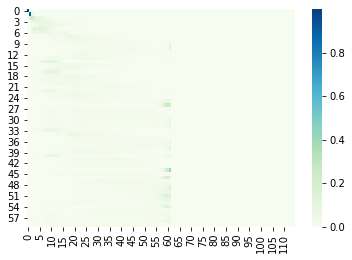

Val Dist: 28.45 Val Loss: 221.74
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 272/600 tf=0.9 af=0


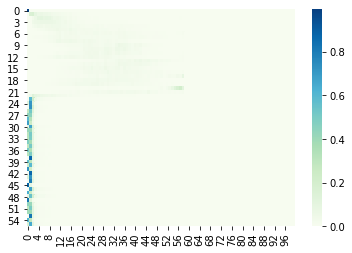

Train Dist: 17.28 Train Loss: 23.60


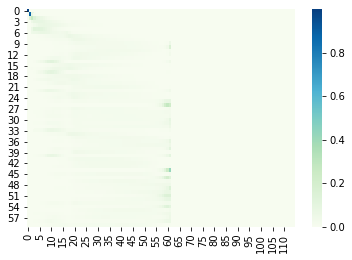

Val Dist: 27.98 Val Loss: 219.02
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 273/600 tf=0.9 af=0


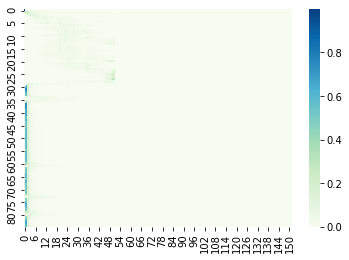

Train Dist: 16.84 Train Loss: 22.85


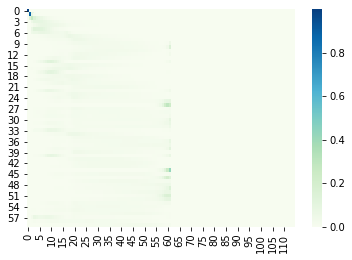

Val Dist: 28.27 Val Loss: 222.75
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 274/600 tf=0.9 af=0


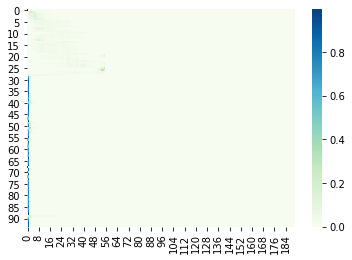

Train Dist: 16.37 Train Loss: 22.85


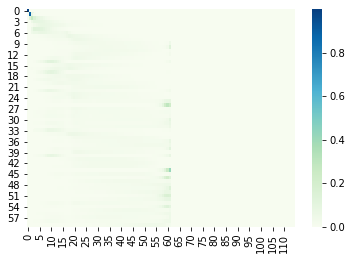

Val Dist: 27.73 Val Loss: 219.12
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 275/600 tf=0.9 af=0


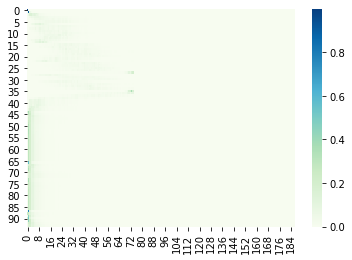

Train Dist: 18.85 Train Loss: 24.41


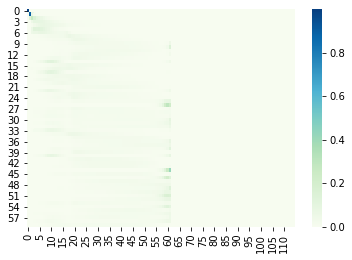

Val Dist: 28.34 Val Loss: 214.30
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 276/600 tf=0.9 af=0


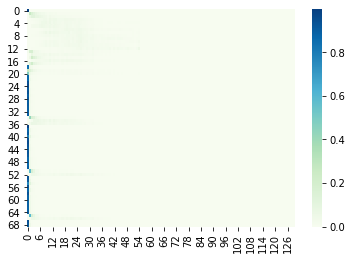

Train Dist: 16.45 Train Loss: 21.76


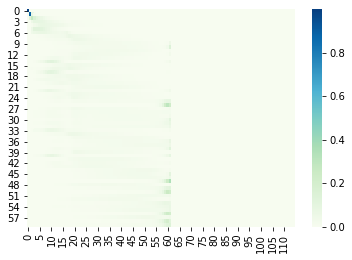

Val Dist: 27.93 Val Loss: 220.37
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 277/600 tf=0.9 af=0


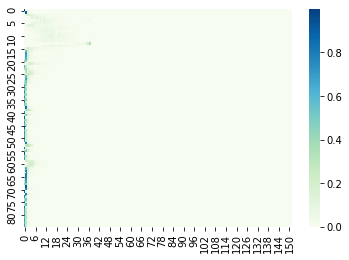

Train Dist: 16.65 Train Loss: 22.79


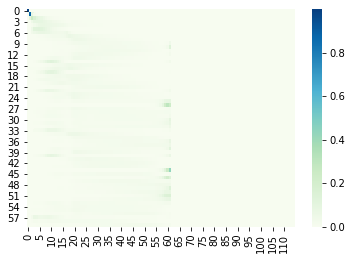

Val Dist: 27.92 Val Loss: 218.15
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 278/600 tf=0.9 af=0


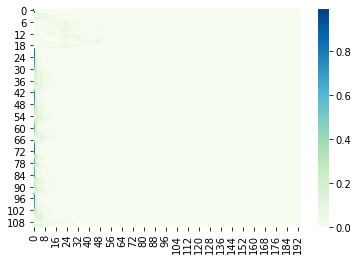

Train Dist: 18.03 Train Loss: 22.39


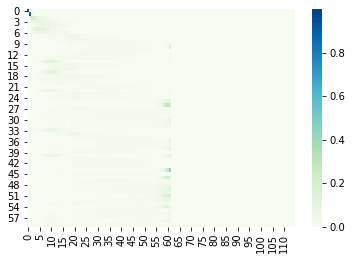

Val Dist: 27.71 Val Loss: 222.81
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 279/600 tf=0.9 af=0


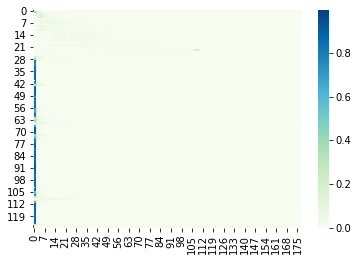

Train Dist: 15.11 Train Loss: 20.00


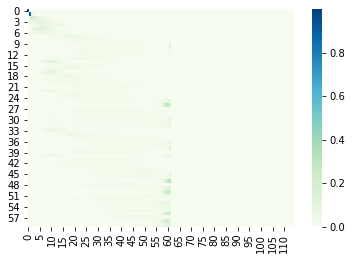

Val Dist: 27.53 Val Loss: 221.32
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 280/600 tf=0.9 af=0


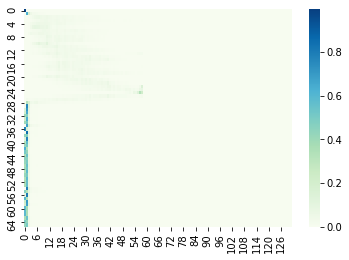

Train Dist: 16.80 Train Loss: 22.24


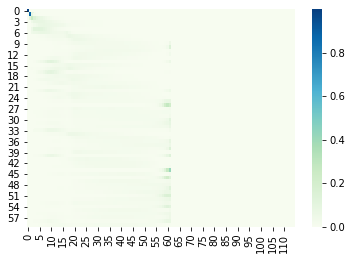

Val Dist: 27.17 Val Loss: 218.77
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 281/600 tf=0.9 af=0


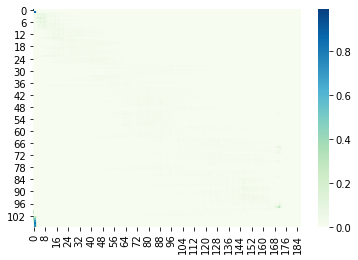

Train Dist: 15.99 Train Loss: 21.73


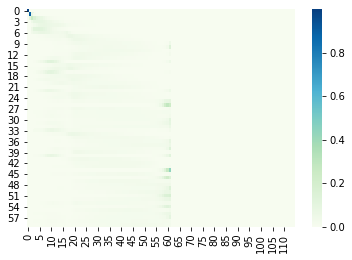

Val Dist: 26.60 Val Loss: 221.54
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 282/600 tf=0.9 af=0


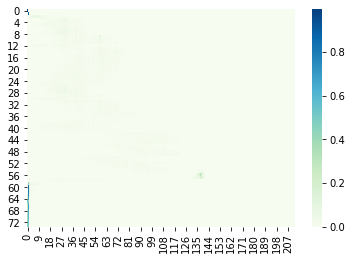

Train Dist: 15.83 Train Loss: 22.36


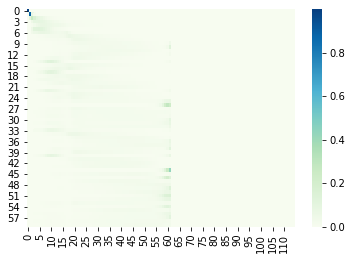

Val Dist: 27.77 Val Loss: 222.04
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 283/600 tf=0.9 af=0


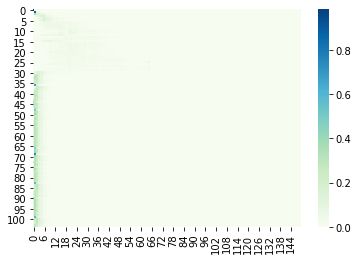

Train Dist: 18.37 Train Loss: 24.84


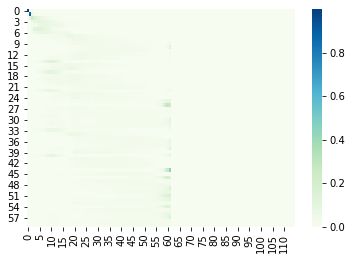

Val Dist: 27.75 Val Loss: 216.84
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 284/600 tf=0.9 af=0


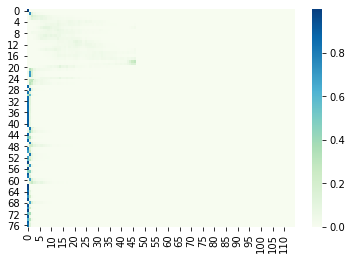

Train Dist: 16.31 Train Loss: 22.19


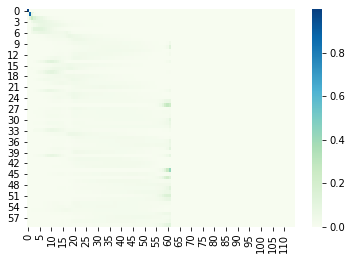

Val Dist: 27.61 Val Loss: 220.21
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 285/600 tf=0.9 af=0


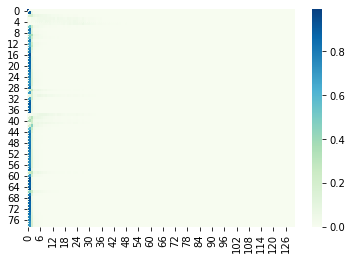

Train Dist: 15.97 Train Loss: 21.77


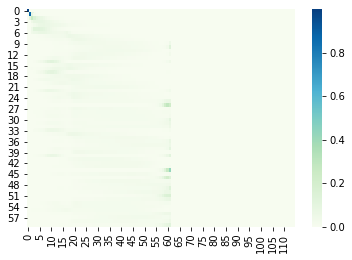

Val Dist: 27.09 Val Loss: 219.61
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 286/600 tf=0.9 af=0


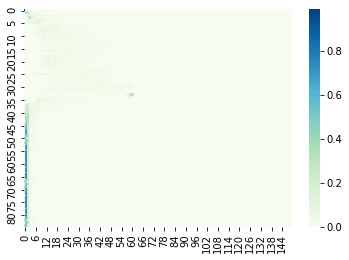

Train Dist: 15.99 Train Loss: 23.05


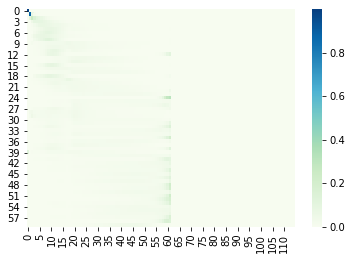

Val Dist: 28.30 Val Loss: 217.02
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 287/600 tf=0.9 af=0


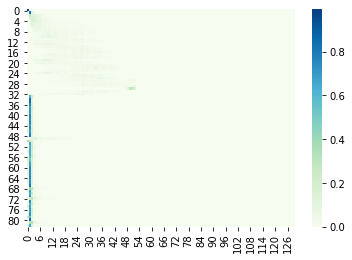

Train Dist: 16.89 Train Loss: 22.44


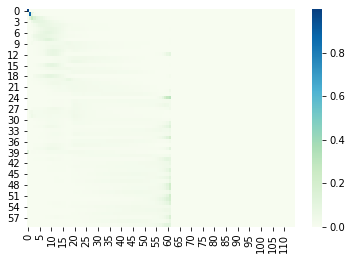

Val Dist: 28.17 Val Loss: 217.05
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 288/600 tf=0.9 af=0


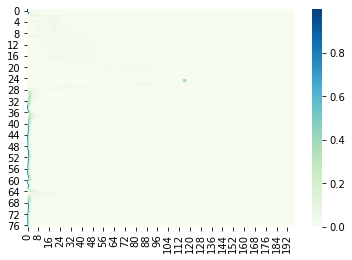

Train Dist: 15.64 Train Loss: 21.30


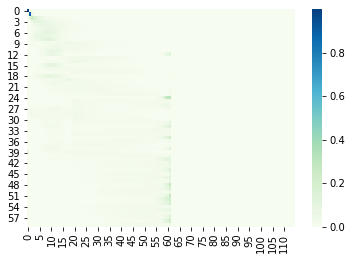

Val Dist: 28.22 Val Loss: 219.78
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 289/600 tf=0.9 af=0


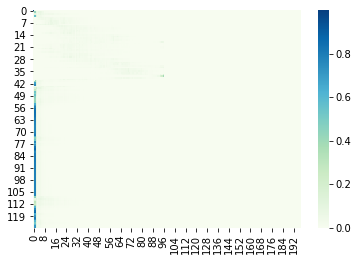

Train Dist: 15.80 Train Loss: 21.96


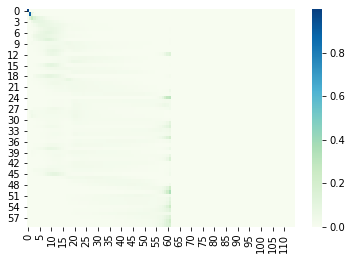

Val Dist: 27.22 Val Loss: 226.26
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 290/600 tf=0.9 af=0


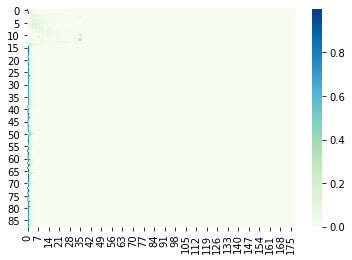

Train Dist: 16.21 Train Loss: 22.47


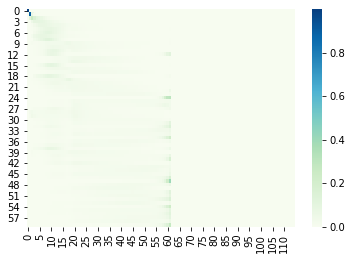

Val Dist: 27.38 Val Loss: 222.86
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 291/600 tf=0.9 af=0


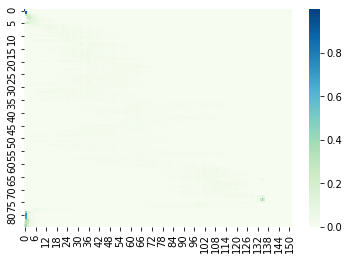

Train Dist: 16.10 Train Loss: 22.03


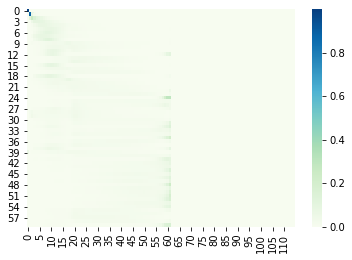

Val Dist: 27.83 Val Loss: 225.19
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 292/600 tf=0.9 af=0


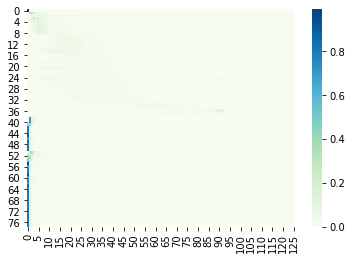

Train Dist: 16.08 Train Loss: 21.60


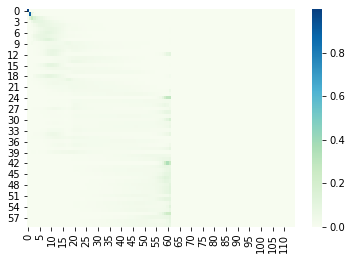

Val Dist: 27.62 Val Loss: 223.33
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 293/600 tf=0.9 af=0


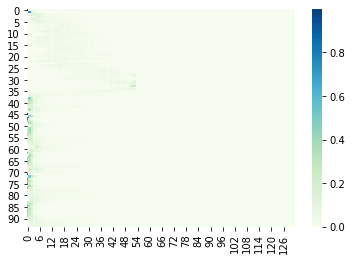

Train Dist: 15.27 Train Loss: 21.29


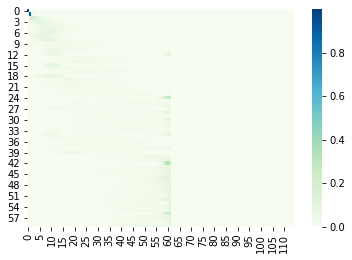

Val Dist: 28.76 Val Loss: 220.71
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 294/600 tf=0.9 af=0


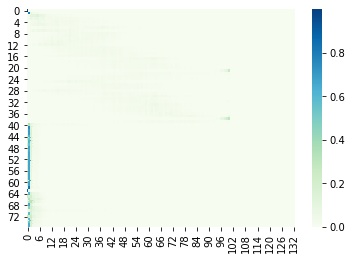

Train Dist: 15.07 Train Loss: 20.43


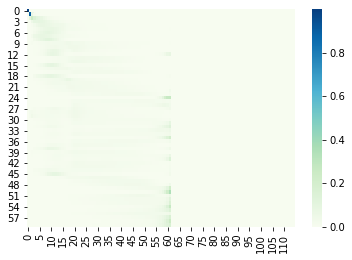

Val Dist: 28.56 Val Loss: 220.44
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 295/600 tf=0.9 af=0


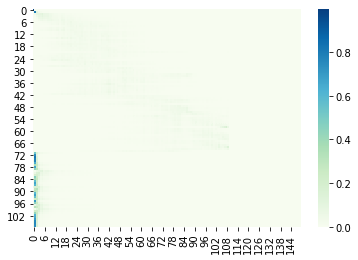

Train Dist: 15.47 Train Loss: 21.00


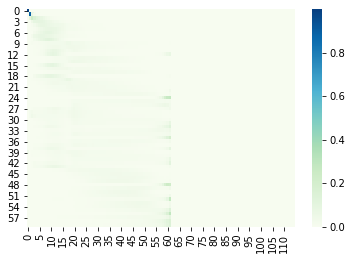

Val Dist: 28.76 Val Loss: 223.77
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 296/600 tf=0.9 af=0


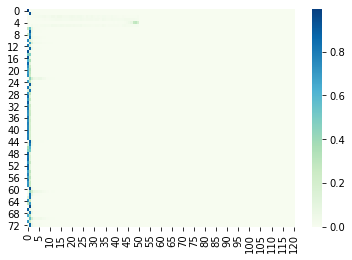

Train Dist: 15.94 Train Loss: 21.54


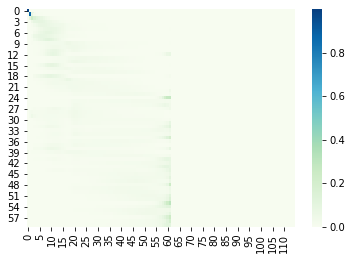

Val Dist: 28.78 Val Loss: 228.65
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 297/600 tf=0.9 af=0


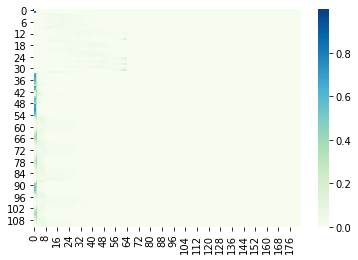

Train Dist: 17.28 Train Loss: 22.02


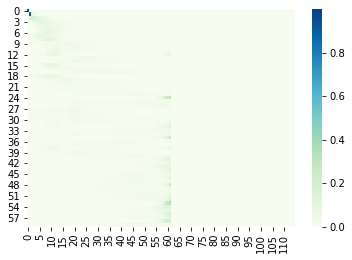

Val Dist: 27.95 Val Loss: 226.05
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 298/600 tf=0.9 af=0


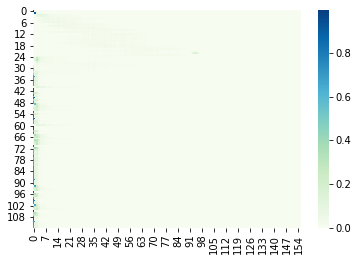

Train Dist: 14.63 Train Loss: 21.16


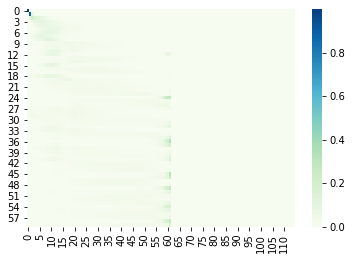

Val Dist: 27.81 Val Loss: 222.40
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 299/600 tf=0.9 af=0


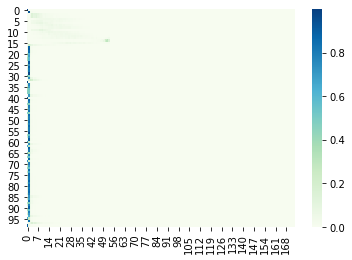

Train Dist: 18.14 Train Loss: 23.92


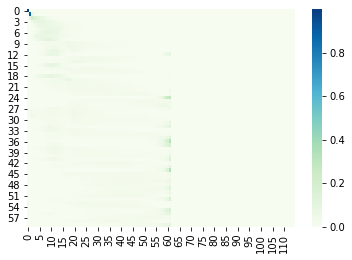

Val Dist: 27.28 Val Loss: 221.69
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 300/600 tf=0.9 af=0


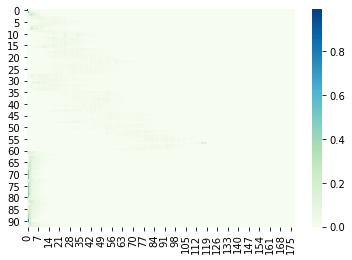

Train Dist: 14.97 Train Loss: 20.26


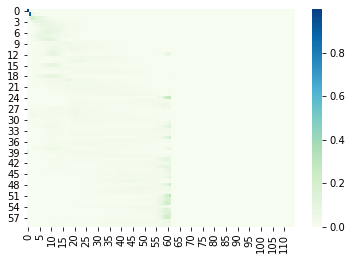

Val Dist: 28.08 Val Loss: 225.90
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 301/600 tf=0.895 af=0


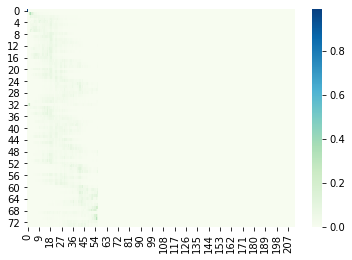

Train Dist: 15.65 Train Loss: 22.43


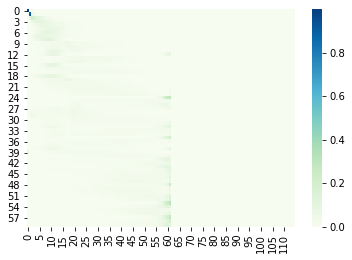

Val Dist: 28.01 Val Loss: 223.76
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 302/600 tf=0.89 af=0


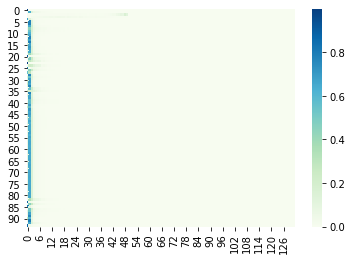

Train Dist: 15.13 Train Loss: 21.41


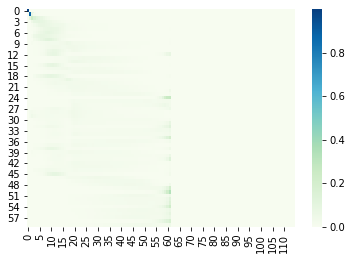

Val Dist: 28.34 Val Loss: 224.92
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 303/600 tf=0.885 af=0


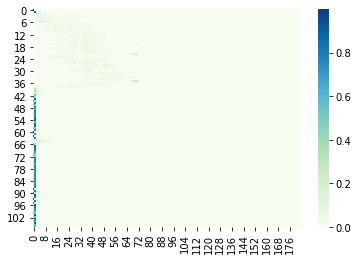

Train Dist: 17.03 Train Loss: 23.40


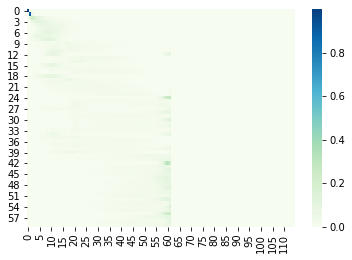

Val Dist: 28.07 Val Loss: 222.10
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 304/600 tf=0.88 af=0


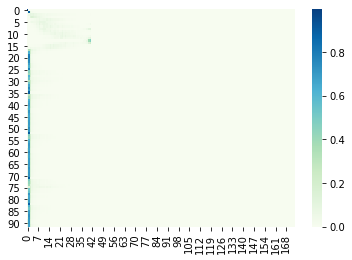

Train Dist: 14.24 Train Loss: 21.23


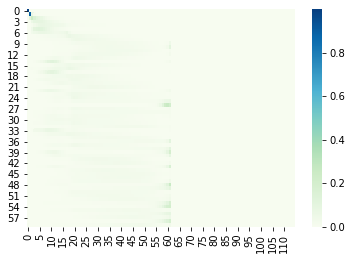

Val Dist: 28.02 Val Loss: 226.83
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 305/600 tf=0.875 af=0


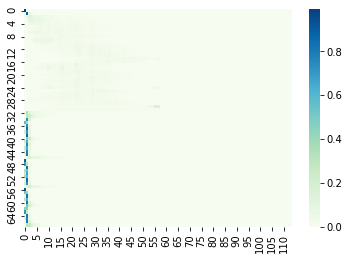

Train Dist: 18.41 Train Loss: 24.37


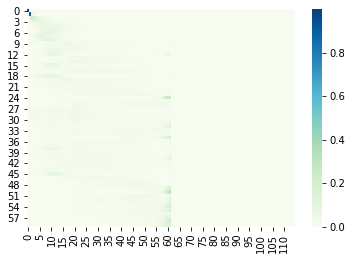

Val Dist: 28.39 Val Loss: 226.03
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 306/600 tf=0.87 af=0


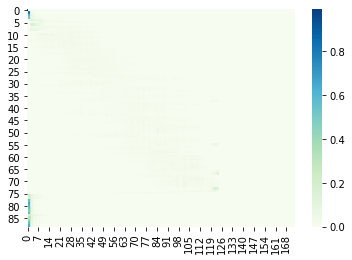

Train Dist: 15.51 Train Loss: 22.93


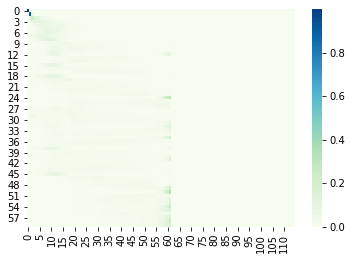

Val Dist: 28.25 Val Loss: 222.61
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 307/600 tf=0.865 af=0


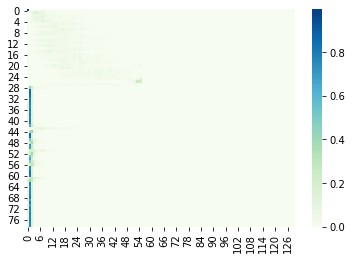

Train Dist: 16.06 Train Loss: 24.33


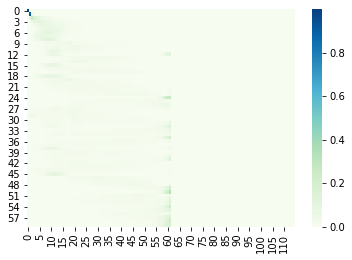

Val Dist: 27.95 Val Loss: 219.84
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 308/600 tf=0.86 af=0


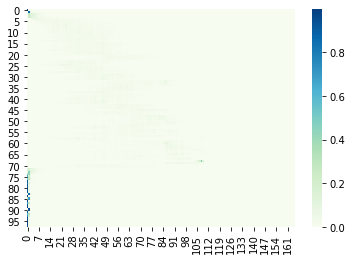

Train Dist: 18.29 Train Loss: 24.44


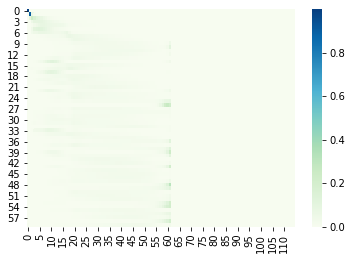

Val Dist: 28.32 Val Loss: 220.91
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 309/600 tf=0.855 af=0


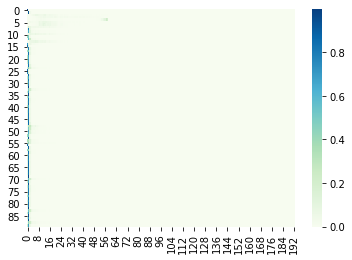

Train Dist: 19.47 Train Loss: 28.20


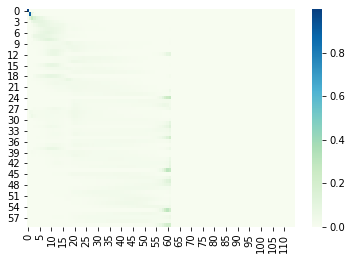

Val Dist: 28.26 Val Loss: 213.52
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 310/600 tf=0.85 af=0


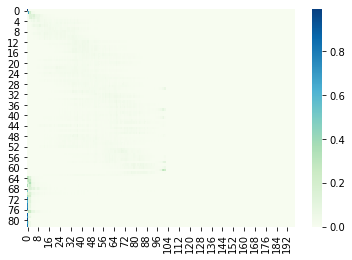

Train Dist: 18.63 Train Loss: 26.62


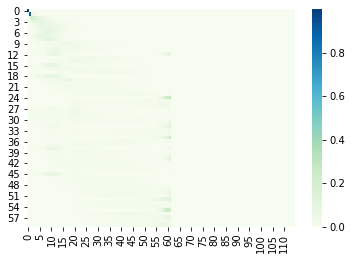

Val Dist: 29.58 Val Loss: 216.66
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 311/600 tf=0.845 af=0


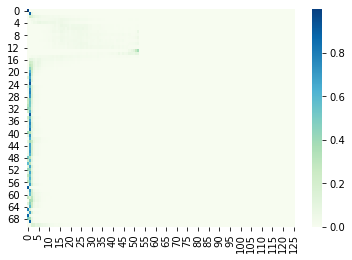

Train Dist: 16.72 Train Loss: 25.80


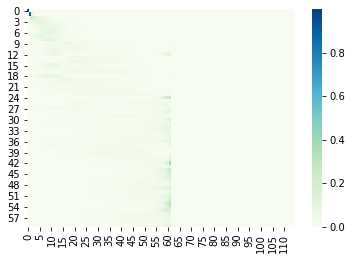

Val Dist: 28.90 Val Loss: 218.54
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 312/600 tf=0.8400000000000001 af=0


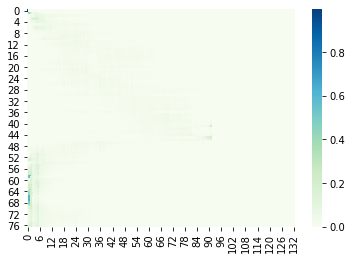

Train Dist: 17.66 Train Loss: 25.46


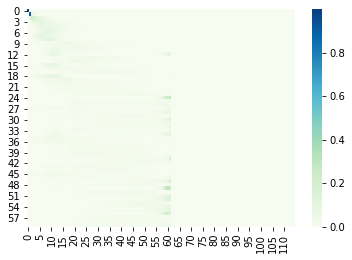

Val Dist: 28.76 Val Loss: 216.17
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 313/600 tf=0.835 af=0


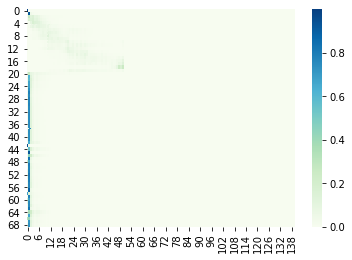

Train Dist: 18.69 Train Loss: 27.97


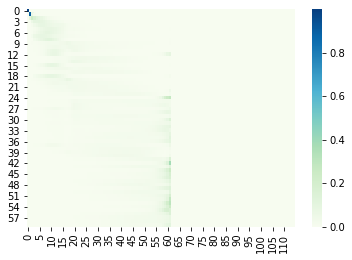

Val Dist: 28.95 Val Loss: 218.13
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 314/600 tf=0.8300000000000001 af=0


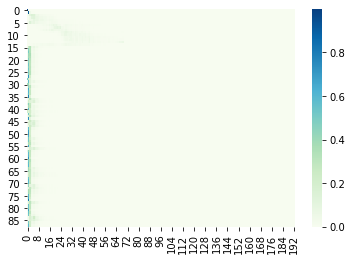

Train Dist: 18.05 Train Loss: 25.42


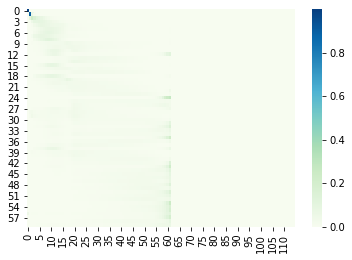

Val Dist: 28.51 Val Loss: 215.95
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 315/600 tf=0.8250000000000001 af=0


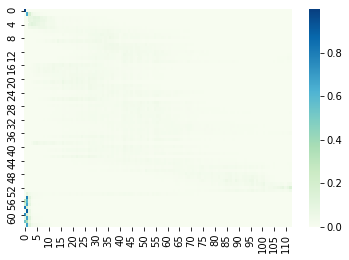

Train Dist: 19.99 Train Loss: 27.30


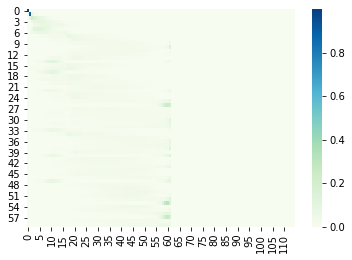

Val Dist: 28.10 Val Loss: 212.50
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 316/600 tf=0.8200000000000001 af=0


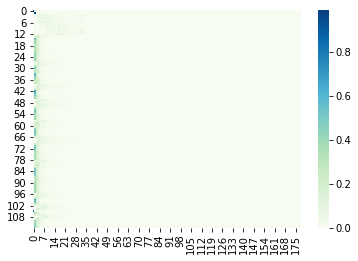

Train Dist: 18.84 Train Loss: 28.11


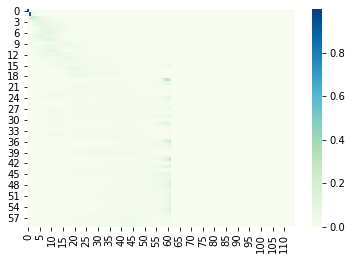

Val Dist: 28.14 Val Loss: 214.48
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 317/600 tf=0.8150000000000001 af=0


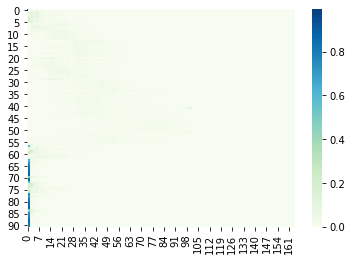

Train Dist: 19.31 Train Loss: 29.56


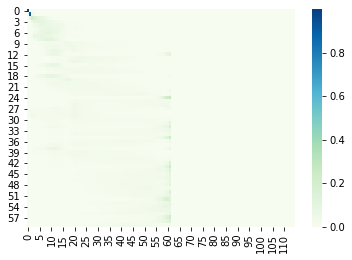

Val Dist: 28.81 Val Loss: 214.89
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 318/600 tf=0.81 af=0


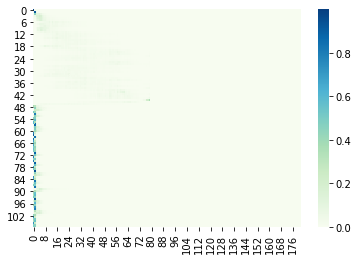

Train Dist: 20.51 Train Loss: 31.75


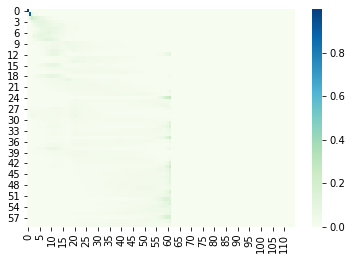

Val Dist: 28.94 Val Loss: 211.46
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 319/600 tf=0.805 af=0


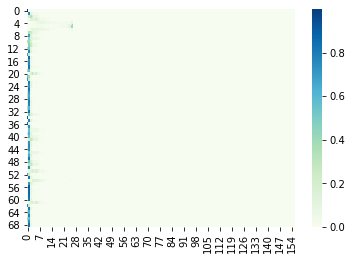

Train Dist: 24.78 Train Loss: 32.99


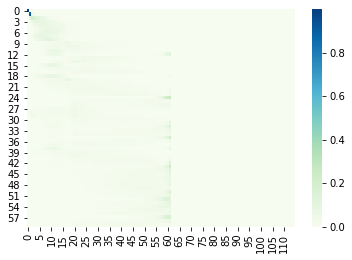

Val Dist: 27.44 Val Loss: 208.14
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 320/600 tf=0.8 af=0


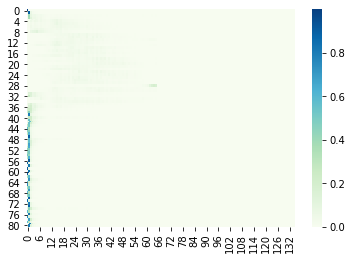

Train Dist: 22.17 Train Loss: 31.42


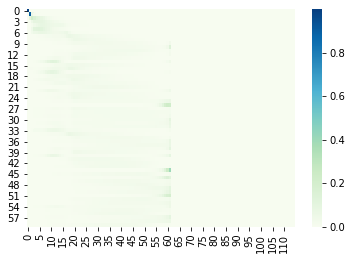

Val Dist: 28.79 Val Loss: 208.67
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 321/600 tf=0.795 af=0


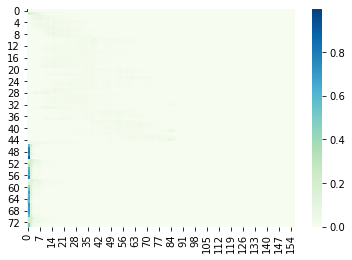

Train Dist: 20.25 Train Loss: 29.75


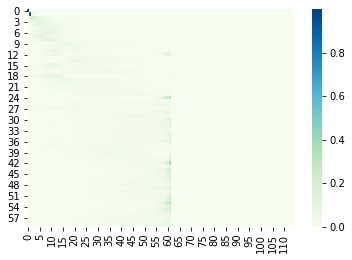

Val Dist: 28.44 Val Loss: 203.91
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 322/600 tf=0.79 af=0


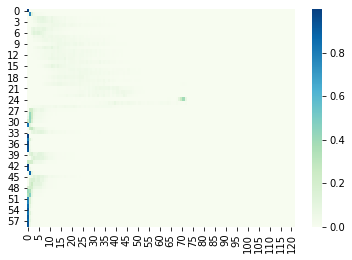

Train Dist: 22.18 Train Loss: 32.33


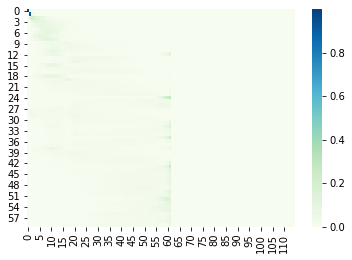

Val Dist: 28.88 Val Loss: 199.55
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 323/600 tf=0.785 af=0


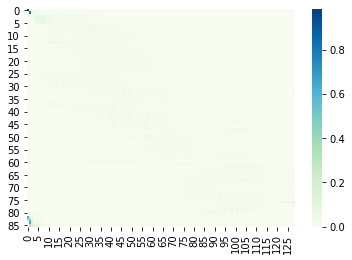

Train Dist: 21.28 Train Loss: 33.67


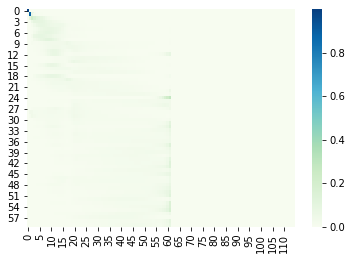

Val Dist: 28.80 Val Loss: 201.74
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 324/600 tf=0.78 af=0


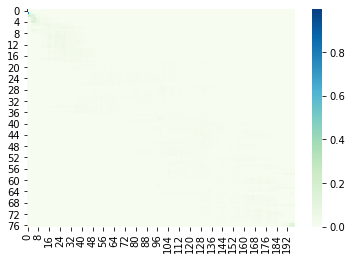

Train Dist: 24.42 Train Loss: 36.21


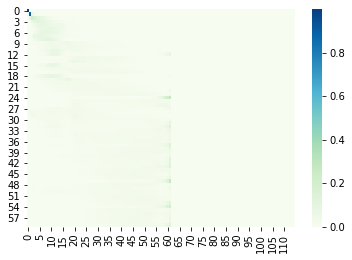

Val Dist: 28.52 Val Loss: 195.70
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 325/600 tf=0.775 af=0


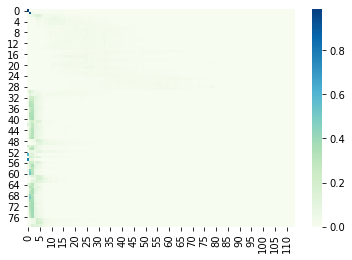

Train Dist: 22.21 Train Loss: 33.87


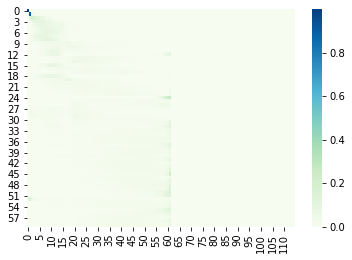

Val Dist: 28.20 Val Loss: 195.38
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 326/600 tf=0.77 af=0


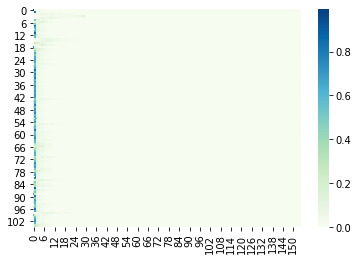

Train Dist: 23.36 Train Loss: 35.37


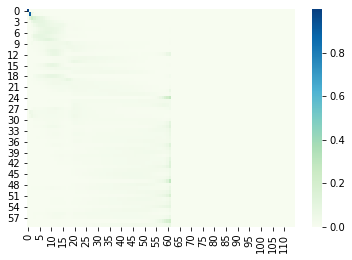

Val Dist: 28.15 Val Loss: 194.53
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 327/600 tf=0.765 af=0


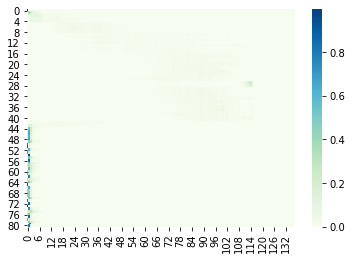

Train Dist: 24.57 Train Loss: 37.14


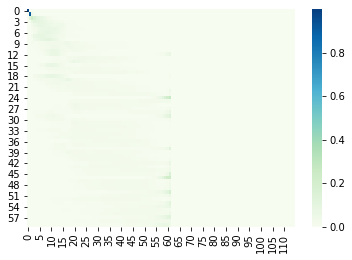

Val Dist: 28.13 Val Loss: 194.49
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 328/600 tf=0.76 af=0


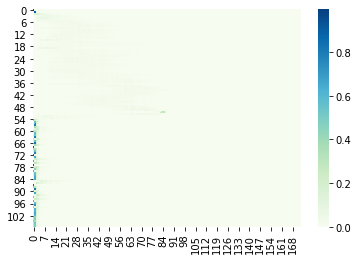

Train Dist: 27.16 Train Loss: 39.07


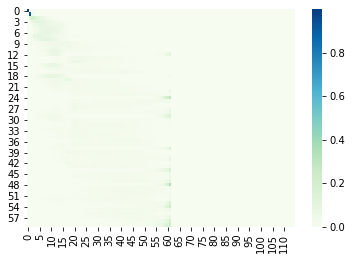

Val Dist: 28.13 Val Loss: 191.31
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 329/600 tf=0.755 af=0


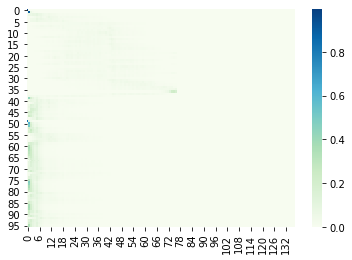

Train Dist: 23.03 Train Loss: 36.82


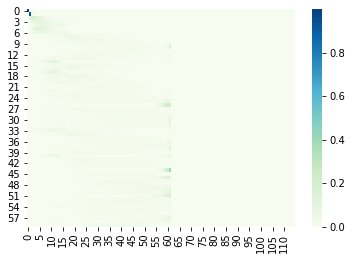

Val Dist: 28.74 Val Loss: 190.13
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 330/600 tf=0.75 af=0


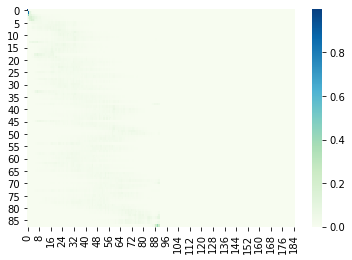

Train Dist: 23.59 Train Loss: 36.03


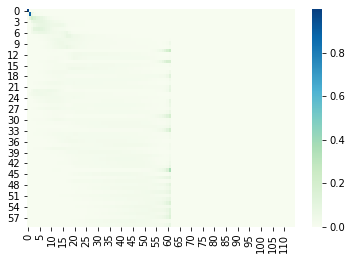

Val Dist: 28.48 Val Loss: 190.93
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 331/600 tf=0.745 af=0


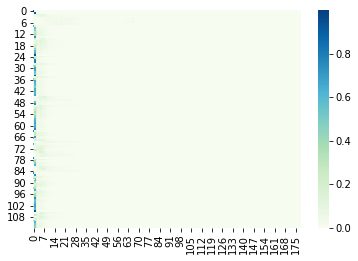

Train Dist: 25.75 Train Loss: 39.01


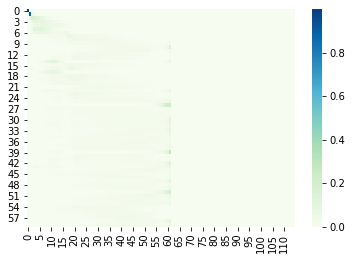

Val Dist: 28.37 Val Loss: 187.40
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 332/600 tf=0.74 af=0


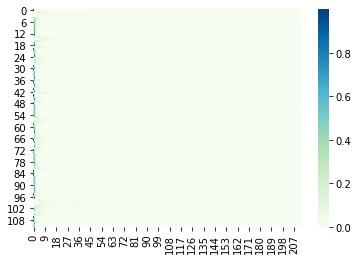

Train Dist: 25.45 Train Loss: 39.06


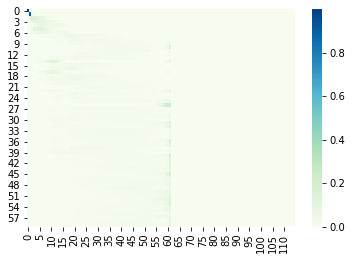

Val Dist: 27.84 Val Loss: 185.32
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 333/600 tf=0.735 af=0


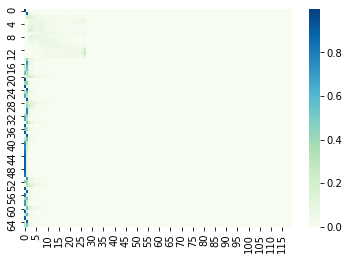

Train Dist: 25.60 Train Loss: 41.62


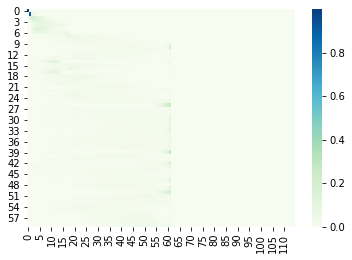

Val Dist: 27.47 Val Loss: 182.36
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 334/600 tf=0.73 af=0


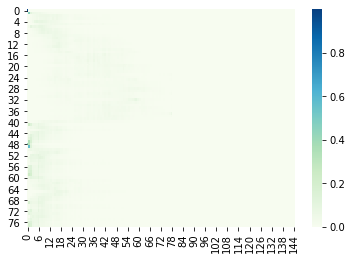

Train Dist: 23.07 Train Loss: 38.60


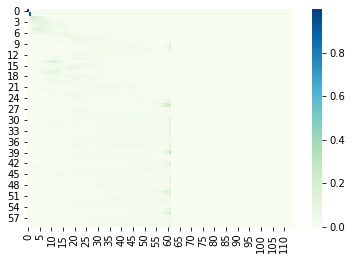

Val Dist: 29.53 Val Loss: 186.97
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 335/600 tf=0.725 af=0


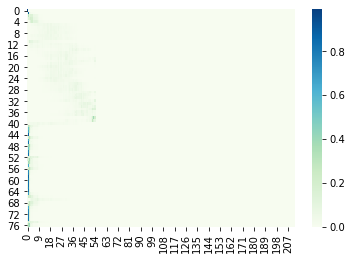

Train Dist: 26.82 Train Loss: 41.60


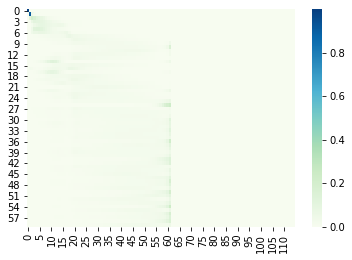

Val Dist: 28.65 Val Loss: 178.02
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 336/600 tf=0.72 af=0


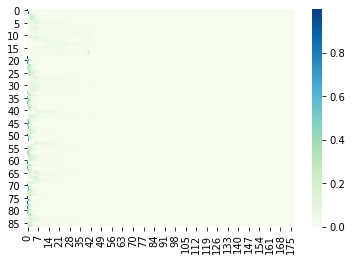

Train Dist: 28.07 Train Loss: 44.90


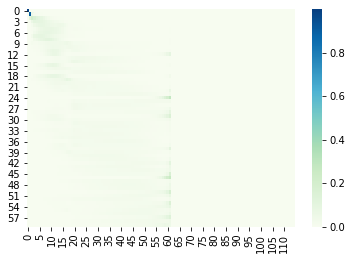

Val Dist: 27.86 Val Loss: 175.62
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 337/600 tf=0.7150000000000001 af=0


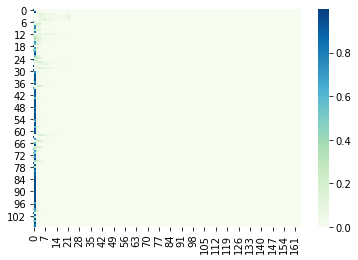

Train Dist: 25.23 Train Loss: 40.57


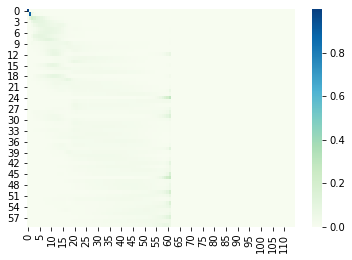

Val Dist: 28.63 Val Loss: 178.37
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 338/600 tf=0.71 af=0


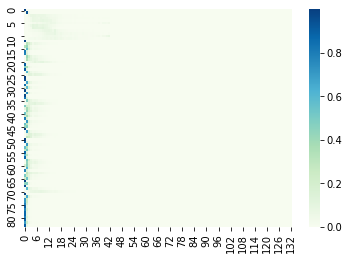

Train Dist: 27.52 Train Loss: 42.46


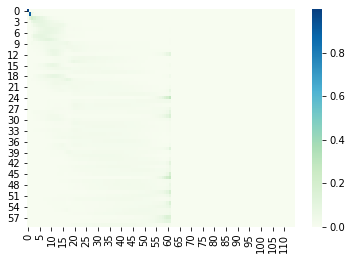

Val Dist: 27.91 Val Loss: 180.13
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 339/600 tf=0.7050000000000001 af=0


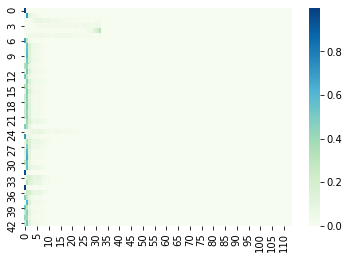

Train Dist: 29.24 Train Loss: 47.52


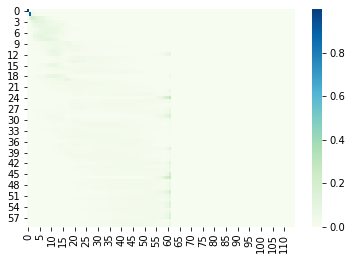

Val Dist: 27.44 Val Loss: 174.99
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 340/600 tf=0.7 af=0


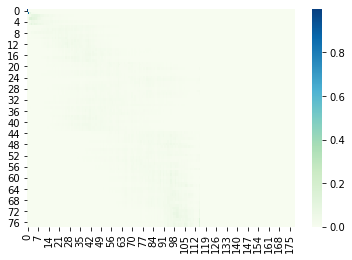

Train Dist: 27.98 Train Loss: 45.02


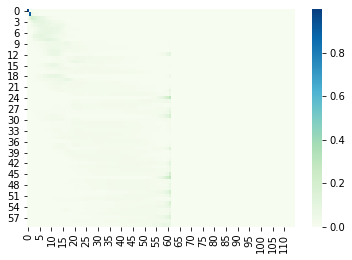

Val Dist: 28.52 Val Loss: 177.12
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 341/600 tf=0.6950000000000001 af=0


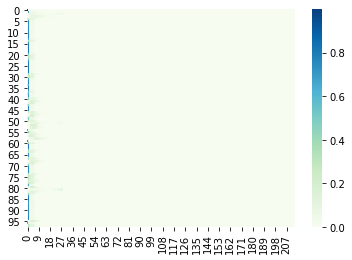

Train Dist: 29.34 Train Loss: 44.98


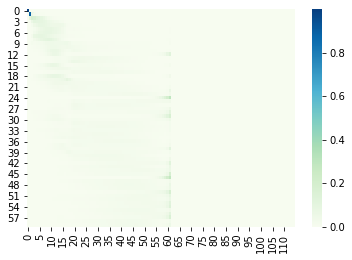

Val Dist: 27.97 Val Loss: 177.40
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 342/600 tf=0.6900000000000001 af=0


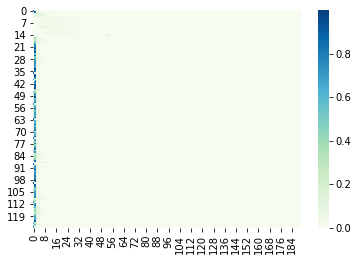

Train Dist: 26.01 Train Loss: 44.30


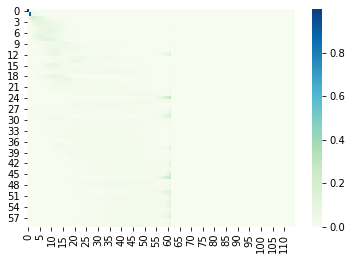

Val Dist: 27.73 Val Loss: 174.60
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 343/600 tf=0.685 af=0


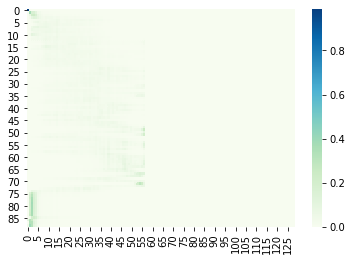

Train Dist: 31.00 Train Loss: 47.37


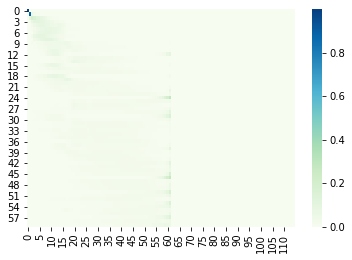

Val Dist: 27.76 Val Loss: 176.79
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 344/600 tf=0.68 af=0


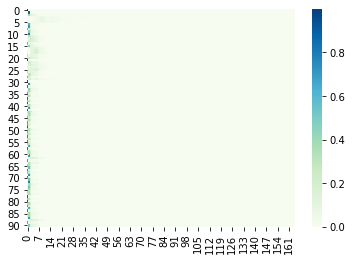

Train Dist: 27.98 Train Loss: 47.73


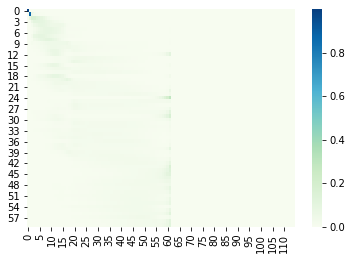

Val Dist: 27.35 Val Loss: 168.47
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 345/600 tf=0.675 af=0


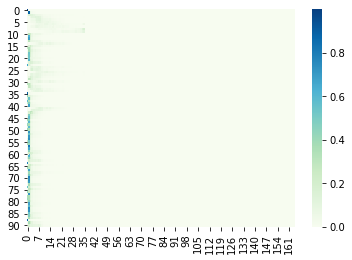

Train Dist: 31.18 Train Loss: 47.53


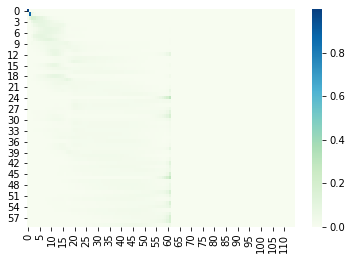

Val Dist: 27.74 Val Loss: 167.52
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 346/600 tf=0.67 af=0


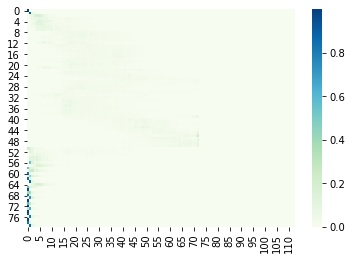

Train Dist: 31.31 Train Loss: 49.17


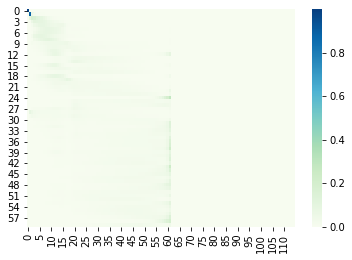

Val Dist: 28.33 Val Loss: 169.47
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 347/600 tf=0.665 af=0


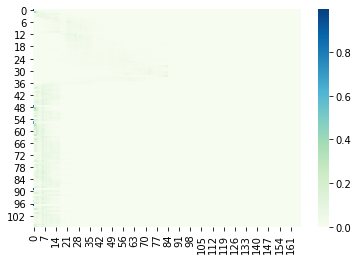

Train Dist: 32.84 Train Loss: 50.12


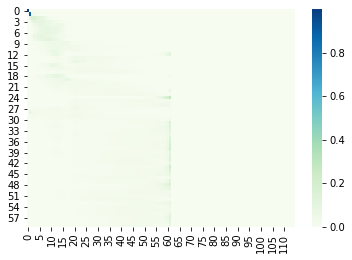

Val Dist: 28.32 Val Loss: 167.93
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 348/600 tf=0.66 af=0


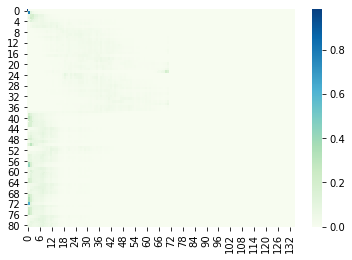

Train Dist: 29.30 Train Loss: 45.81


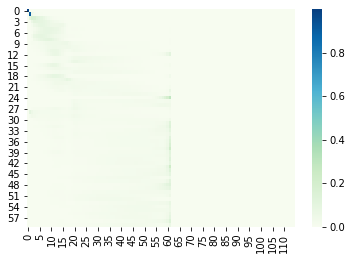

Val Dist: 28.88 Val Loss: 172.79
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 349/600 tf=0.655 af=0


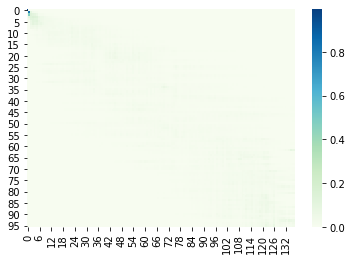

Train Dist: 31.30 Train Loss: 48.97


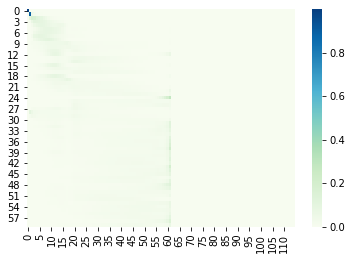

Val Dist: 28.97 Val Loss: 169.85
Adjusting learning rate of group 0 to 3.6000e-05.

Epoch 350/600 tf=0.65 af=0


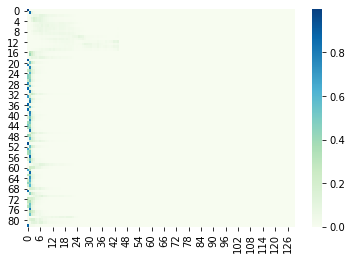

Train Dist: 33.63 Train Loss: 51.84


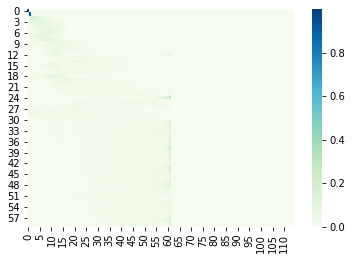

Val Dist: 28.73 Val Loss: 167.20
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 351/600 tf=0.65 af=0


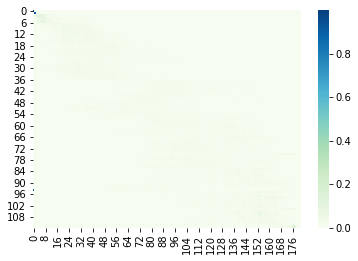

Train Dist: 33.23 Train Loss: 51.96


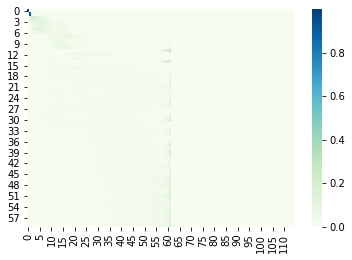

Val Dist: 29.26 Val Loss: 169.95
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 352/600 tf=0.65 af=0


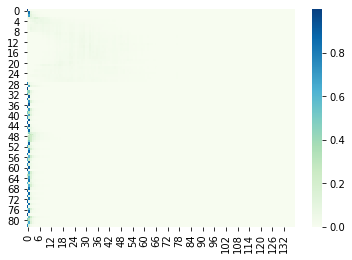

Train Dist: 30.30 Train Loss: 48.24


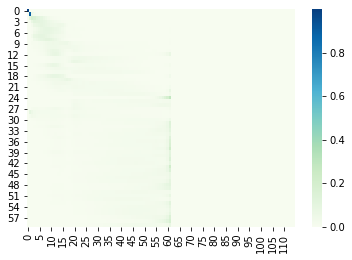

Val Dist: 29.45 Val Loss: 171.28
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 353/600 tf=0.65 af=0


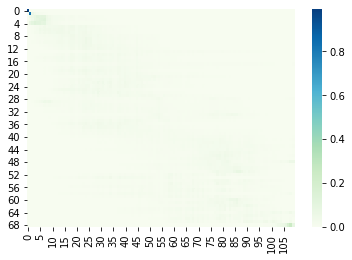

Train Dist: 31.53 Train Loss: 49.04


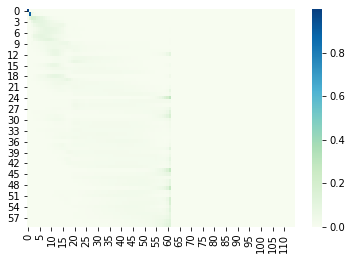

Val Dist: 28.81 Val Loss: 169.40
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 354/600 tf=0.65 af=0


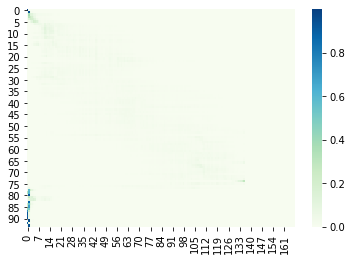

Train Dist: 32.11 Train Loss: 50.34


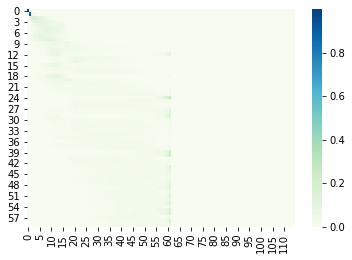

Val Dist: 28.80 Val Loss: 168.21
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 355/600 tf=0.65 af=0


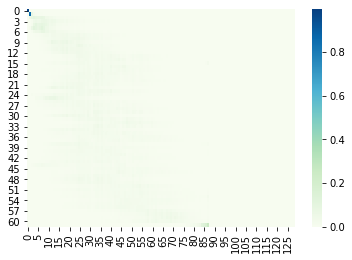

Train Dist: 32.02 Train Loss: 49.80


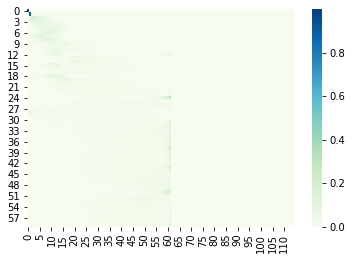

Val Dist: 28.90 Val Loss: 170.61
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 356/600 tf=0.65 af=0


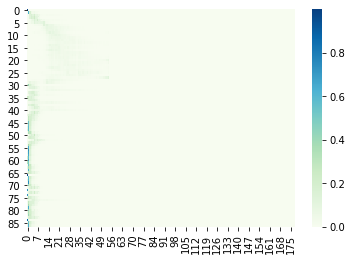

Train Dist: 31.91 Train Loss: 51.99


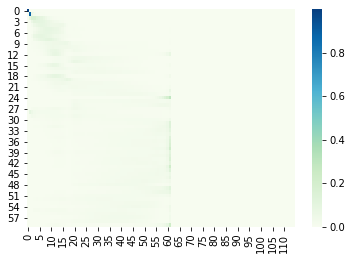

Val Dist: 28.64 Val Loss: 167.19
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 357/600 tf=0.65 af=0


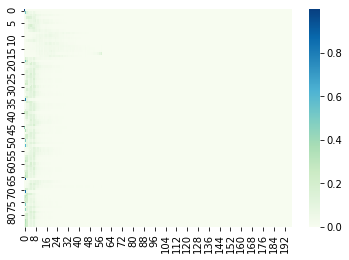

Train Dist: 33.81 Train Loss: 51.18


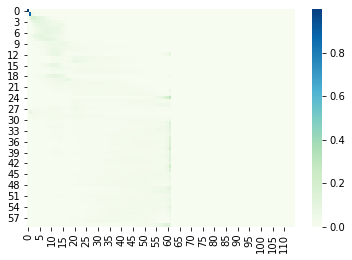

Val Dist: 29.63 Val Loss: 170.30
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 358/600 tf=0.65 af=0


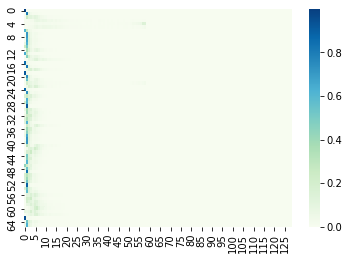

Train Dist: 31.14 Train Loss: 50.49


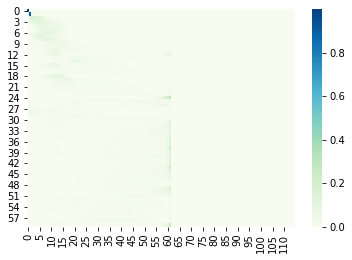

Val Dist: 29.92 Val Loss: 171.42
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 359/600 tf=0.65 af=0


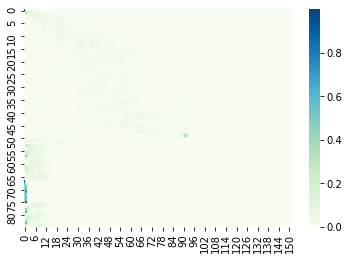

Train Dist: 30.47 Train Loss: 49.69


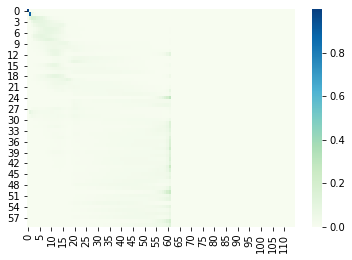

Val Dist: 28.56 Val Loss: 171.64
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 360/600 tf=0.65 af=0


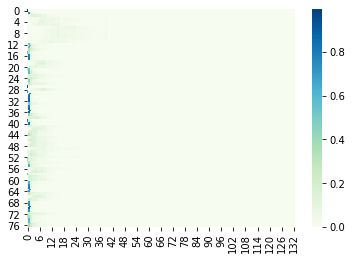

Train Dist: 30.73 Train Loss: 50.06


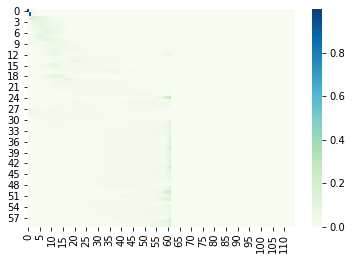

Val Dist: 28.77 Val Loss: 172.28
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 361/600 tf=0.65 af=0


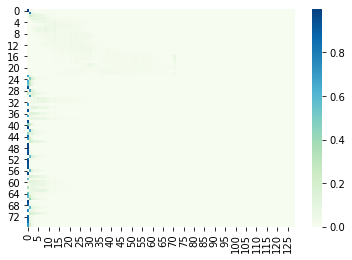

Train Dist: 31.70 Train Loss: 49.84


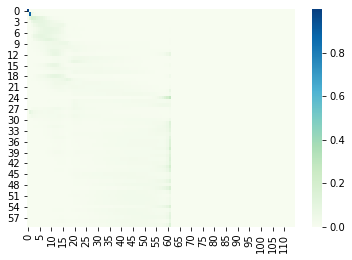

Val Dist: 29.14 Val Loss: 171.85
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 362/600 tf=0.65 af=0


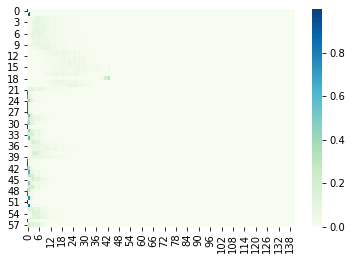

Train Dist: 27.15 Train Loss: 46.30


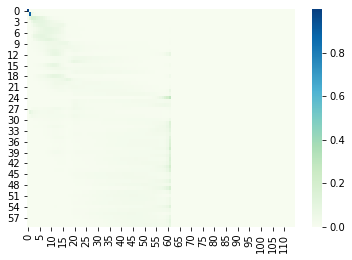

Val Dist: 29.44 Val Loss: 171.94
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 363/600 tf=0.65 af=0


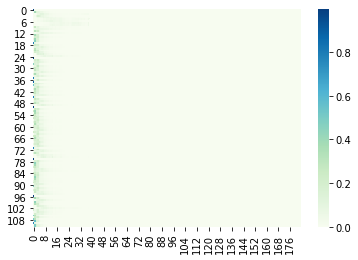

Train Dist: 32.38 Train Loss: 53.56


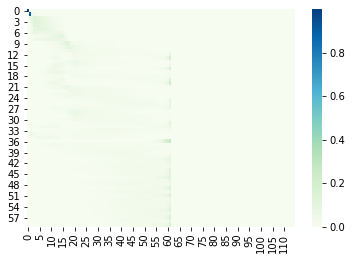

Val Dist: 28.93 Val Loss: 168.21
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 364/600 tf=0.65 af=0


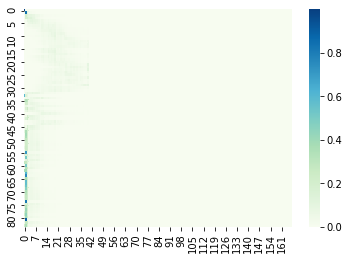

Train Dist: 31.47 Train Loss: 50.02


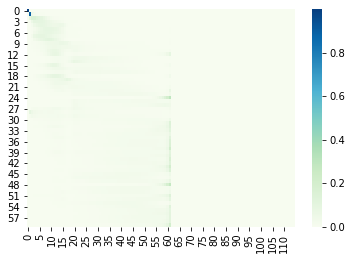

Val Dist: 28.95 Val Loss: 167.29
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 365/600 tf=0.65 af=0


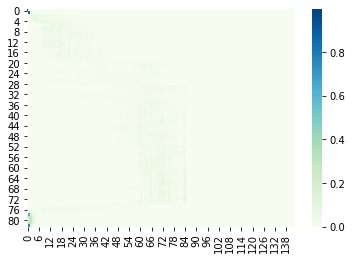

Train Dist: 30.69 Train Loss: 50.46


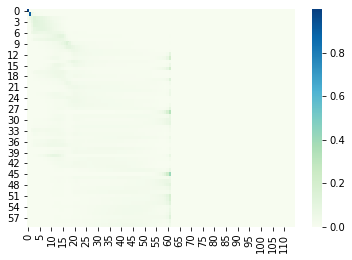

Val Dist: 29.74 Val Loss: 171.53
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 366/600 tf=0.65 af=0


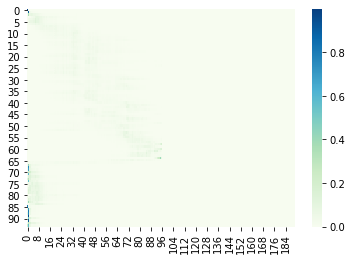

Train Dist: 30.58 Train Loss: 49.68


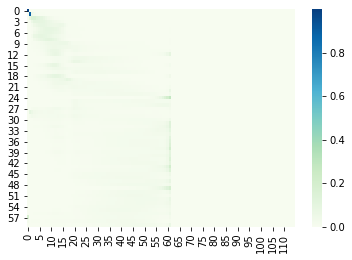

Val Dist: 29.03 Val Loss: 170.01
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 367/600 tf=0.65 af=0


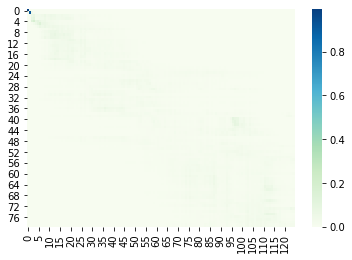

Train Dist: 31.31 Train Loss: 52.60


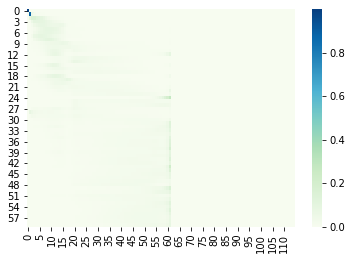

Val Dist: 29.41 Val Loss: 166.83
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 368/600 tf=0.65 af=0


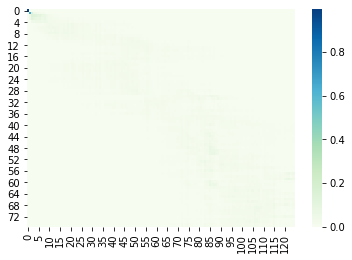

Train Dist: 34.70 Train Loss: 54.93


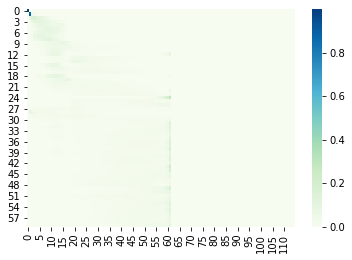

Val Dist: 29.14 Val Loss: 166.90
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 369/600 tf=0.65 af=0


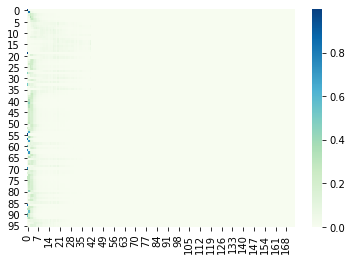

Train Dist: 30.27 Train Loss: 48.43


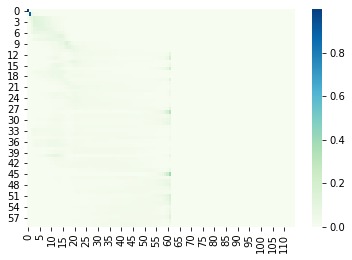

Val Dist: 29.06 Val Loss: 165.46
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 370/600 tf=0.65 af=0


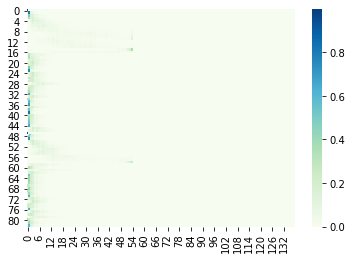

Train Dist: 33.29 Train Loss: 51.67


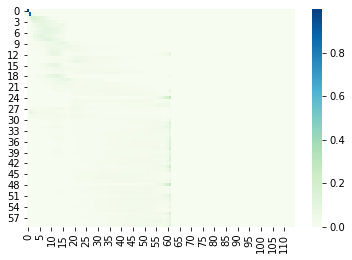

Val Dist: 28.80 Val Loss: 161.46
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 371/600 tf=0.65 af=0


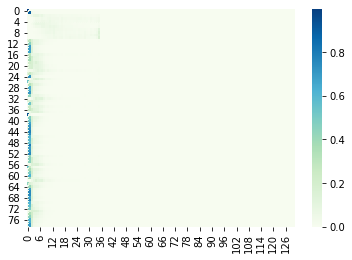

Train Dist: 31.60 Train Loss: 50.14


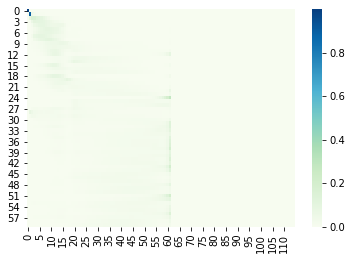

Val Dist: 28.59 Val Loss: 162.70
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 372/600 tf=0.65 af=0


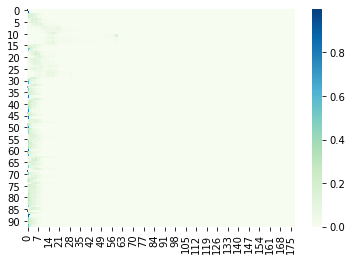

Train Dist: 30.21 Train Loss: 50.31


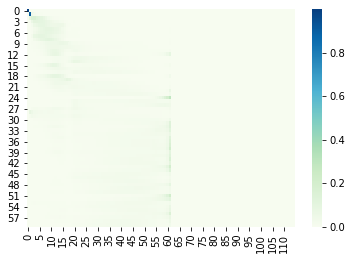

Val Dist: 29.12 Val Loss: 168.89
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 373/600 tf=0.65 af=0


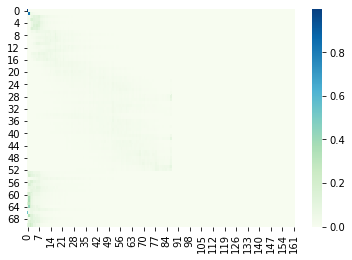

Train Dist: 30.78 Train Loss: 49.41


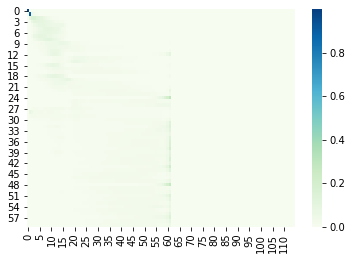

Val Dist: 28.36 Val Loss: 165.53
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 374/600 tf=0.65 af=0


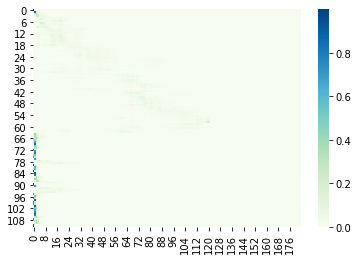

Train Dist: 31.72 Train Loss: 50.78


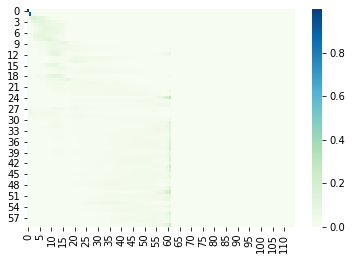

Val Dist: 29.69 Val Loss: 168.44
Adjusting learning rate of group 0 to 2.1600e-05.

Epoch 375/600 tf=0.65 af=0


In [ ]:
session.train(600, checkpoint=0)